In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score


In [ ]:
# df1 = pd.read_csv('/home/fanny/Profiles/export__TSV_17668_20250725_1143_CTD-50/ecotaxa_export__TSV_17668_20250725_1143.tsv', sep='\t')
# df2 = pd.read_csv('/home/fanny/Profiles/export__TSV_17785_20250725_1020_CTD-37-60-75-81/ecotaxa_export__TSV_17785_20250725_1020.tsv', sep='\t')
# df = pd.concat([df1, df2], ignore_index=True)


ViT_validated_CTD50_df = pd.read_csv('/home/fanny/Profiles/export__TSV_17668_20250818_1533_CTD-50/ecotaxa_export__TSV_17668_20250818_1533.tsv', sep='\t')
ViT_fully_predicted_df = pd.read_csv('/home/fanny/Profiles/export__TSV_17785_20250818_1537__M181_PISCO2_deconv_fully_ViT_predicted/ecotaxa_export__TSV_17785_20250818_1537.tsv', sep='\t')


ViT_validated_CTD37_df = ViT_fully_predicted_df[ViT_fully_predicted_df['sample_id'] == 'M181-112-1_CTD-037_00Â°00S-008Â°00W_20220504-1758']
ViT_validated_CTD60_df = ViT_fully_predicted_df[ViT_fully_predicted_df['sample_id'] == 'M181-227-1_CTD-060_00Â°00S-027Â°00W_20220512-1748']
ViT_validated_CTD75_df = ViT_fully_predicted_df[ViT_fully_predicted_df['sample_id'] == 'M181-285-1_CTD-075_00Â°00S-039Â°00W_20220517-2024']
ViT_validated_CTD81_df = ViT_fully_predicted_df[ViT_fully_predicted_df['sample_id'] == 'M181-297-1_CTD-081_00Â°00S-041Â°50W_20220519-0218']

#print(ViT_validated_CTD50_df.columns)
#print(ViT_validated_CTD37_df.columns)

df_five_profiles = pd.concat([ViT_validated_CTD50_df, ViT_validated_CTD37_df, ViT_validated_CTD60_df, ViT_validated_CTD75_df, ViT_validated_CTD81_df], ignore_index=True)
#print(df.columns)
#print(df_five_profiles['object_annotation_category'].unique())


/tmp/ipykernel_2327386/2847296271.py:7: DtypeWarning: Columns (9,10,11,12) have mixed types. Specify dtype option on import or set low_memory=False.
  ViT_fully_predicted_df = pd.read_csv('/home/fanny/Profiles/export__TSV_17785_20250818_1537__M181_PISCO2_deconv_fully_ViT_predicted/ecotaxa_export__TSV_17785_20250818_1537.tsv', sep='\t')


In [ ]:
def calc_precision(tp, fp):     # Precision = True Positives / (True Positives + False Positives)
    if tp + fp == 0:
        return 0.0
    return tp / (tp + fp)

In [6]:
#df = pd.read_csv('/home/fanny/Downloads/export__TSV_17668_20250711_1238/ecotaxa_export__TSV_17668_20250711_1238.tsv', sep='\t')

precision_results = {}

for group, group_df in df.groupby('object_annotation_category'):
    tp = (group_df['object_annotation_status'] == 'validated').sum()
    pp = len(group_df)
    precision = tp / pp if pp > 0 else None # Precision = True Positives / Total Predictions

    precision_results[group] = precision

precision_df = pd.DataFrame(list(precision_results.items()), columns=['Taxonomic Group', 'Precision'])
print(precision_df)

         Taxonomic Group  Precision
0         Appendicularia   0.491353
1      Asteroidea larvae   0.284722
2      Bacillariophyceae   0.014320
3              Calanoida   0.924751
4           Chaetognatha   0.647321
5       Cnidaria<Metazoa   0.687776
6   Copepoda<Maxillopoda   0.515697
7     Ctenophora<Metazoa   0.309278
8         Eumalacostraca   0.773585
9          Noctiluca sp.   0.192982
10               Oithona   0.411963
11            Pyrocystis   0.137652
12              Rhizaria   0.359119
13             Thaliacea   0.359504
14            not-living   0.000000
15                  puff   0.996372
16                  tuft   0.994028


/tmp/ipykernel_833581/2650286006.py:6: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_binned = df.groupby('object_annotation_category', group_keys=False).apply(bin_group)


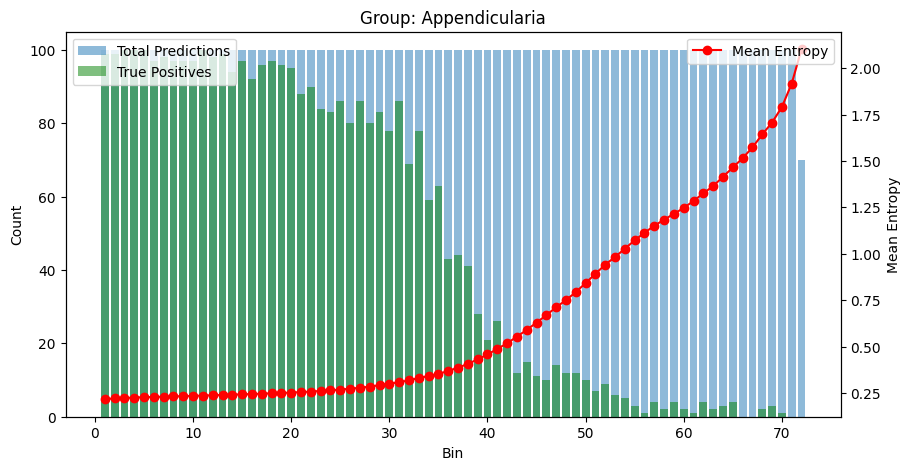

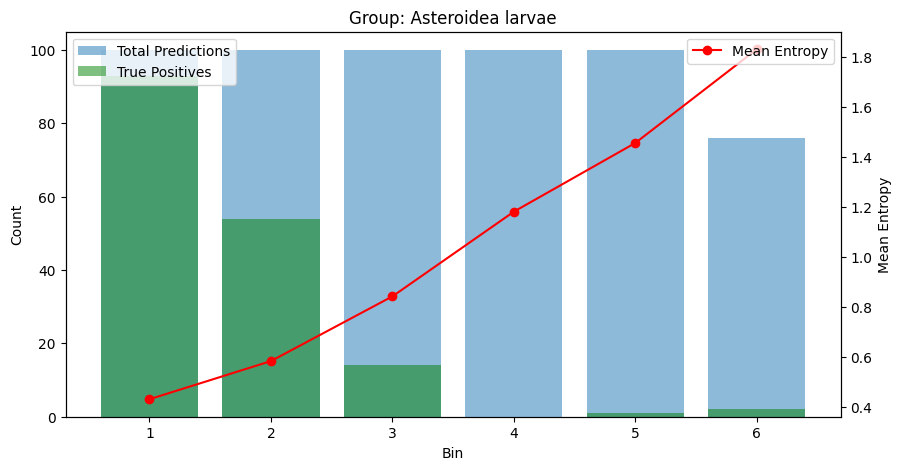

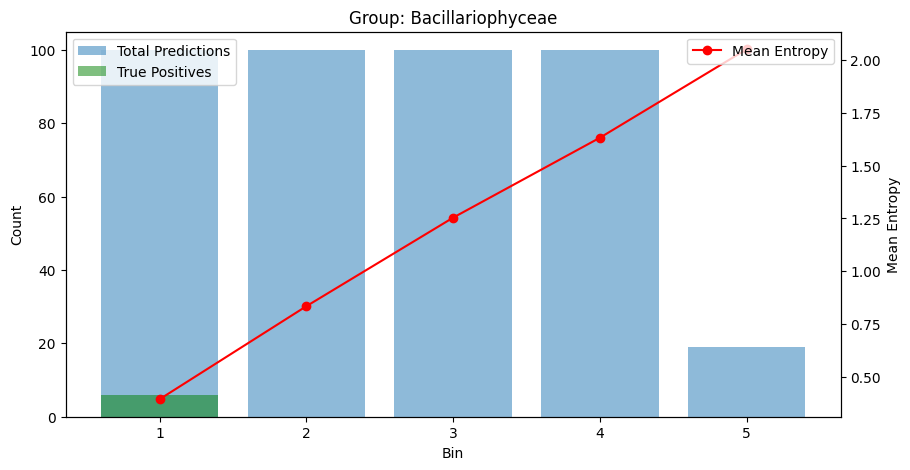

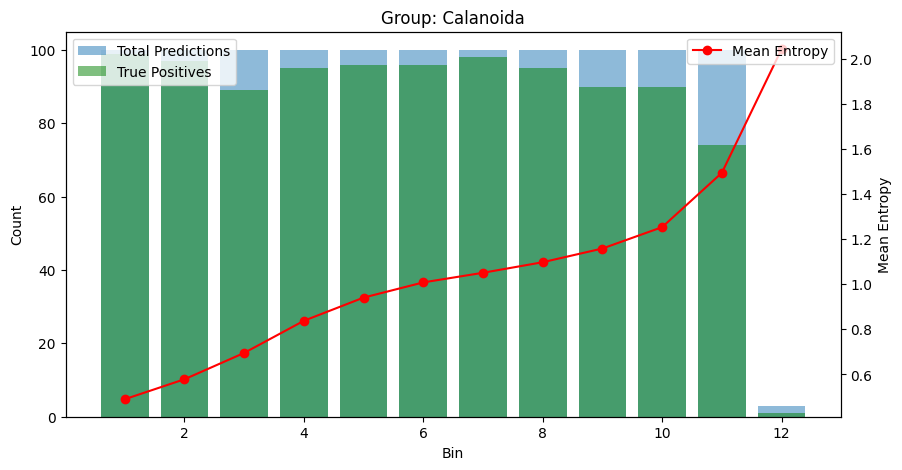

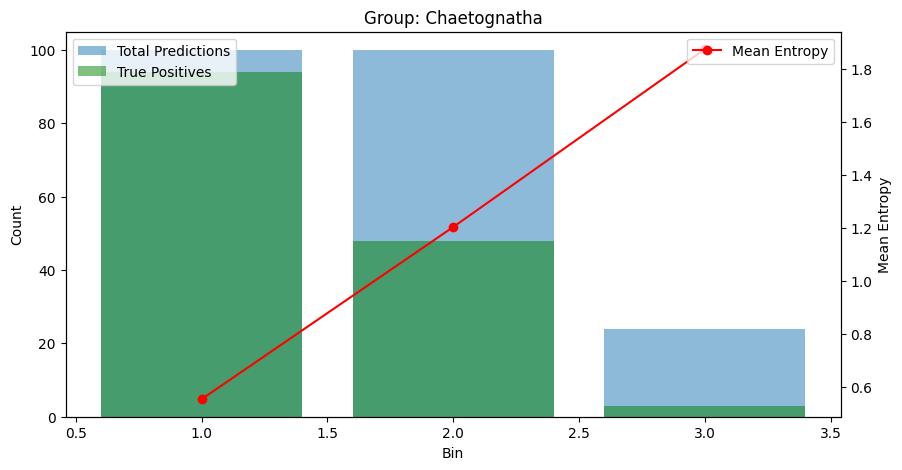

...

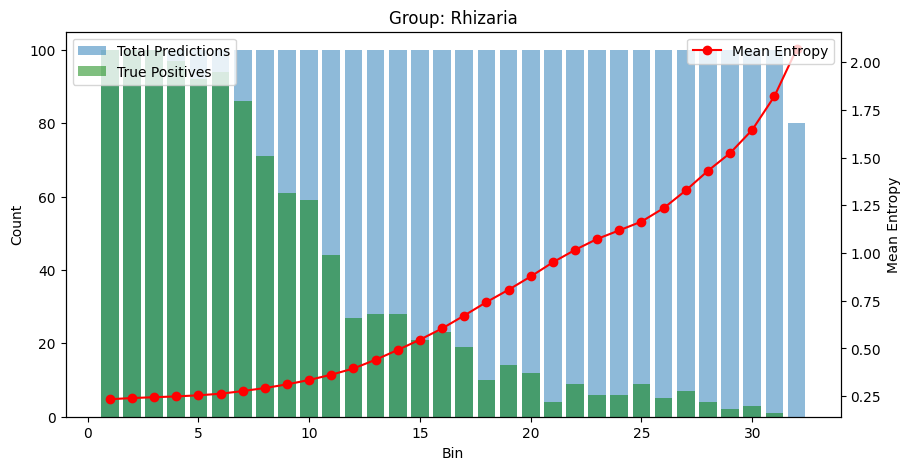

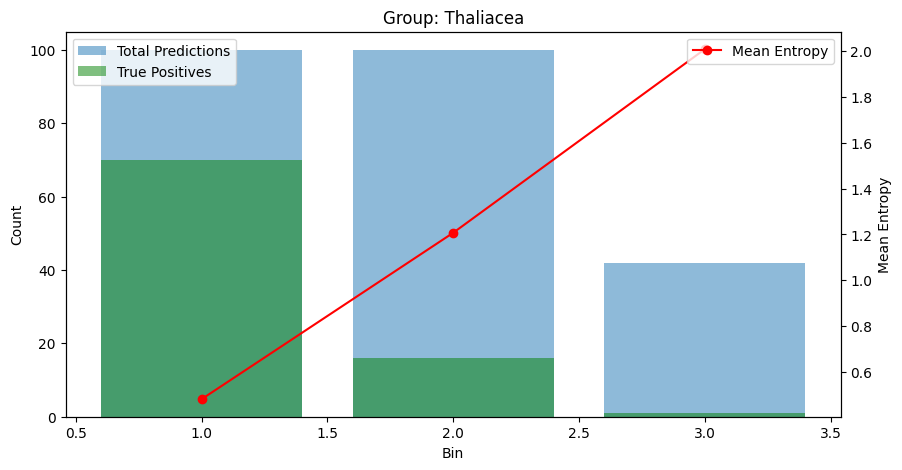

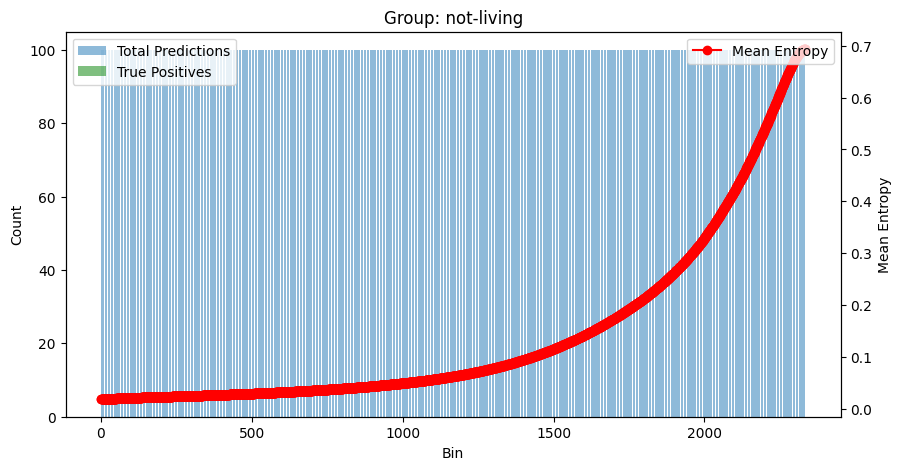

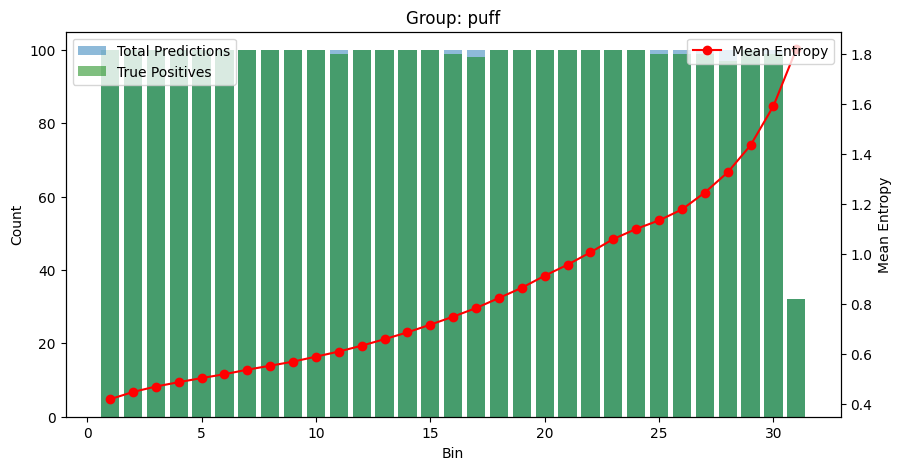

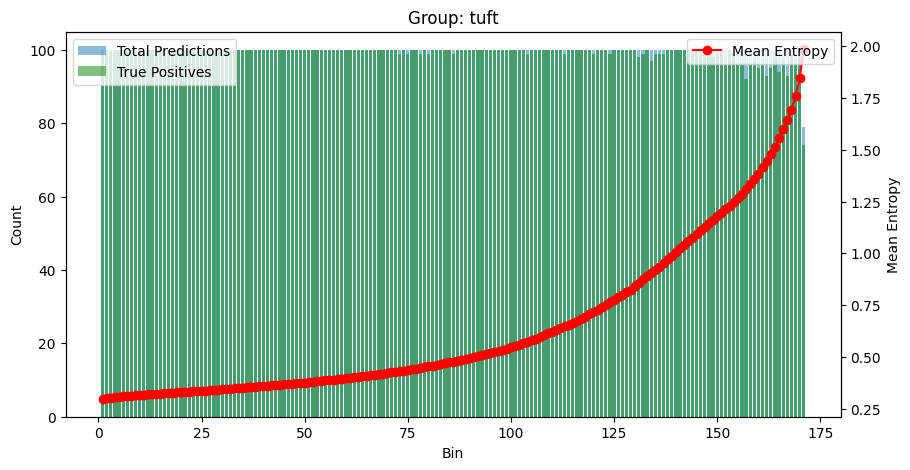

In [7]:
def bin_group(group_df):
    group_df = group_df.sort_values('object_entropy', ascending=True).reset_index(drop=True)
    group_df['bin'] = (group_df.index // 100) + 1
    return group_df

df_binned = df.groupby('object_annotation_category', group_keys=False).apply(bin_group)

# Calculate stats per bin
bin_stats = df_binned.groupby(['object_annotation_category', 'bin']).agg(
    total_predictions=('object_id', 'count'),
    true_positives=('object_annotation_status', lambda x: (x == 'validated').sum()),
    mean_entropy=('object_entropy', 'mean')
).reset_index()

# Plot for each group
for group in bin_stats['object_annotation_category'].unique():
    group_data = bin_stats[bin_stats['object_annotation_category'] == group]
    fig, ax1 = plt.subplots(figsize=(10,5))
    ax1.bar(group_data['bin'], group_data['total_predictions'], alpha=0.5, label='Total Predictions')
    ax1.bar(group_data['bin'], group_data['true_positives'], alpha=0.5, label='True Positives', color='green')
    ax1.set_xlabel('Bin')
    ax1.set_ylabel('Count')
    ax1.legend(loc='upper left')
    ax2 = ax1.twinx()
    ax2.plot(group_data['bin'], group_data['mean_entropy'], color='red', marker='o', label='Mean Entropy')
    ax2.set_ylabel('Mean Entropy')
    ax2.legend(loc='upper right')
    plt.title(f'Group: {group}')
    plt.show()

/tmp/ipykernel_833581/3263653119.py:8: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_binned_percent = df.groupby('object_annotation_category', group_keys=False).apply(bin_group_percent)
/tmp/ipykernel_833581/3263653119.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats_percent = df_binned_percent.groupby(['object_annotation_category', 'percent_bin']).agg(


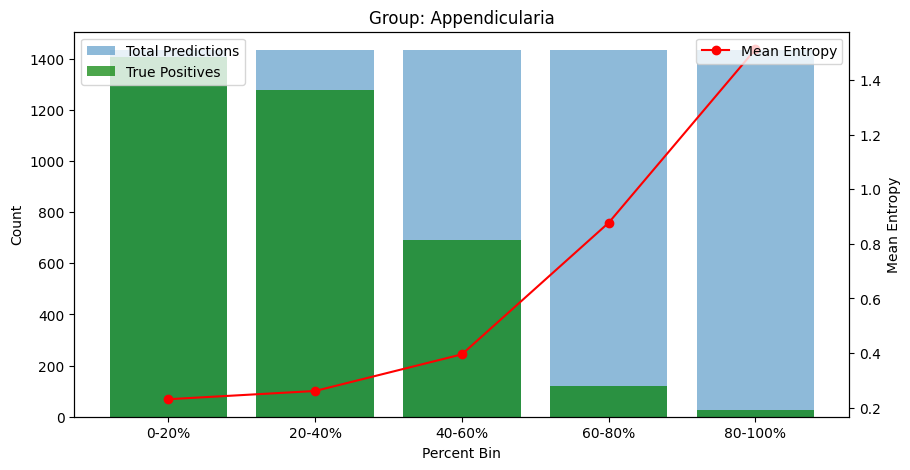

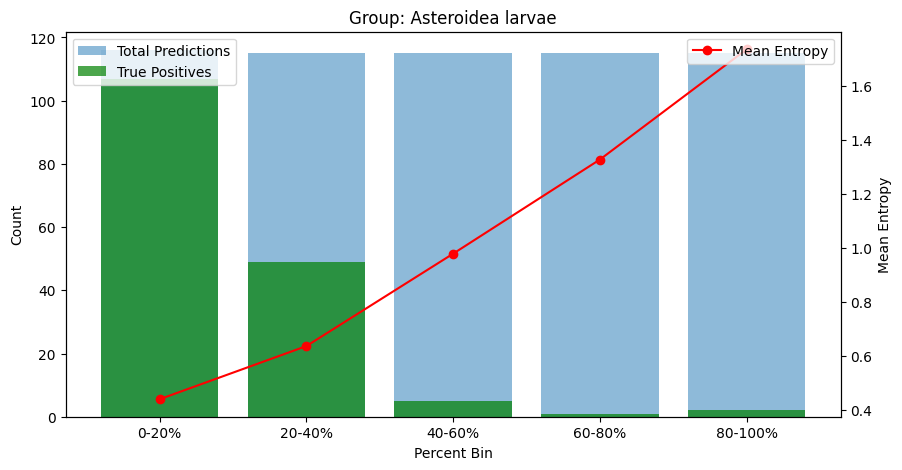

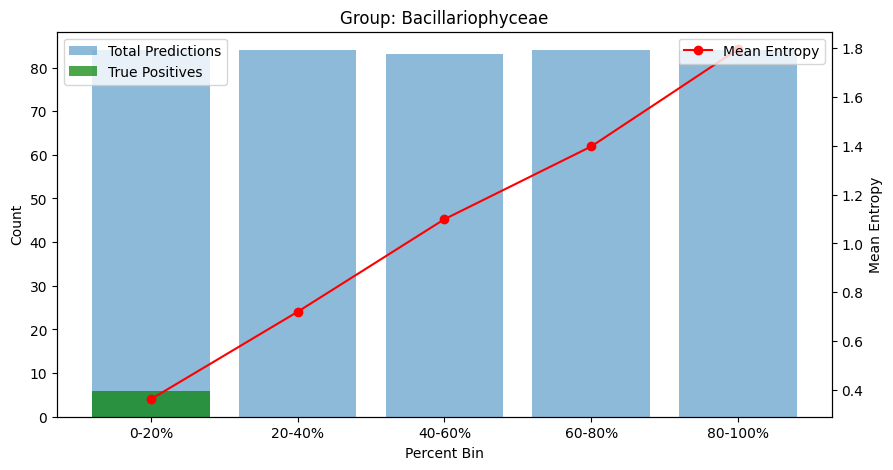

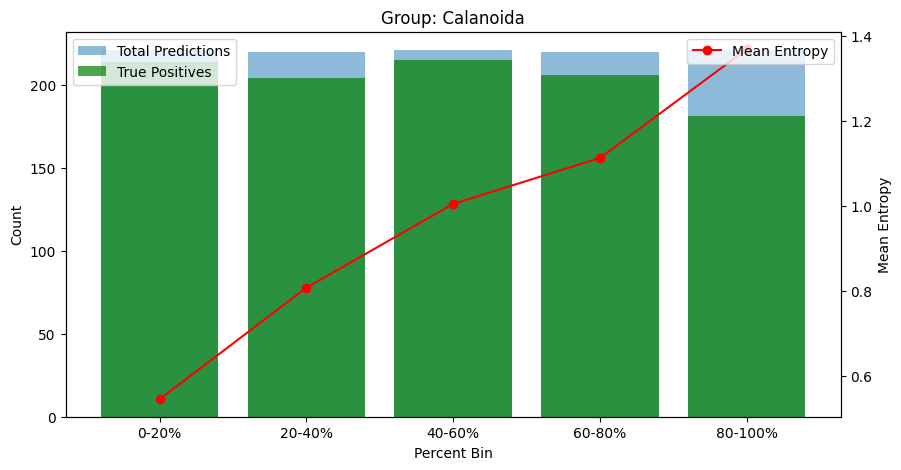

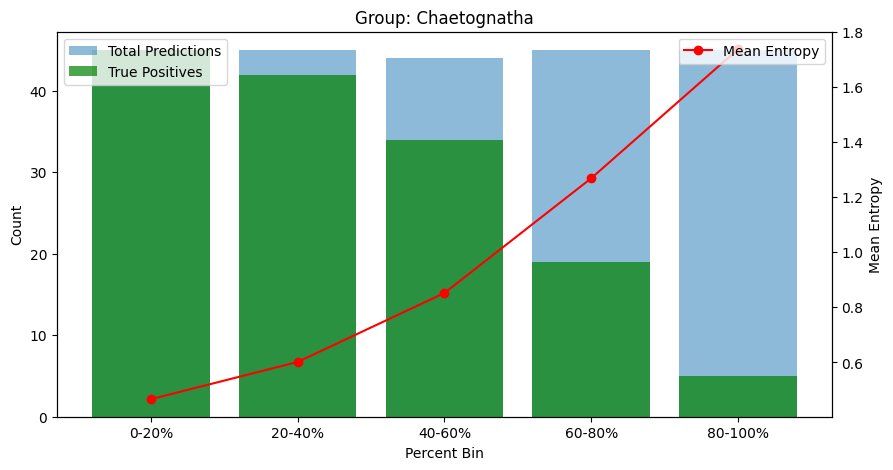

...

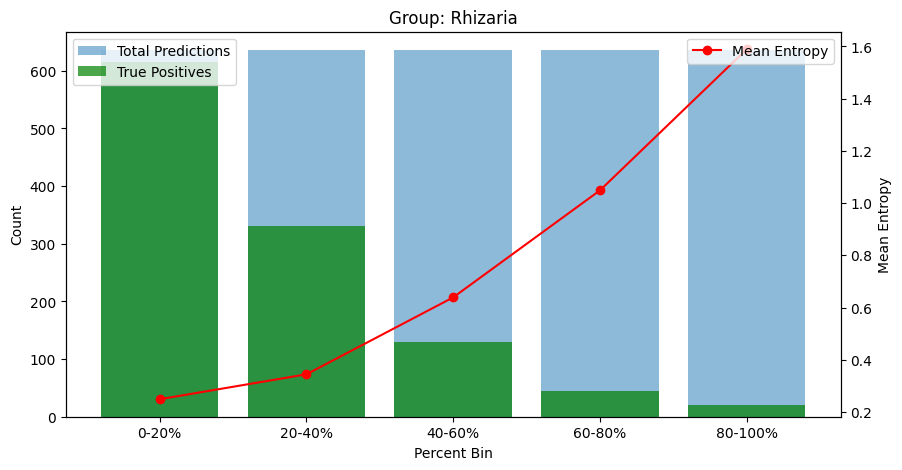

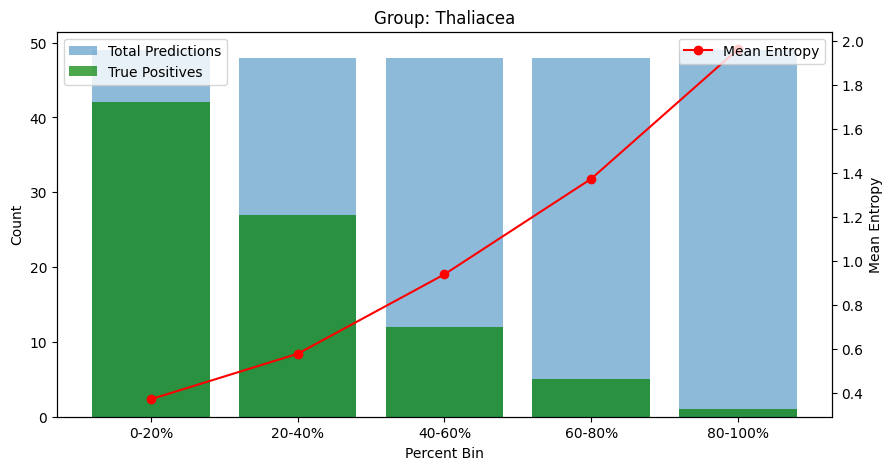

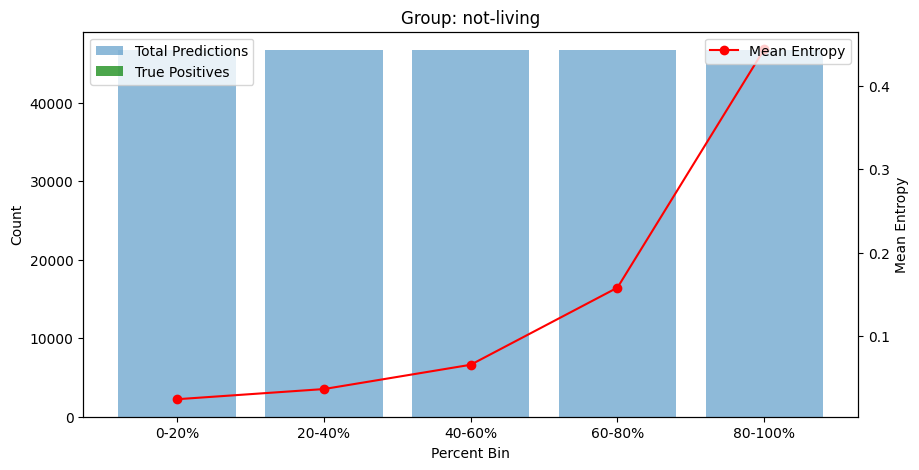

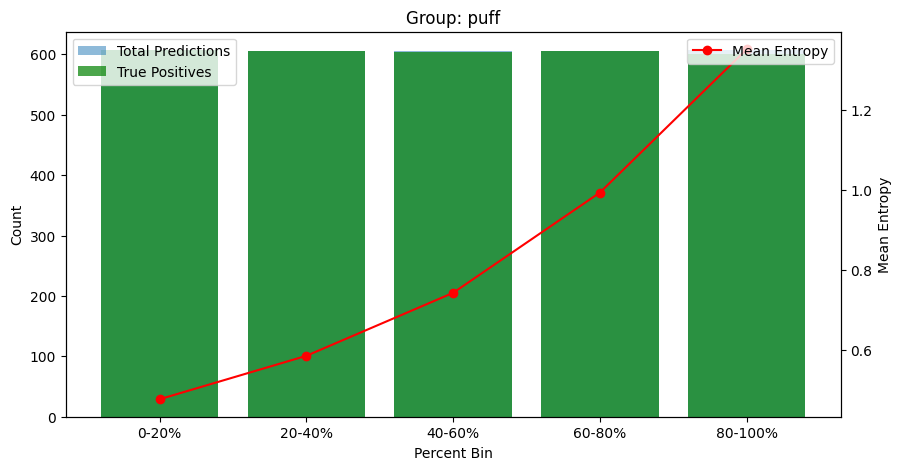

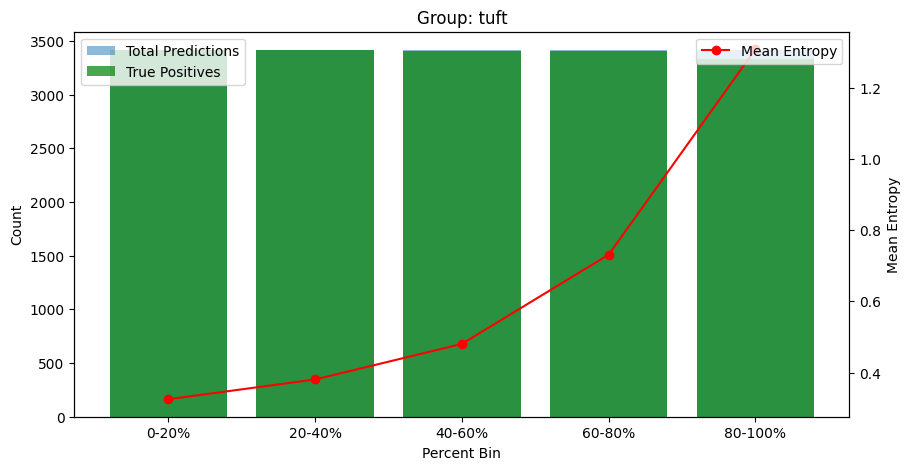

In [8]:
n_bins = 5  # Change to 20 for percentiles, etc.

def bin_group_percent(group_df):
    group_df = group_df.sort_values('object_entropy', ascending=True).reset_index(drop=True)
    group_df['percent_bin'] = pd.qcut(group_df.index, q=n_bins, labels=[f'{int(100*i/n_bins)}-{int(100*(i+1)/n_bins)}%' for i in range(n_bins)])
    return group_df

df_binned_percent = df.groupby('object_annotation_category', group_keys=False).apply(bin_group_percent)

bin_stats_percent = df_binned_percent.groupby(['object_annotation_category', 'percent_bin']).agg(
    total_predictions=('object_id', 'count'),
    true_positives=('object_annotation_status', lambda x: (x == 'validated').sum()),
    mean_entropy=('object_entropy', 'mean')
).reset_index()

for group in bin_stats_percent['object_annotation_category'].unique():
    group_data = bin_stats_percent[bin_stats_percent['object_annotation_category'] == group]
    fig, ax1 = plt.subplots(figsize=(10,5))
    ax1.bar(group_data['percent_bin'], group_data['total_predictions'], alpha=0.5, label='Total Predictions')
    ax1.bar(group_data['percent_bin'], group_data['true_positives'], alpha=0.7, label='True Positives', color='green')
    ax1.set_xlabel('Percent Bin')
    ax1.set_ylabel('Count')
    ax1.legend(loc='upper left')
    ax2 = ax1.twinx()
    ax2.plot(group_data['percent_bin'], group_data['mean_entropy'], color='red', marker='o', label='Mean Entropy')
    ax2.set_ylabel('Mean Entropy')
    ax2.legend(loc='upper right')
    plt.title(f'Group: {group}')
    plt.show()

/tmp/ipykernel_833581/124938376.py:6: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_binned = df.groupby('object_annotation_category', group_keys=False).apply(bin_group)


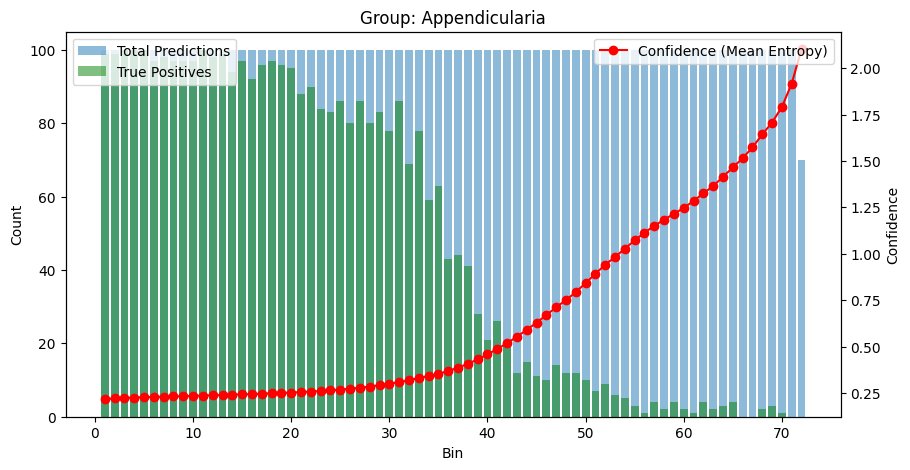

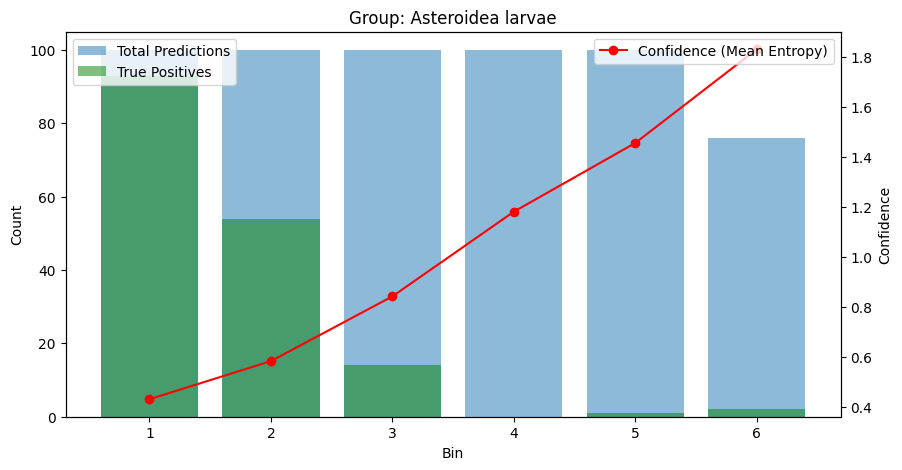

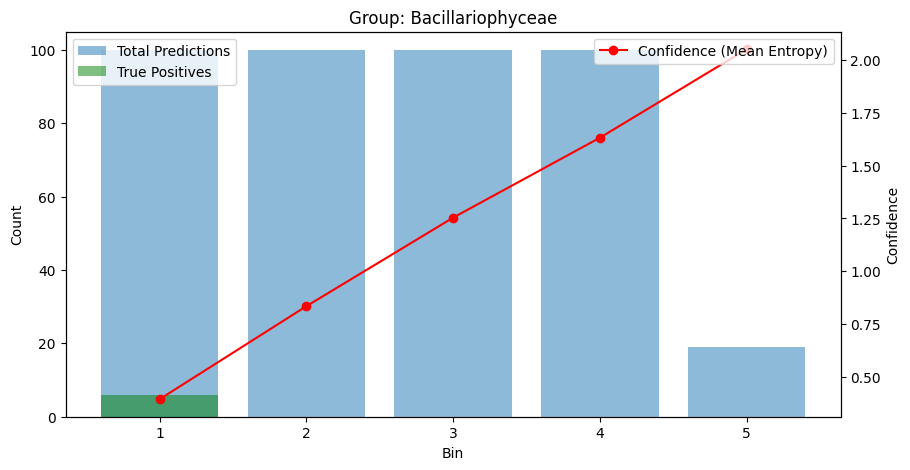

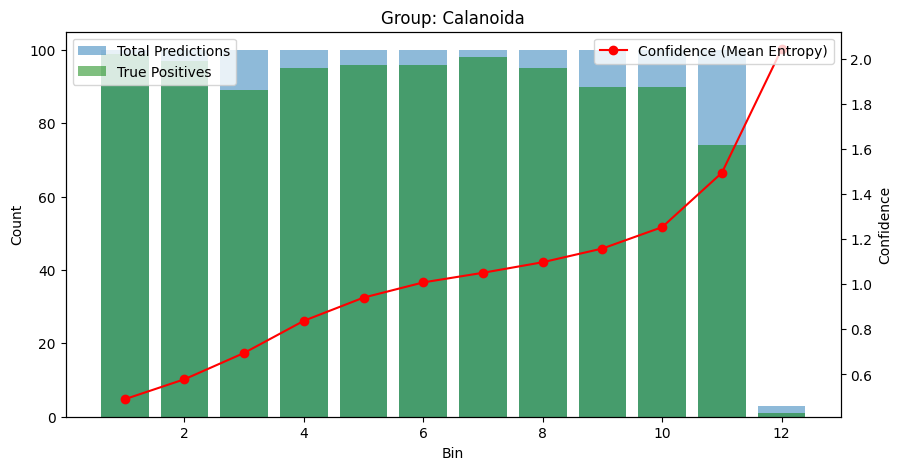

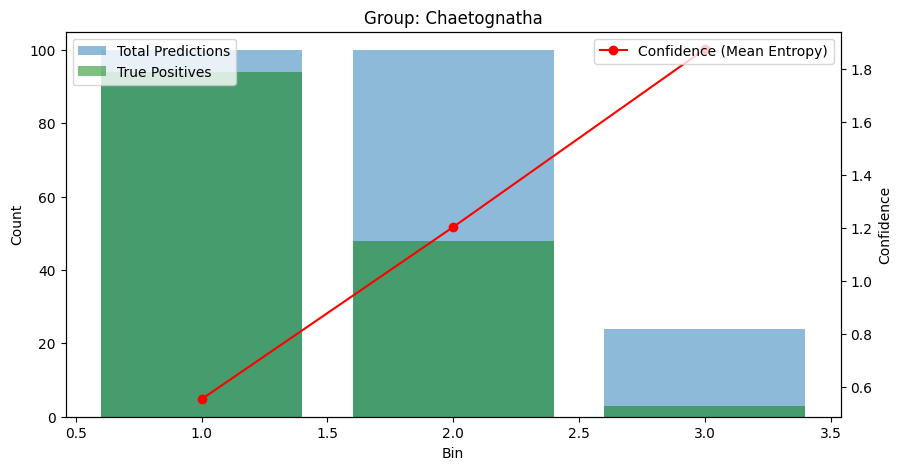

...

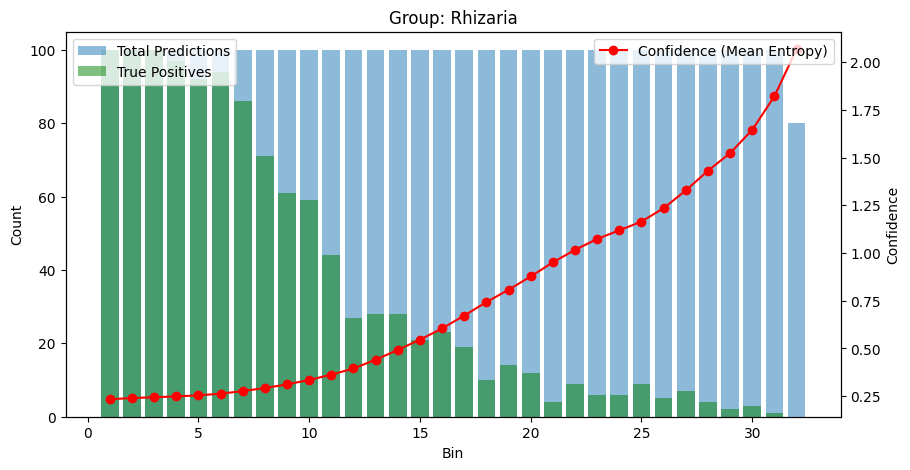

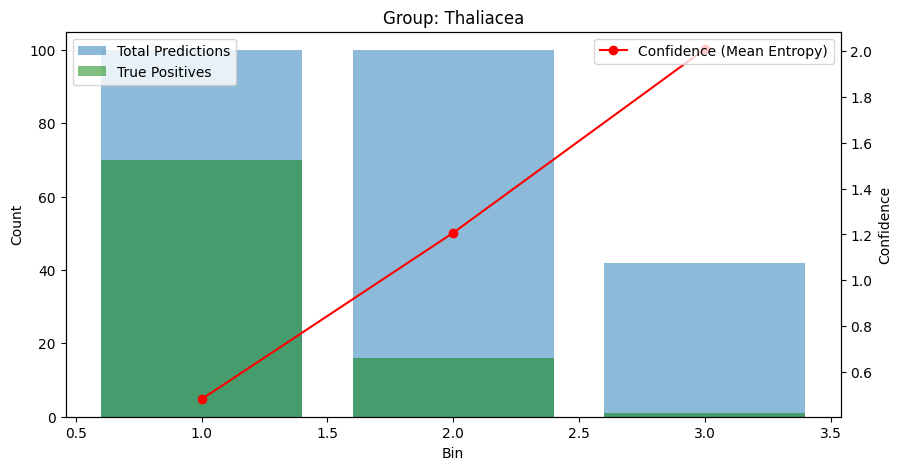

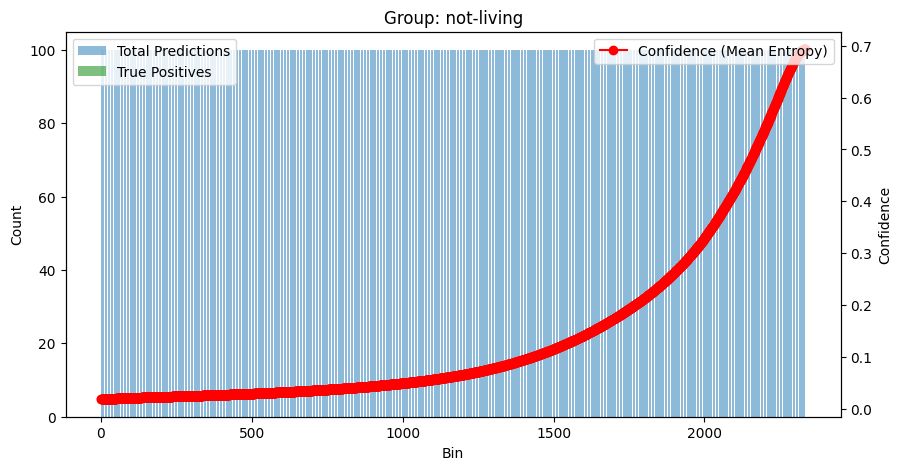

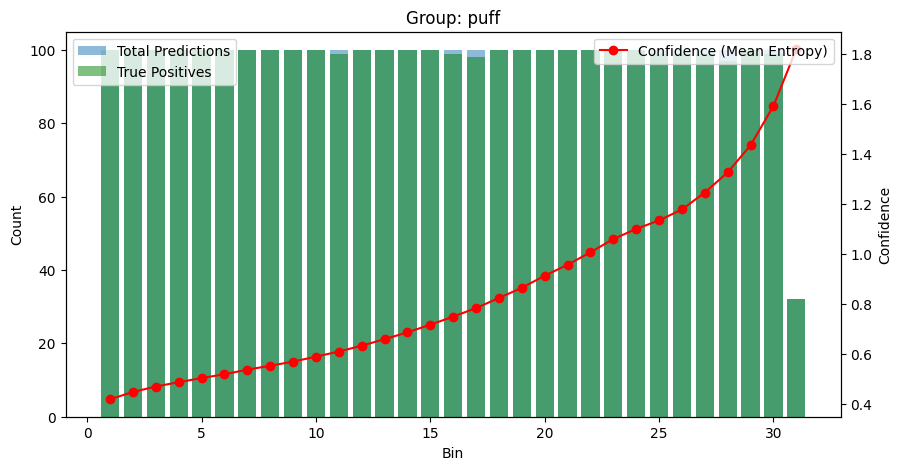

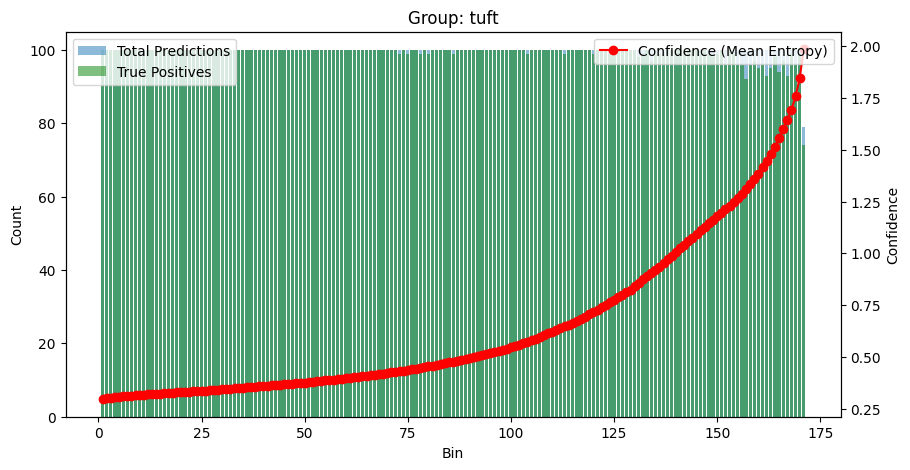

In [9]:
def bin_group(group_df):
    group_df = group_df.sort_values('object_entropy', ascending=True).reset_index(drop=True)
    group_df['bin'] = (group_df.index // 100) + 1
    return group_df

df_binned = df.groupby('object_annotation_category', group_keys=False).apply(bin_group)

# Calculate stats per bin
bin_stats = df_binned.groupby(['object_annotation_category', 'bin']).agg(
    total_predictions=('object_id', 'count'),
    true_positives=('object_annotation_status', lambda x: (x == 'validated').sum()),
    mean_entropy=('object_entropy', 'mean')
).reset_index()

# Plot for each group
for group in bin_stats['object_annotation_category'].unique():
    group_data = bin_stats[bin_stats['object_annotation_category'] == group]
    fig, ax1 = plt.subplots(figsize=(10,5))
    ax1.bar(group_data['bin'], group_data['total_predictions'], alpha=0.5, label='Total Predictions')
    ax1.bar(group_data['bin'], group_data['true_positives'], alpha=0.5, label='True Positives', color='green')
    ax1.set_xlabel('Bin')
    ax1.set_ylabel('Count')
    ax1.legend(loc='upper left')
    ax2 = ax1.twinx()
    ax2.plot(group_data['bin'], group_data['mean_entropy'], color='red', marker='o', label='Confidence (Mean Entropy)')
    ax2.set_ylabel('Confidence')
    ax2.legend(loc='upper right')
    plt.title(f'Group: {group}')
    plt.show()



/tmp/ipykernel_833581/794701976.py:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_binned_conf = df.groupby('object_annotation_category', group_keys=False).apply(bin_group_confidence)
/tmp/ipykernel_833581/794701976.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats_conf = df_binned_conf.groupby(['object_annotation_category', 'confidence_bin']).agg(


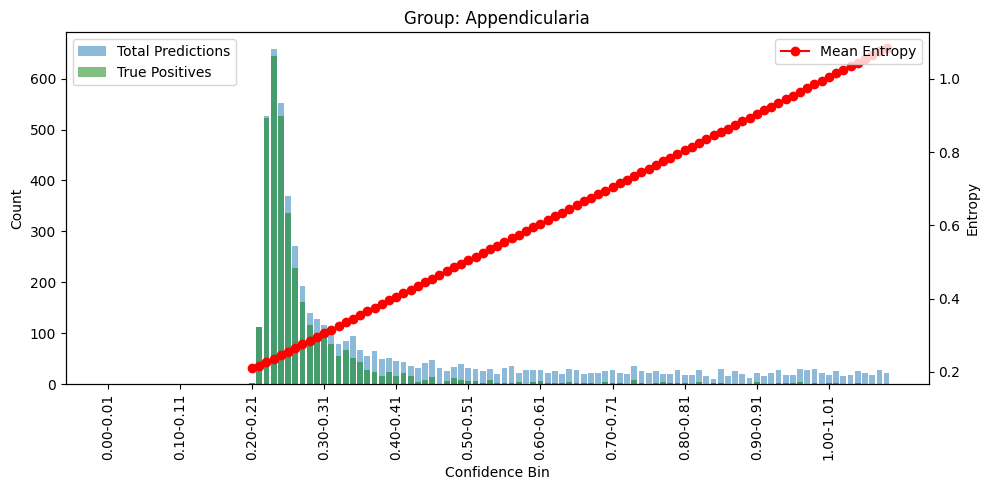

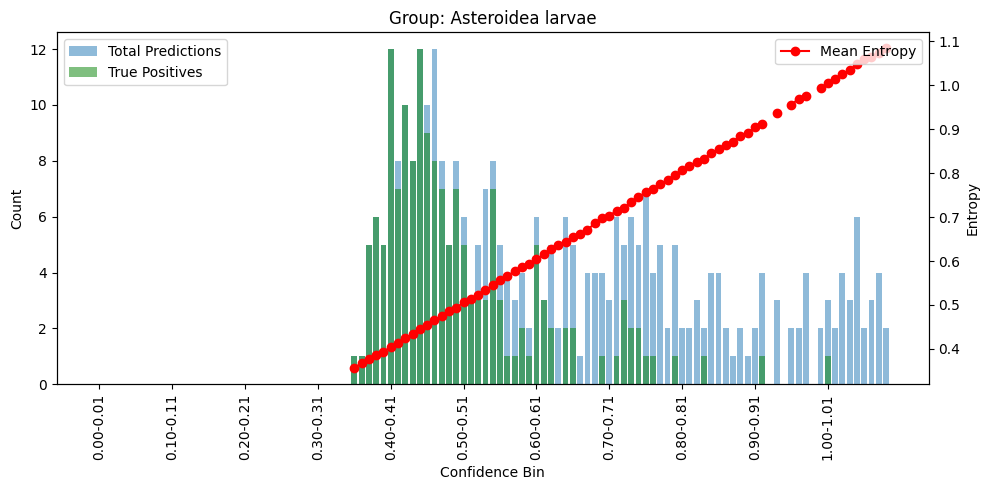

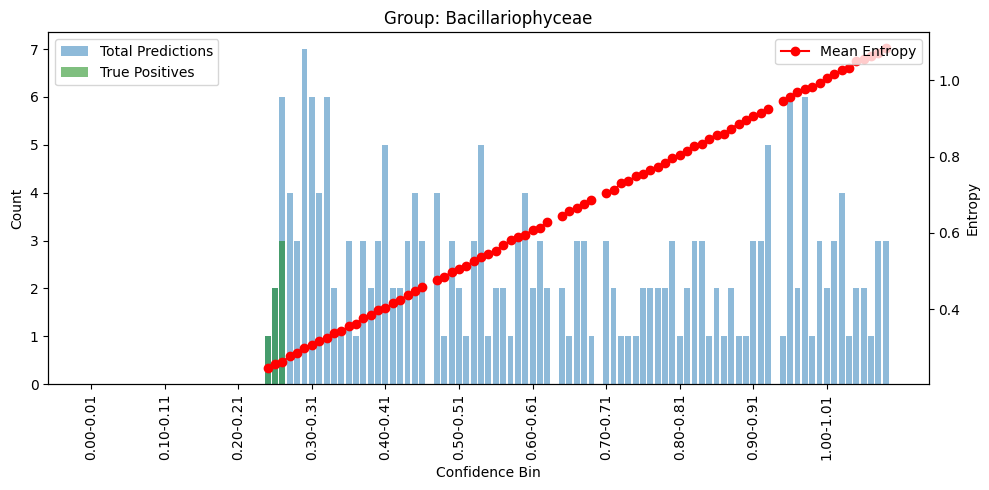

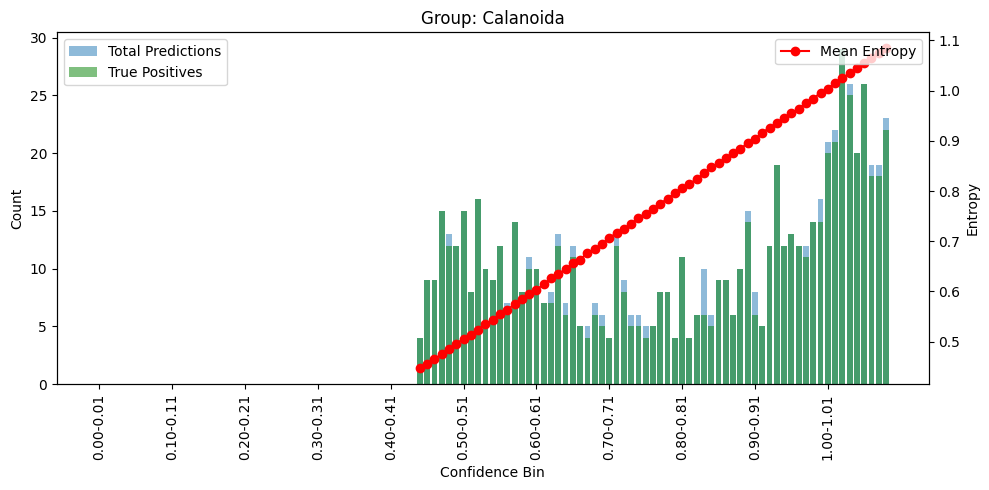

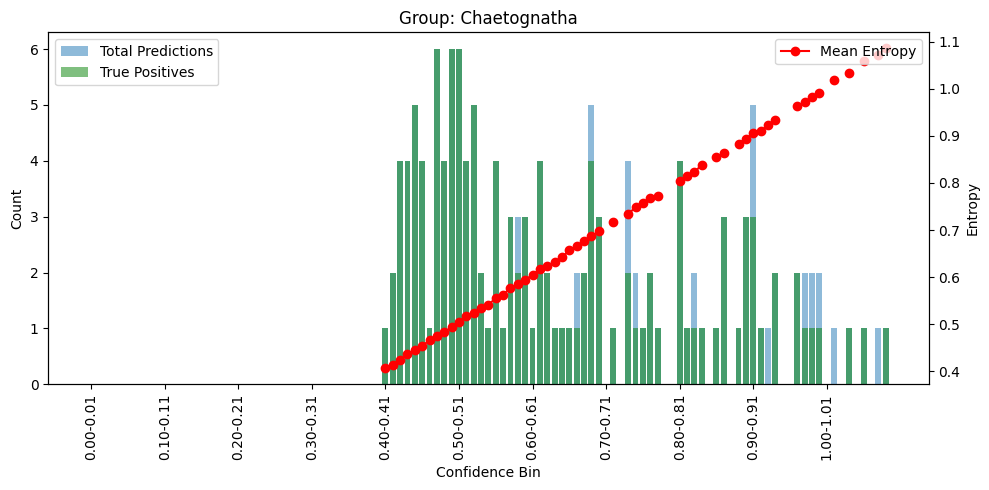

...

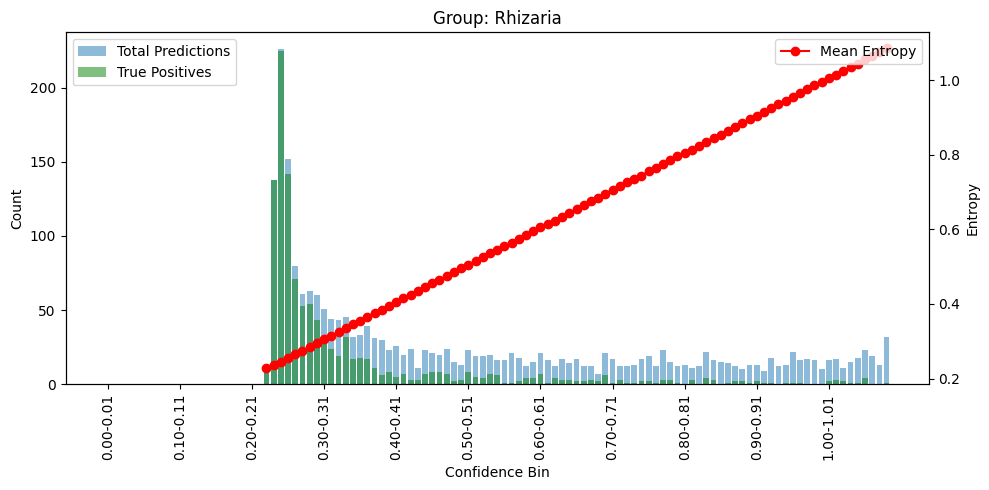

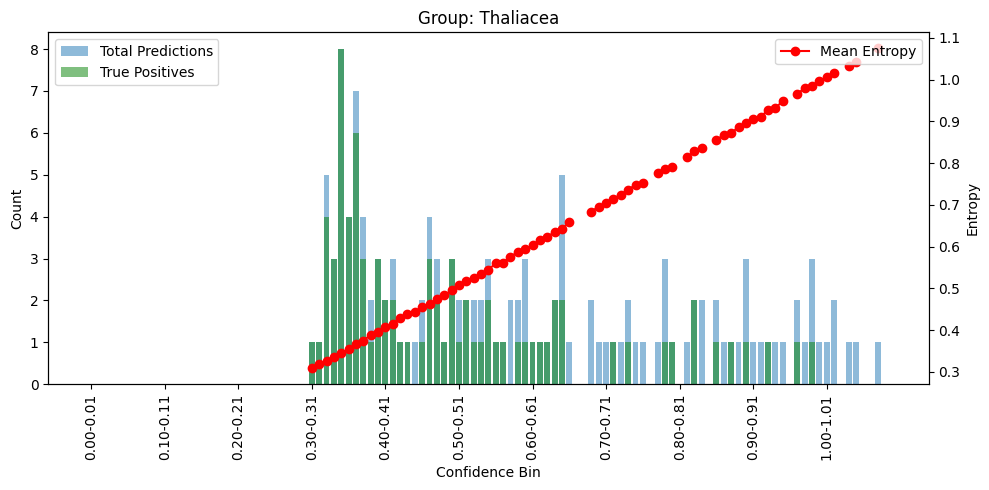

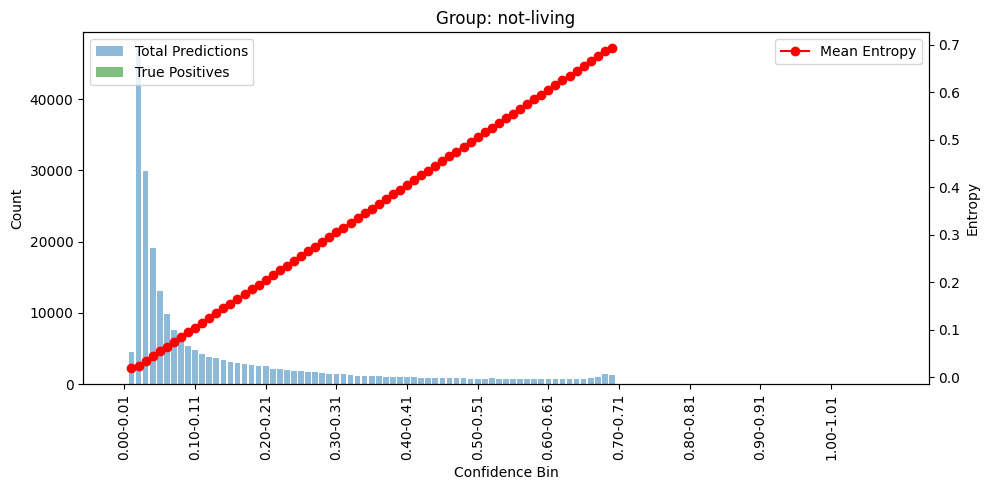

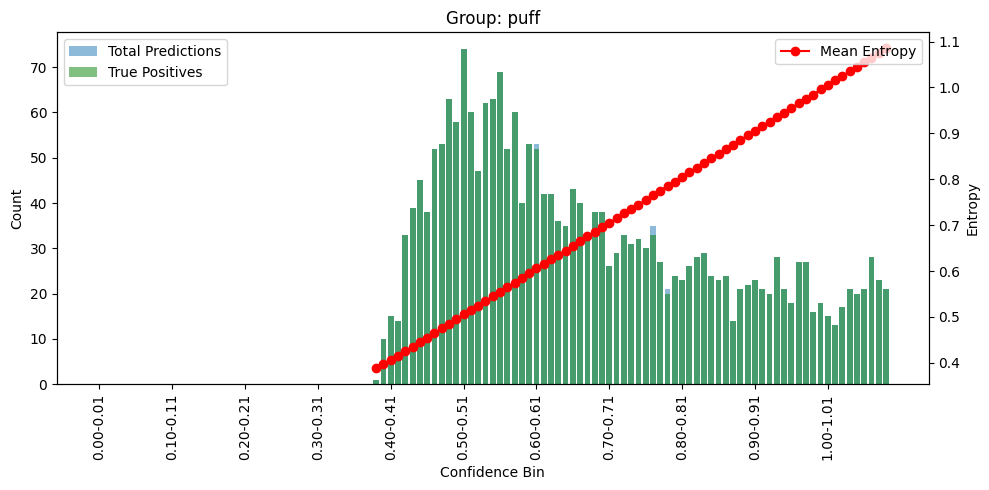

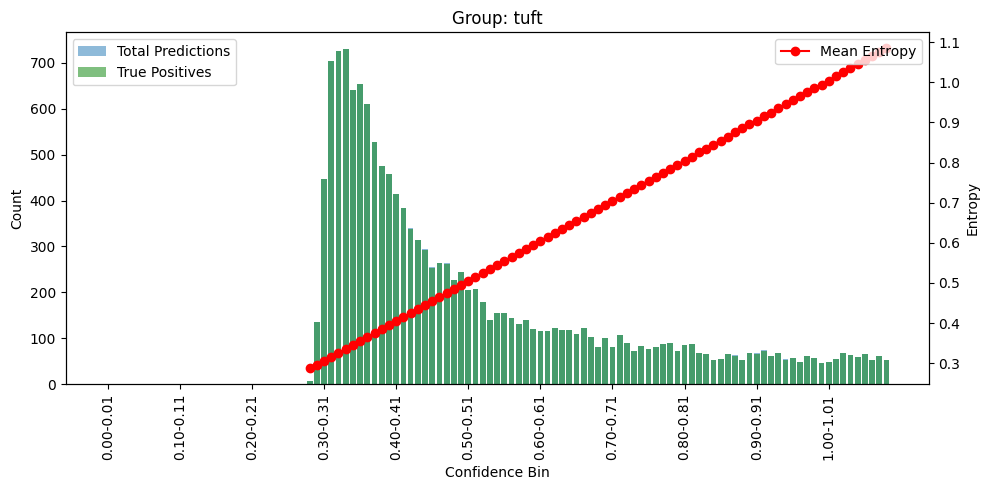

In [10]:
def bin_group_confidence(group_df):
    # Bin by confidence (object_entropy) in steps of 0.1
    bins = np.arange(0, 1.1, 0.01)
    labels = [f"{bins[i]:.2f}-{bins[i+1]:.2f}" for i in range(len(bins)-1)]
    #labels = [f"{round(bins[i],1)}-{round(bins[i+1],1)}" for i in range(len(bins)-1)]
    group_df['confidence_bin'] = pd.cut(group_df['object_entropy'], bins=bins, labels=labels, include_lowest=True)
    return group_df

df_binned_conf = df.groupby('object_annotation_category', group_keys=False).apply(bin_group_confidence)

# Calculate stats per confidence bin
bin_stats_conf = df_binned_conf.groupby(['object_annotation_category', 'confidence_bin']).agg(
    total_predictions=('object_id', 'count'),
    true_positives=('object_annotation_status', lambda x: (x == 'validated').sum()),
    mean_entropy=('object_entropy', 'mean')
).reset_index()

# Plot for each group
for group in bin_stats_conf['object_annotation_category'].unique():
    group_data = bin_stats_conf[bin_stats_conf['object_annotation_category'] == group]
    fig, ax1 = plt.subplots(figsize=(10,5))
    ax1.bar(group_data['confidence_bin'], group_data['total_predictions'], alpha=0.5, label='Total Predictions')
    ax1.bar(group_data['confidence_bin'], group_data['true_positives'], alpha=0.5, label='True Positives', color='green')
    ax1.set_xlabel('Confidence Bin')
    ax1.set_ylabel('Count')
    ax1.legend(loc='upper left')
    ax2 = ax1.twinx()
    ax2.plot(group_data['confidence_bin'], group_data['mean_entropy'], color='red', marker='o', label='Mean Entropy')
    ax2.set_ylabel('Entropy')
    ax2.legend(loc='upper right')
    plt.title(f'Group: {group}')

        # Show every 10th bin label
    step = 10
    ticks = np.arange(0, len(group_data['confidence_bin']), step)
    ax1.set_xticks(ticks)
    ax1.set_xticklabels(group_data['confidence_bin'].iloc[ticks], rotation=90)

    plt.tight_layout()
    plt.show()

/tmp/ipykernel_833581/3791783033.py:6: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_binned = df.groupby('object_annotation_category', group_keys=False).apply(bin_group)


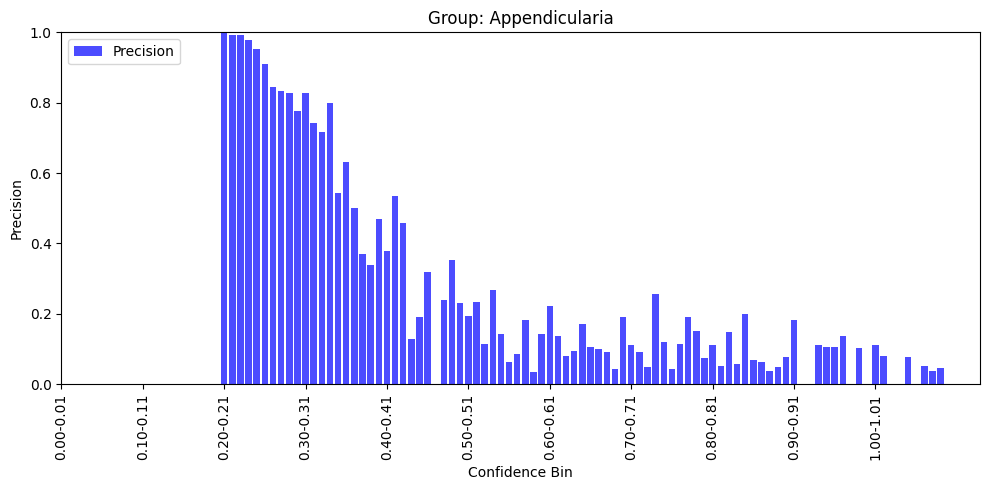

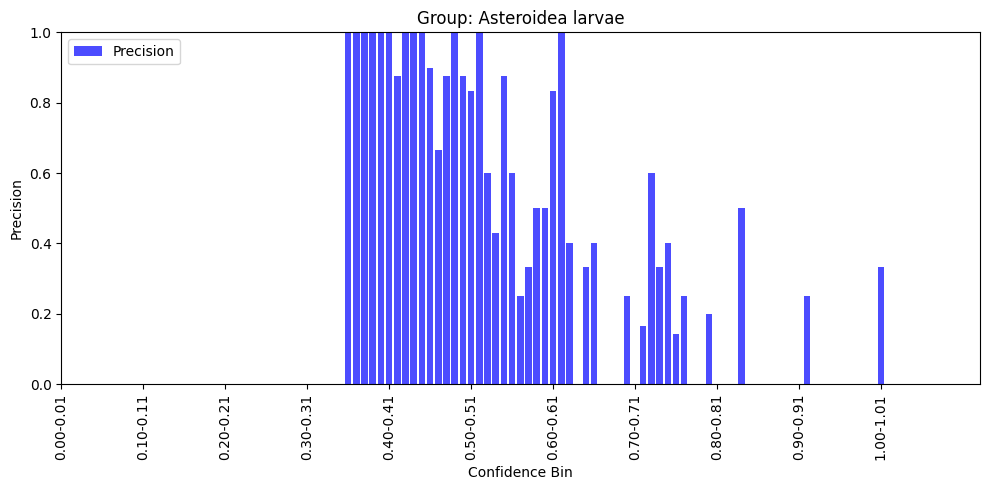

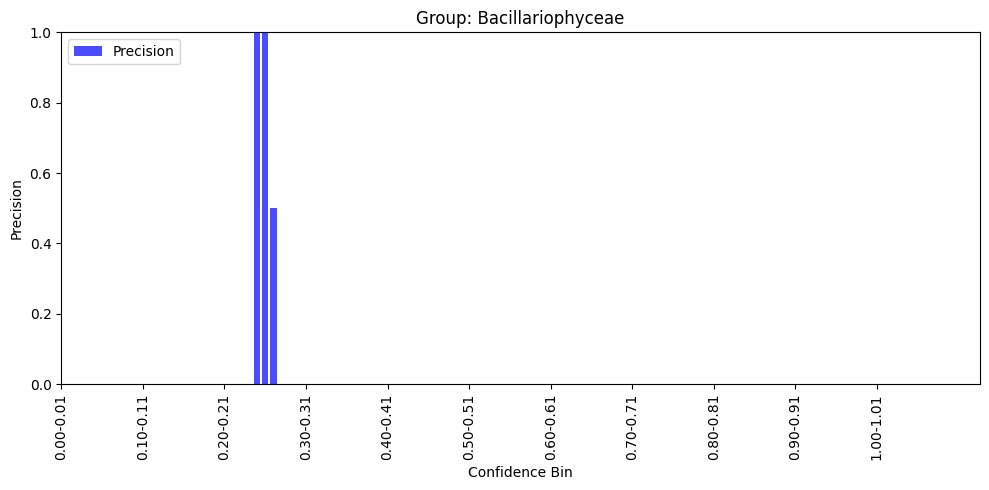

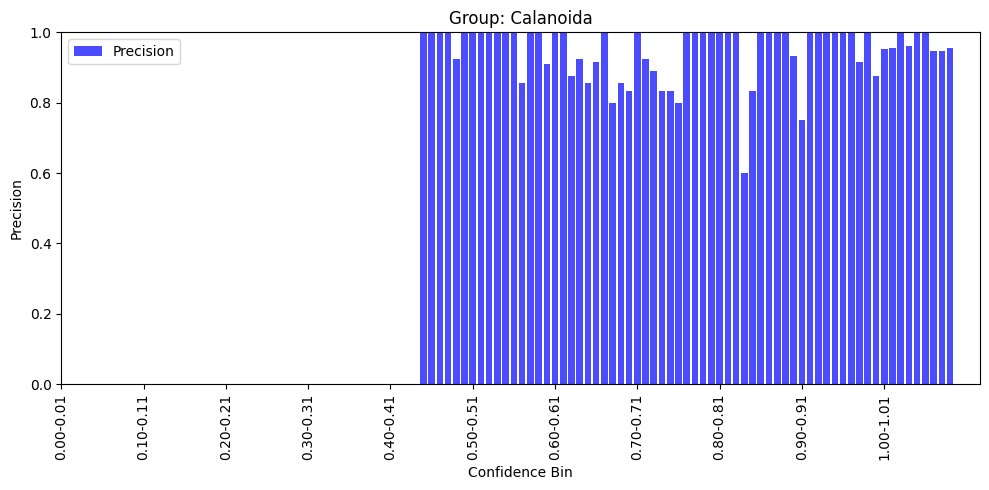

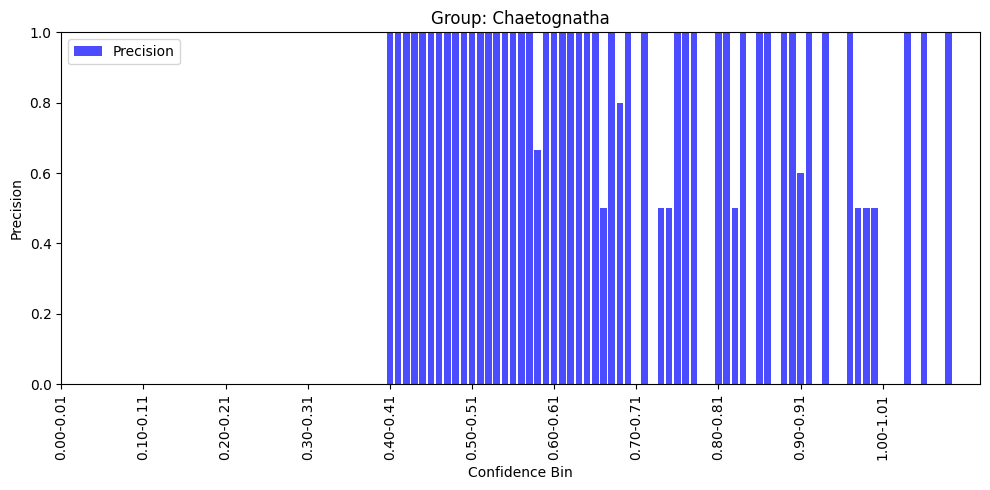

...

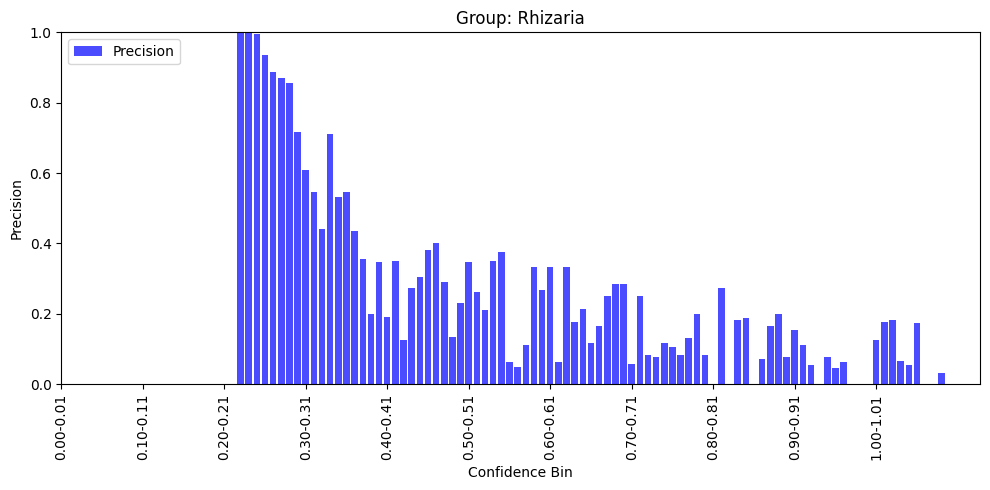

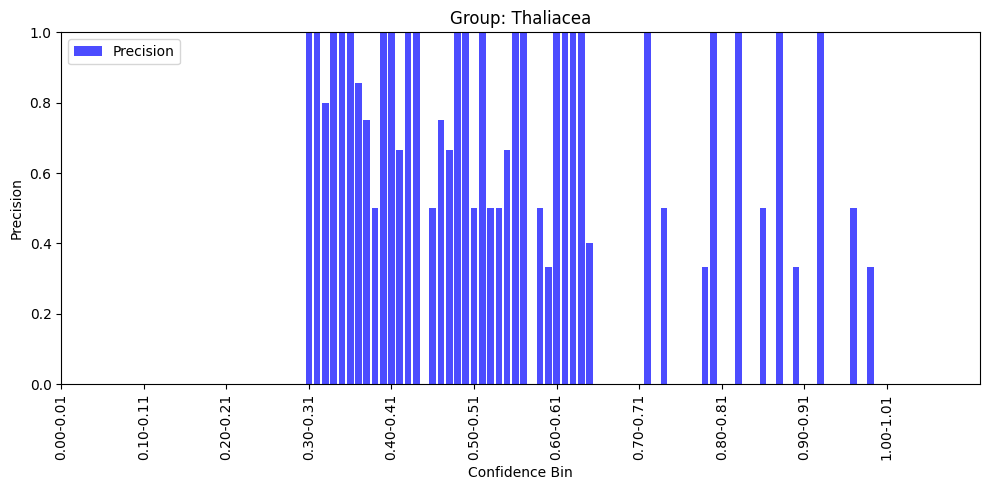

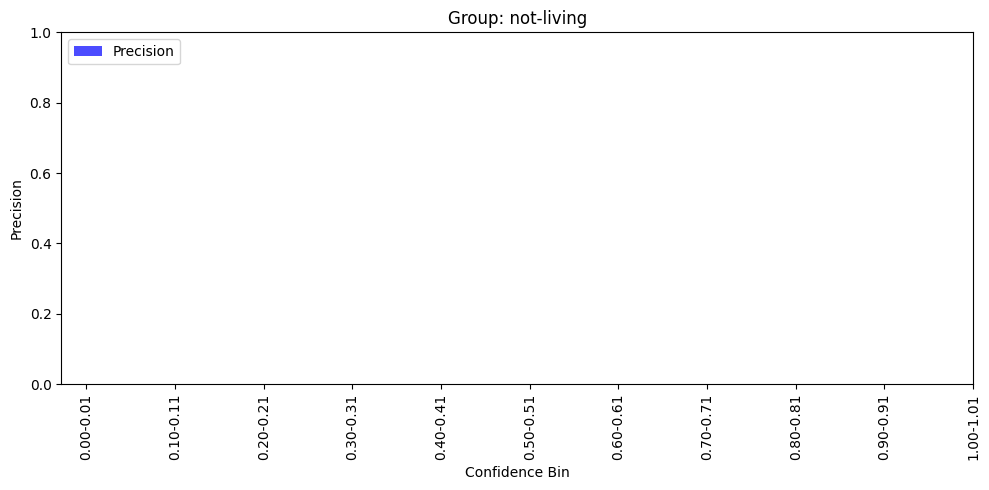

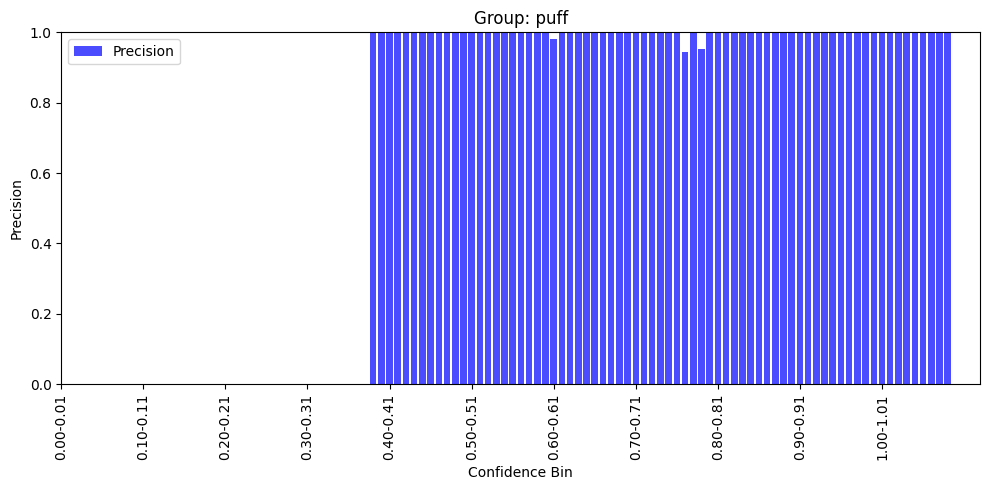

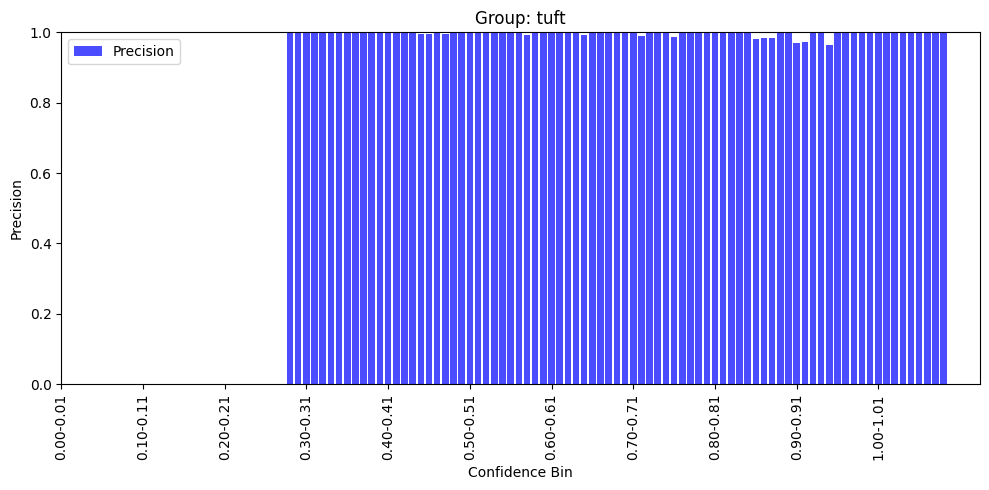

In [11]:
def bin_group(group_df):
    group_df = group_df.sort_values('object_entropy', ascending=True).reset_index(drop=True)
    group_df['bin'] = (group_df.index // 100) + 1
    return group_df

df_binned = df.groupby('object_annotation_category', group_keys=False).apply(bin_group)


for group in bin_stats_conf['object_annotation_category'].unique():
    group_data = bin_stats_conf[bin_stats_conf['object_annotation_category'] == group].copy()
    # Calculate precision for each bin
    group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']
    fig, ax1 = plt.subplots(figsize=(10,5))
    ax1.bar(group_data['confidence_bin'], group_data['precision'], alpha=0.7, label='Precision', color='blue')
    ax1.set_xlabel('Confidence Bin')
    ax1.set_ylabel('Precision')
    ax1.set_ylim(0, 1)
    ax1.legend(loc='upper left')
    #ax2 = ax1.twinx()
    #ax2.plot(group_data['confidence_bin'], group_data['mean_entropy'], color='red', marker='o', label='Mean Confidence')
    #ax2.set_ylabel('Mean Confidence')
    #ax2.legend(loc='upper right')
    plt.title(f'Group: {group}')

    # Show every 10th bin label
    step = 10
    ticks = np.arange(0, len(group_data['confidence_bin']), step)
    ax1.set_xticks(ticks)
    ax1.set_xticklabels(group_data['confidence_bin'].iloc[ticks], rotation=90)

    plt.tight_layout()
    plt.show()

/tmp/ipykernel_833581/1769743090.py:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_binned_conf = df.groupby('object_annotation_category', group_keys=False).apply(bin_group_confidence)
/tmp/ipykernel_833581/1769743090.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats_conf = df_binned_conf.groupby(['object_annotation_category', 'confidence_bin']).agg(
/tmp/ipykernel_833581/1769743090.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .

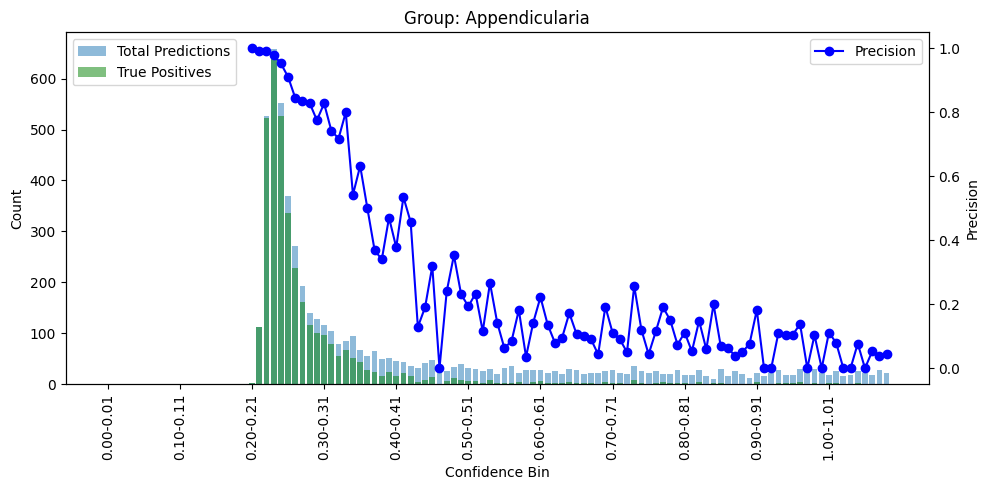

/tmp/ipykernel_833581/1769743090.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']


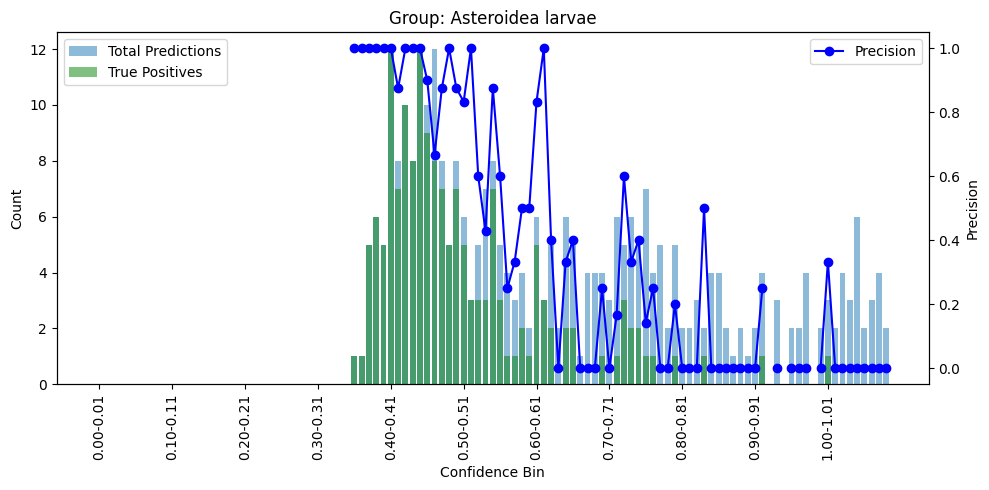

/tmp/ipykernel_833581/1769743090.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']


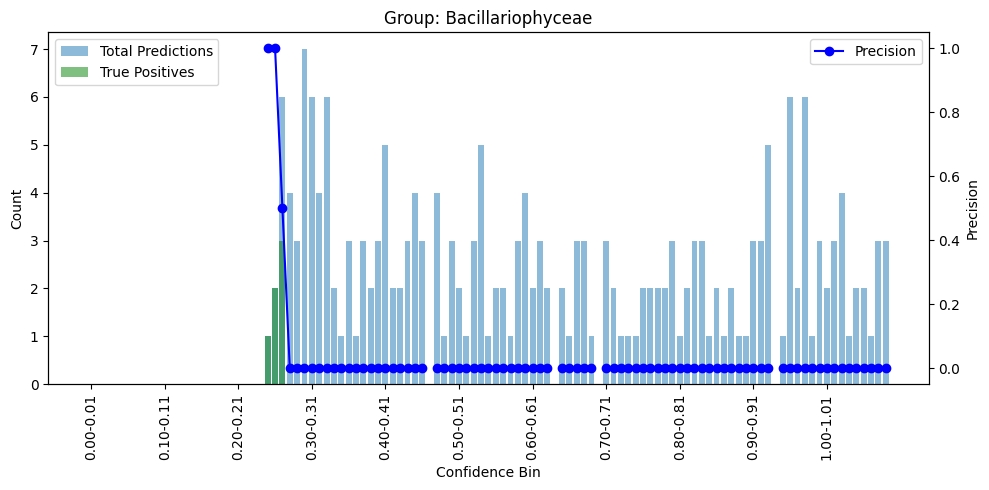

/tmp/ipykernel_833581/1769743090.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']


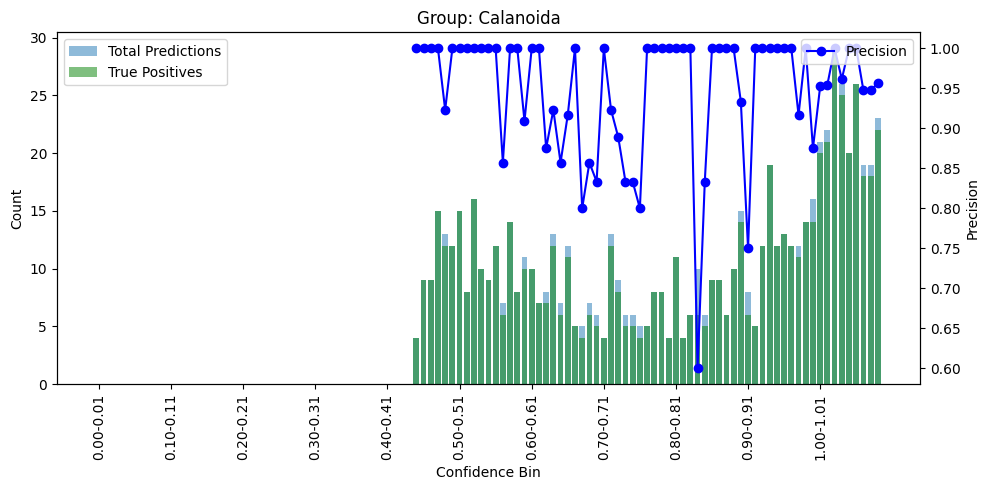

/tmp/ipykernel_833581/1769743090.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']


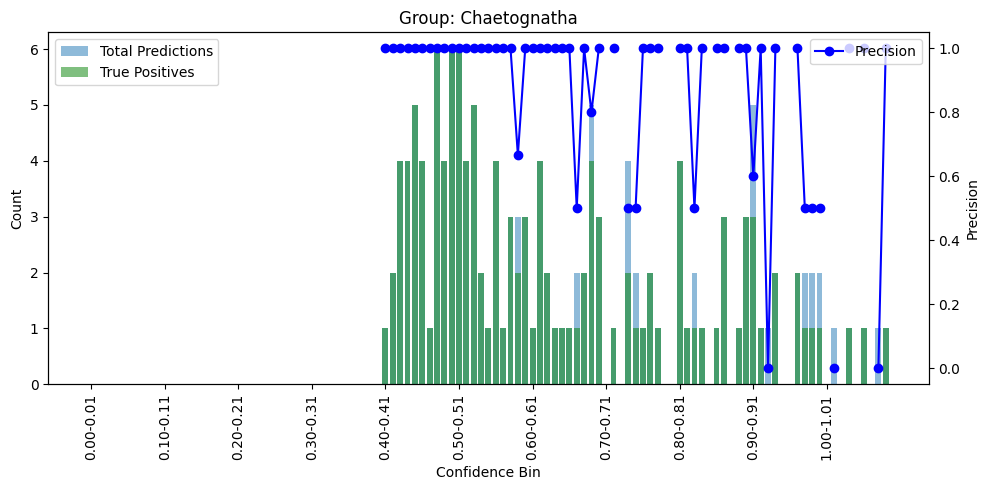

/tmp/ipykernel_833581/1769743090.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']


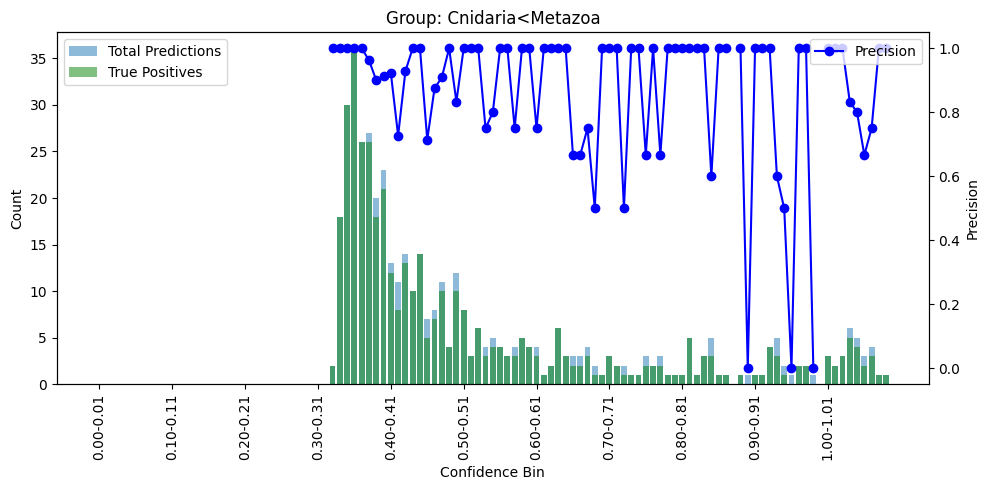

/tmp/ipykernel_833581/1769743090.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']


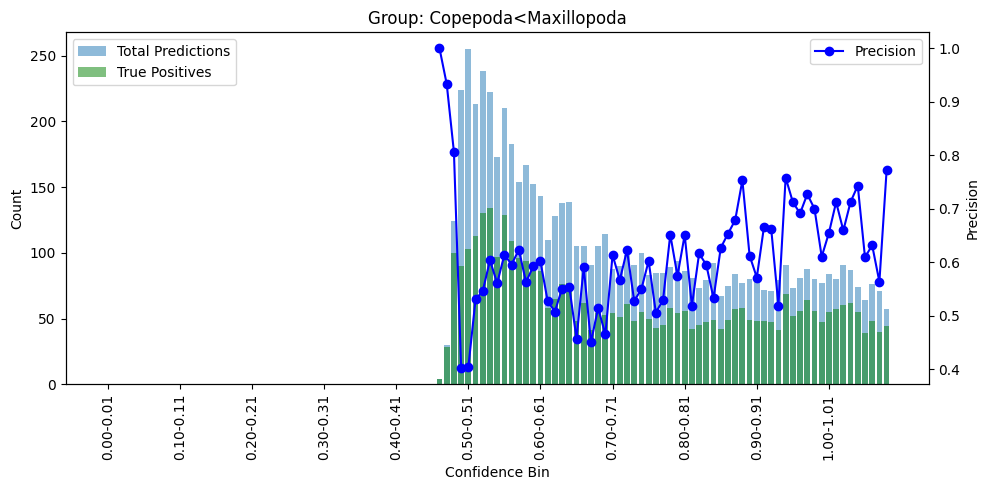

/tmp/ipykernel_833581/1769743090.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']


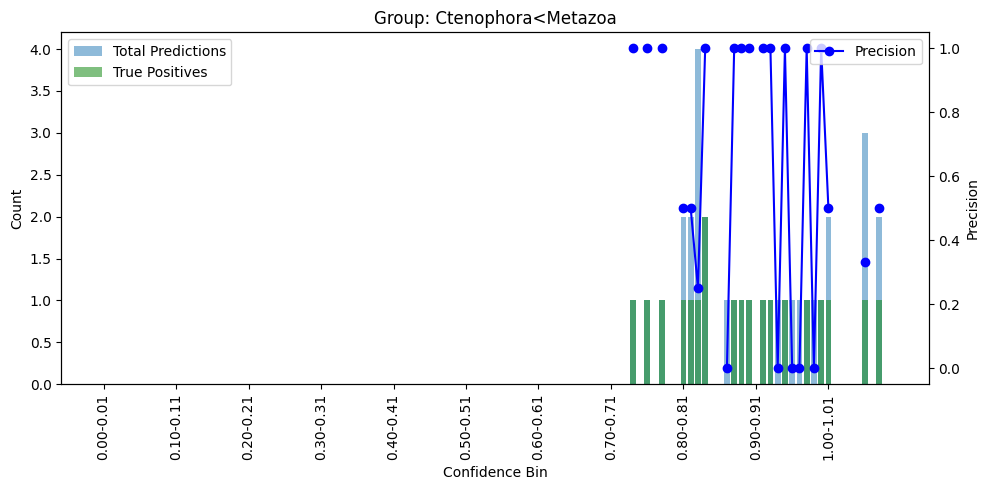

/tmp/ipykernel_833581/1769743090.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']


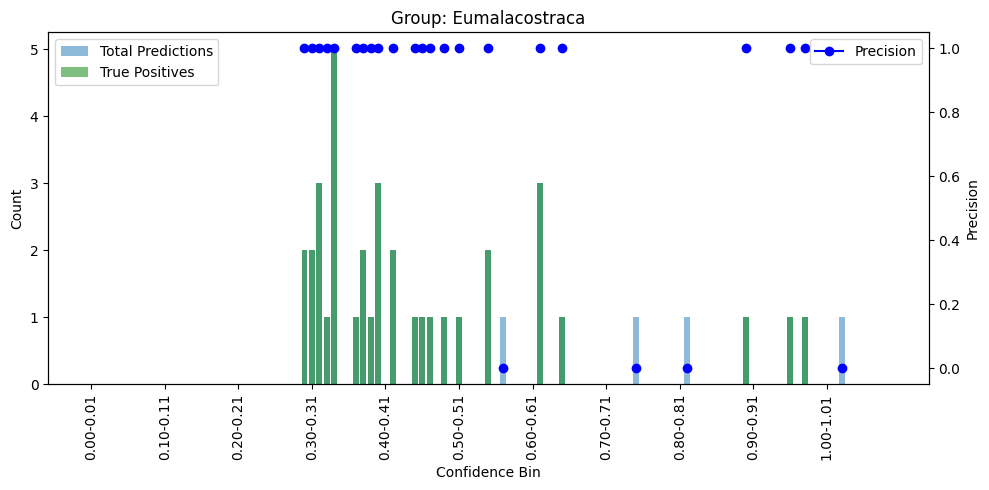

/tmp/ipykernel_833581/1769743090.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']


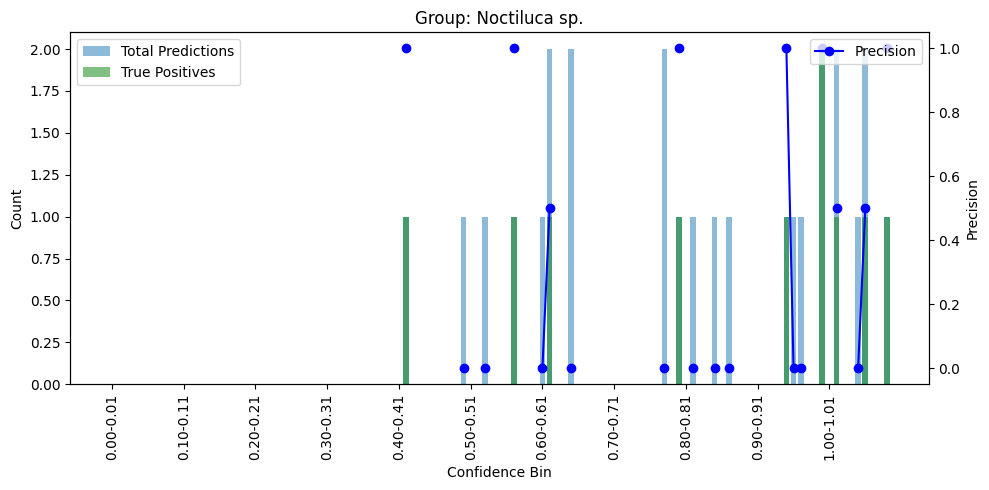

/tmp/ipykernel_833581/1769743090.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']


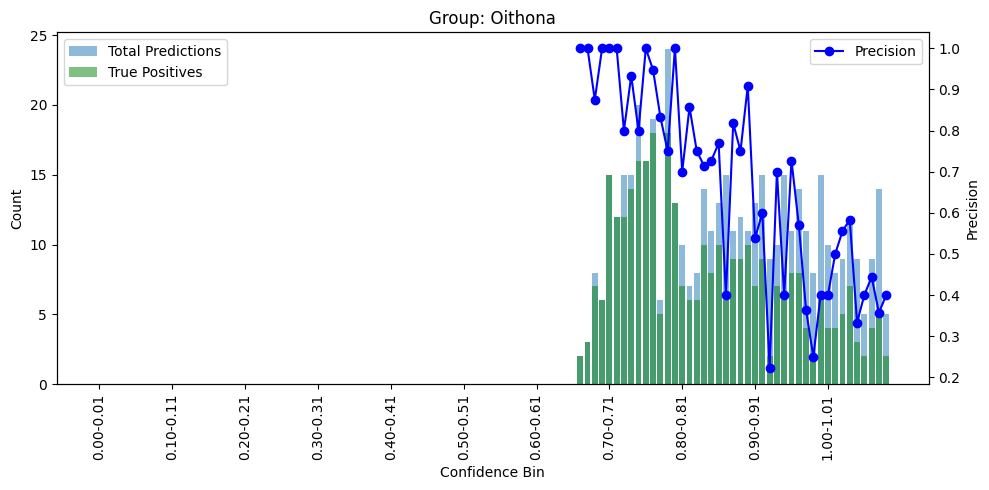

/tmp/ipykernel_833581/1769743090.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']


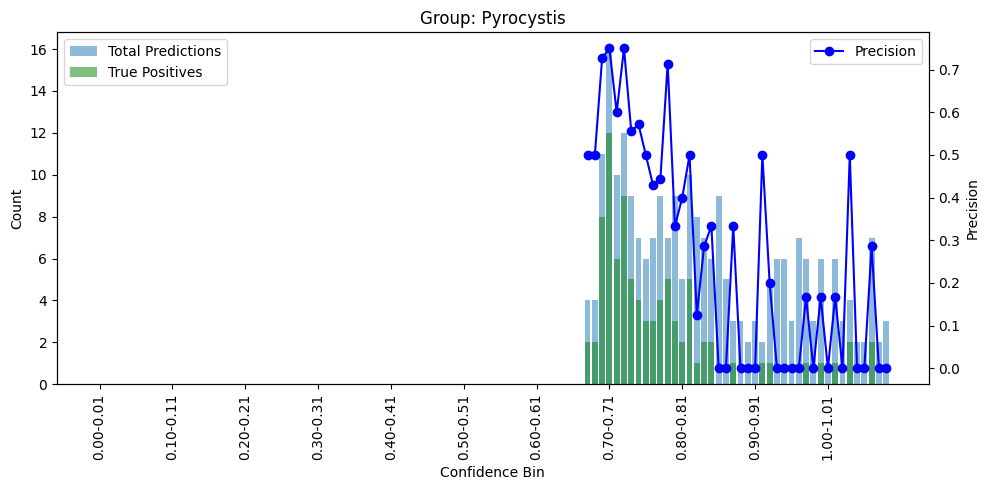

/tmp/ipykernel_833581/1769743090.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']


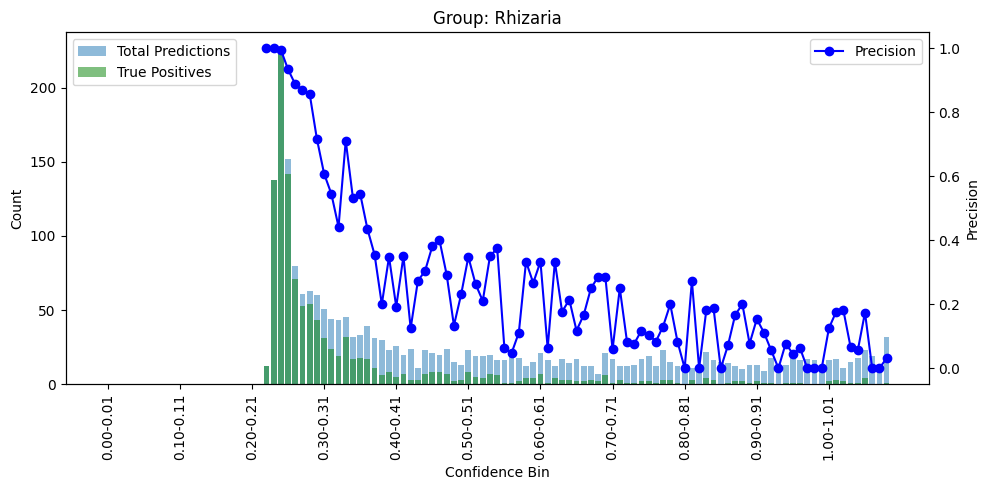

/tmp/ipykernel_833581/1769743090.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']


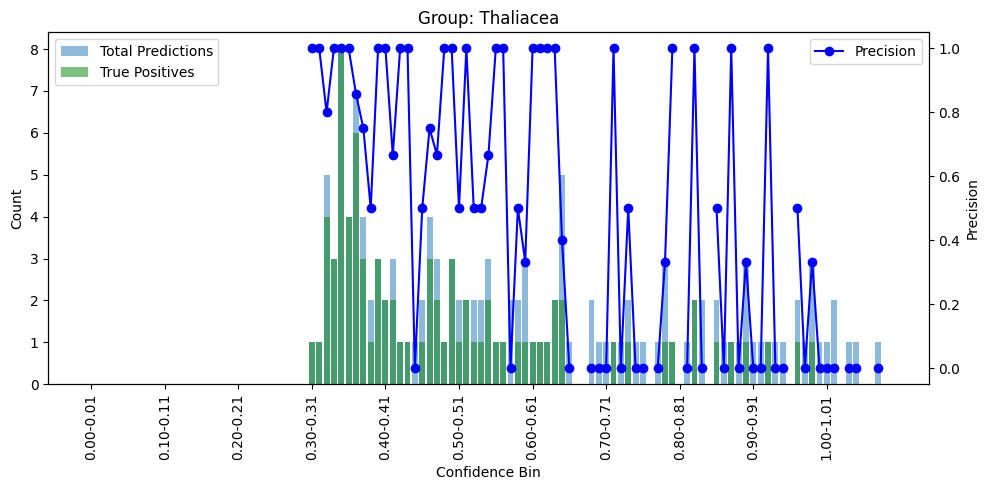

/tmp/ipykernel_833581/1769743090.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']


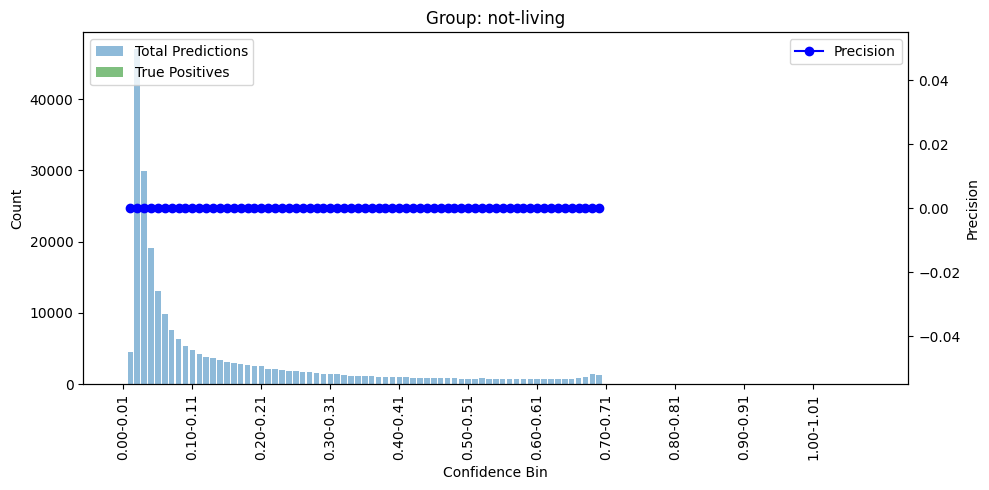

/tmp/ipykernel_833581/1769743090.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']


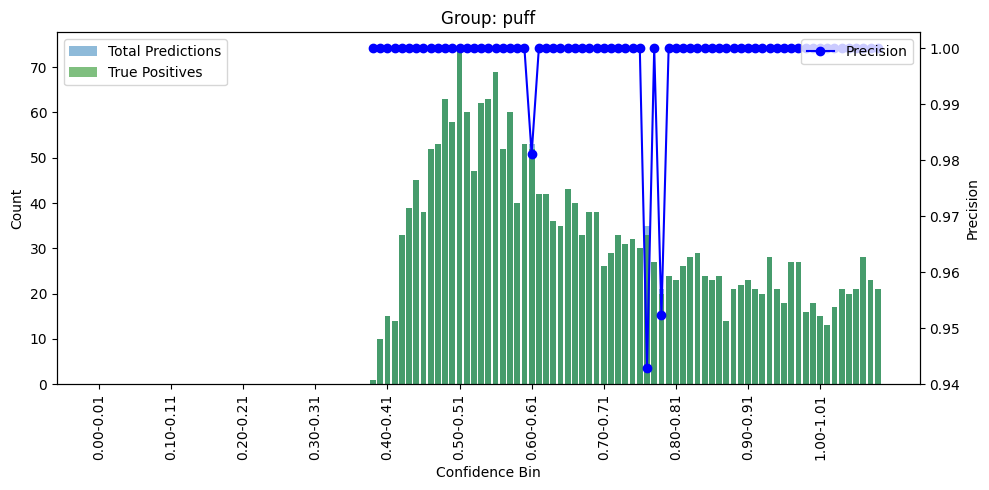

/tmp/ipykernel_833581/1769743090.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']


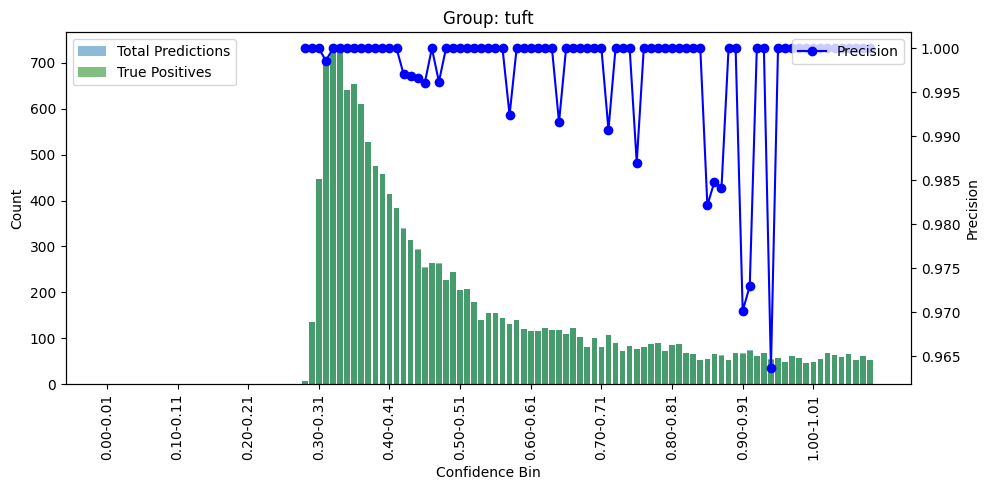

In [12]:
def bin_group_confidence(group_df):
    # Bin by confidence (object_entropy) in steps of 0.1
    bins = np.arange(0, 1.1, 0.01)
    labels = [f"{bins[i]:.2f}-{bins[i+1]:.2f}" for i in range(len(bins)-1)]
    #labels = [f"{round(bins[i],1)}-{round(bins[i+1],1)}" for i in range(len(bins)-1)]
    group_df['confidence_bin'] = pd.cut(group_df['object_entropy'], bins=bins, labels=labels, include_lowest=True)
    return group_df

df_binned_conf = df.groupby('object_annotation_category', group_keys=False).apply(bin_group_confidence)

# Calculate stats per confidence bin
bin_stats_conf = df_binned_conf.groupby(['object_annotation_category', 'confidence_bin']).agg(
    total_predictions=('object_id', 'count'),
    true_positives=('object_annotation_status', lambda x: (x == 'validated').sum()),
    mean_entropy=('object_entropy', 'mean')
).reset_index()

# Plot for each group
for group in bin_stats_conf['object_annotation_category'].unique():
    group_data = bin_stats_conf[bin_stats_conf['object_annotation_category'] == group]
    # Calculate precision for each bin
    group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']
    fig, ax1 = plt.subplots(figsize=(10,5))
    ax1.bar(group_data['confidence_bin'], group_data['total_predictions'], alpha=0.5, label='Total Predictions')
    ax1.bar(group_data['confidence_bin'], group_data['true_positives'], alpha=0.5, label='True Positives', color='green')
    ax1.set_xlabel('Confidence Bin')
    ax1.set_ylabel('Count')
    ax1.legend(loc='upper left')
    ax2 = ax1.twinx()
    ax2.plot(group_data['confidence_bin'], group_data['precision'], color='blue', marker='o', label='Precision')
    ax2.set_ylabel('Precision')
    ax2.legend(loc='upper right')
    plt.title(f'Group: {group}')

        # Show every 10th bin label
    step = 10
    ticks = np.arange(0, len(group_data['confidence_bin']), step)
    ax1.set_xticks(ticks)
    ax1.set_xticklabels(group_data['confidence_bin'].iloc[ticks], rotation=90)

    plt.tight_layout()
    plt.show()

### Weighted Precision (Precision * Number of objects in bin) ###

/tmp/ipykernel_833581/2860897024.py:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_binned_conf = df.groupby('object_annotation_category', group_keys=False).apply(bin_group_confidence)
/tmp/ipykernel_833581/2860897024.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats_conf = df_binned_conf.groupby(['object_annotation_category', 'confidence_bin']).agg(
/tmp/ipykernel_833581/2860897024.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .

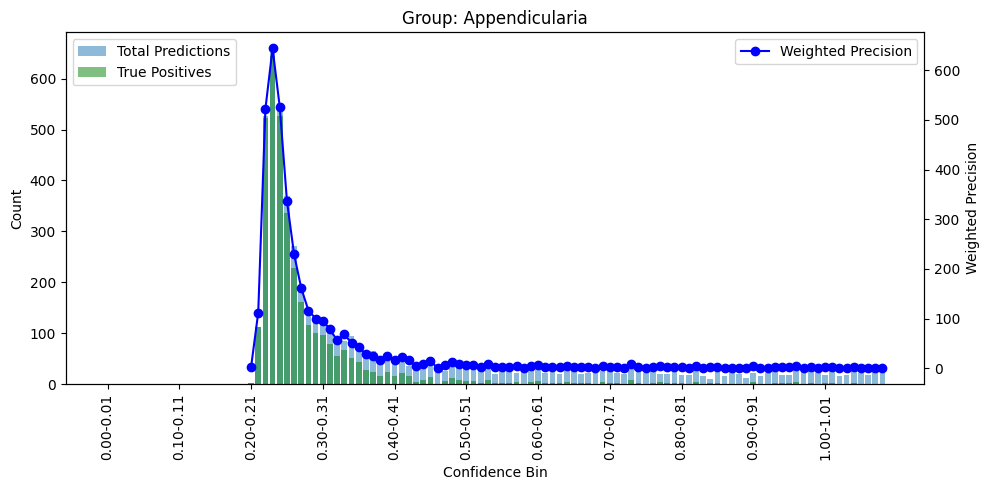

/tmp/ipykernel_833581/2860897024.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']
/tmp/ipykernel_833581/2860897024.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['weighted_precision'] = group_data['precision'] * group_data['total_predictions']


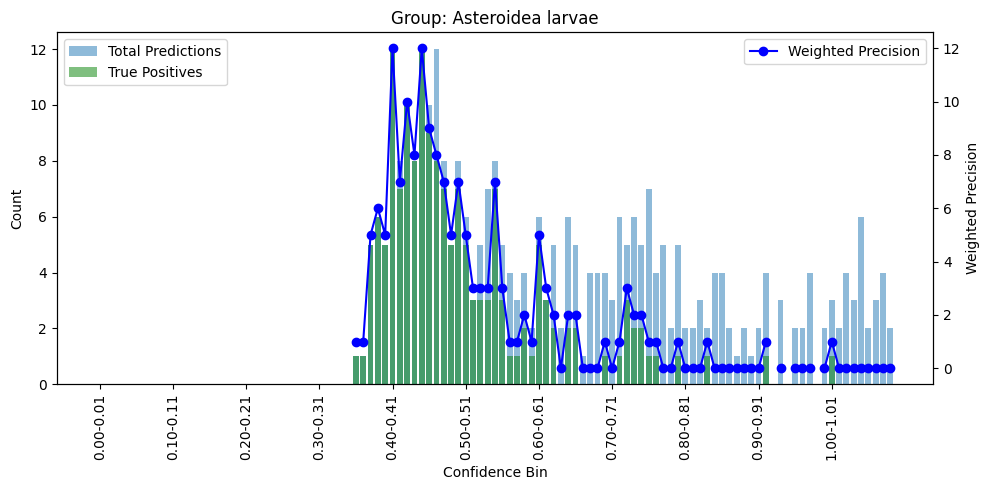

/tmp/ipykernel_833581/2860897024.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']
/tmp/ipykernel_833581/2860897024.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['weighted_precision'] = group_data['precision'] * group_data['total_predictions']


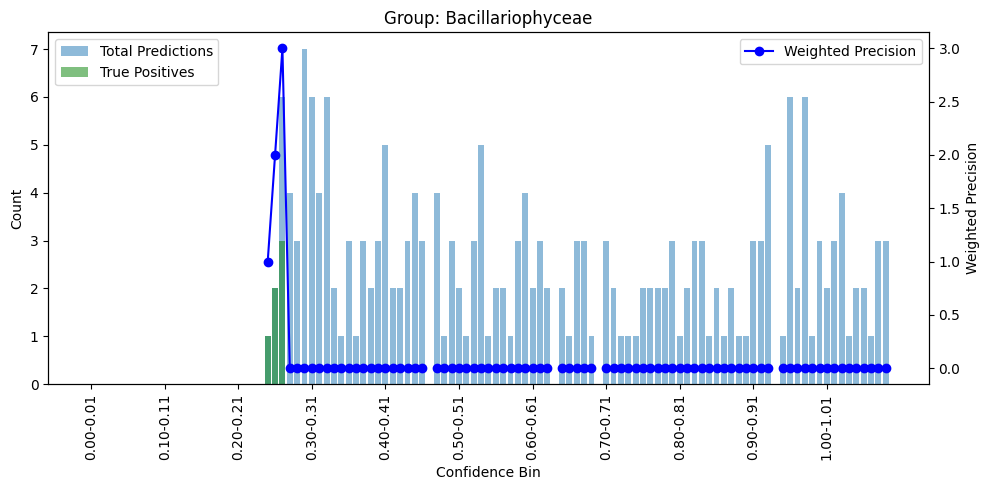

/tmp/ipykernel_833581/2860897024.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']
/tmp/ipykernel_833581/2860897024.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['weighted_precision'] = group_data['precision'] * group_data['total_predictions']


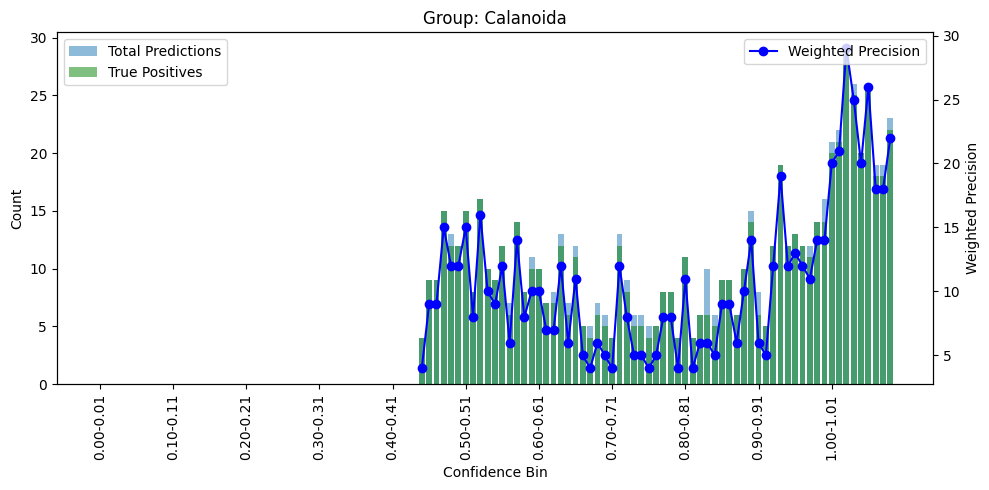

/tmp/ipykernel_833581/2860897024.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']
/tmp/ipykernel_833581/2860897024.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['weighted_precision'] = group_data['precision'] * group_data['total_predictions']


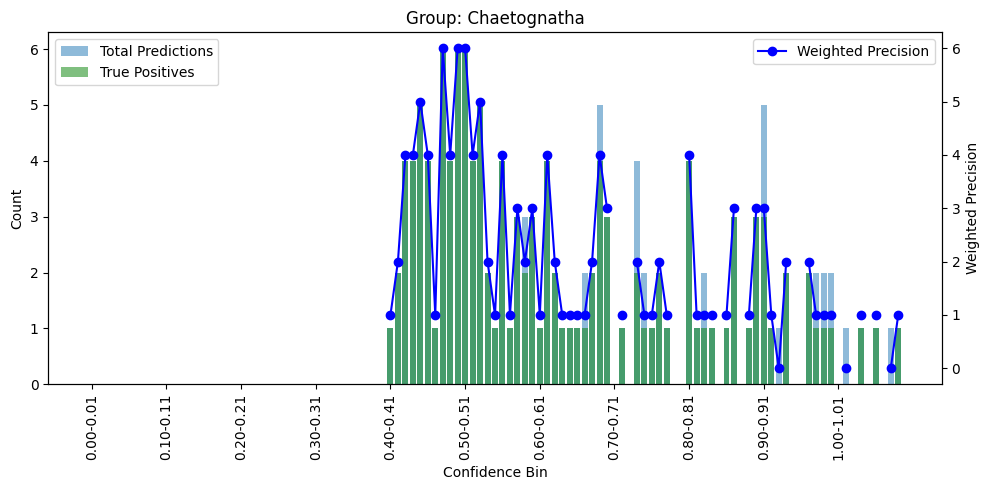

/tmp/ipykernel_833581/2860897024.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']
/tmp/ipykernel_833581/2860897024.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['weighted_precision'] = group_data['precision'] * group_data['total_predictions']


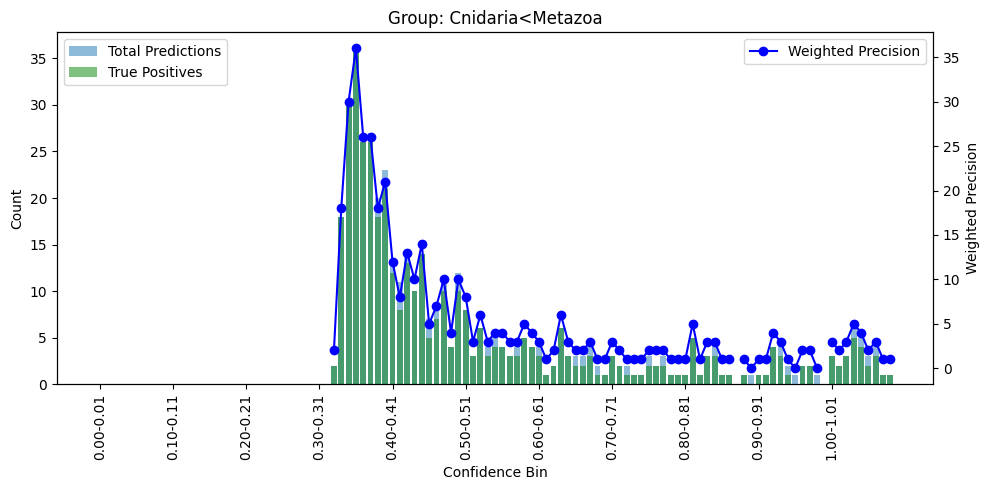

/tmp/ipykernel_833581/2860897024.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']
/tmp/ipykernel_833581/2860897024.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['weighted_precision'] = group_data['precision'] * group_data['total_predictions']


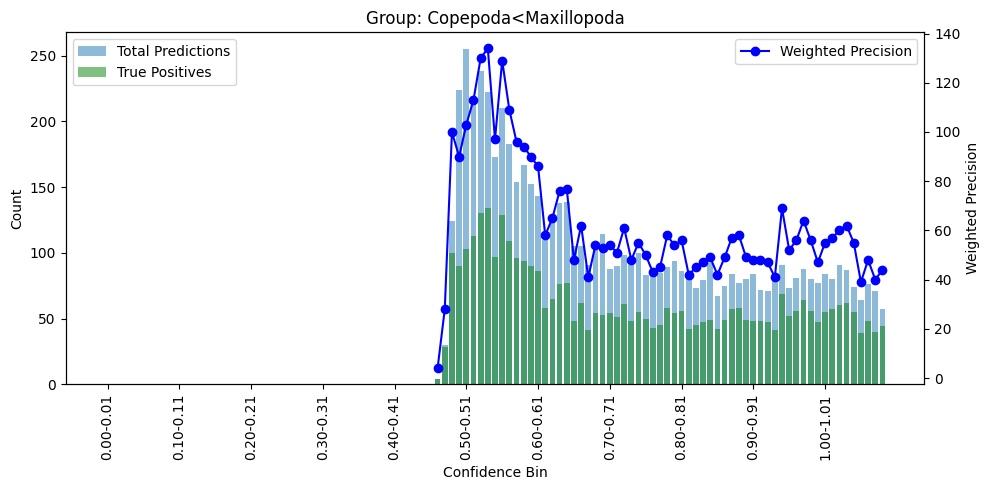

/tmp/ipykernel_833581/2860897024.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']
/tmp/ipykernel_833581/2860897024.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['weighted_precision'] = group_data['precision'] * group_data['total_predictions']


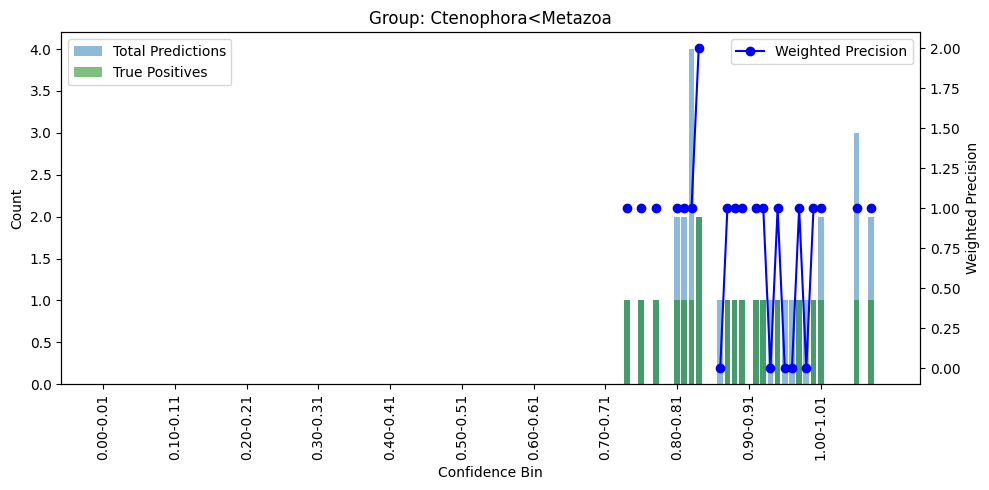

/tmp/ipykernel_833581/2860897024.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']
/tmp/ipykernel_833581/2860897024.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['weighted_precision'] = group_data['precision'] * group_data['total_predictions']


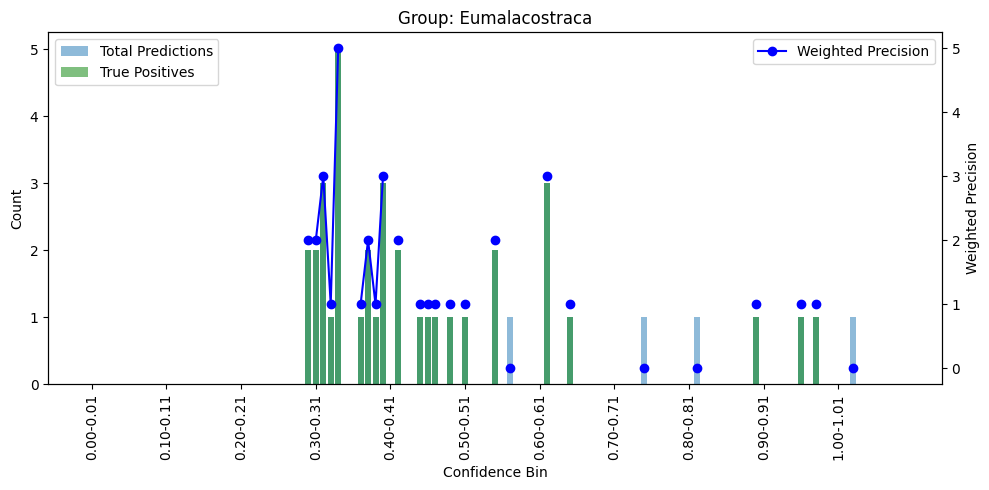

/tmp/ipykernel_833581/2860897024.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']
/tmp/ipykernel_833581/2860897024.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['weighted_precision'] = group_data['precision'] * group_data['total_predictions']


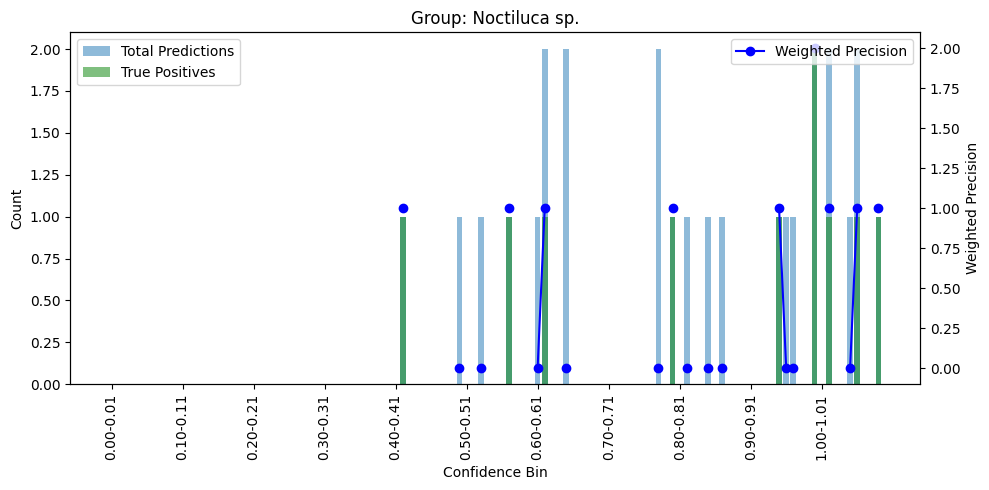

/tmp/ipykernel_833581/2860897024.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']
/tmp/ipykernel_833581/2860897024.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['weighted_precision'] = group_data['precision'] * group_data['total_predictions']


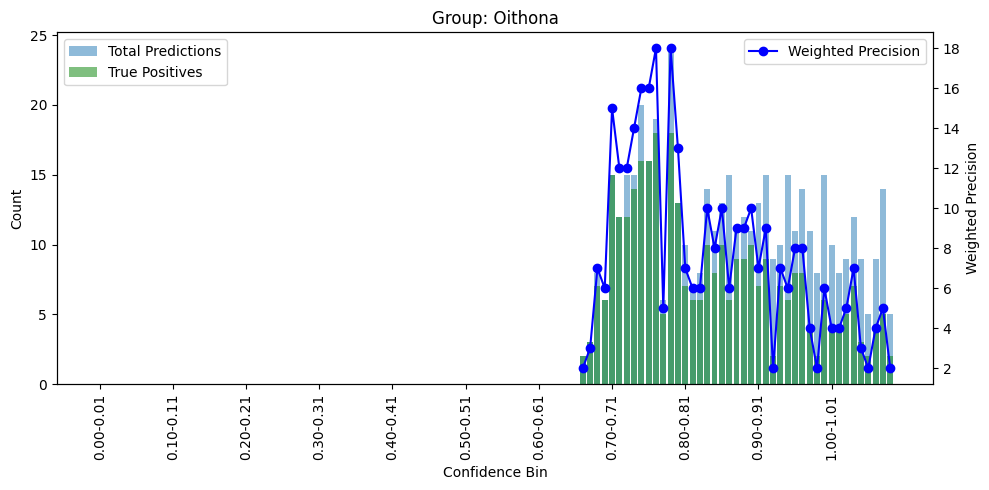

/tmp/ipykernel_833581/2860897024.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']
/tmp/ipykernel_833581/2860897024.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['weighted_precision'] = group_data['precision'] * group_data['total_predictions']


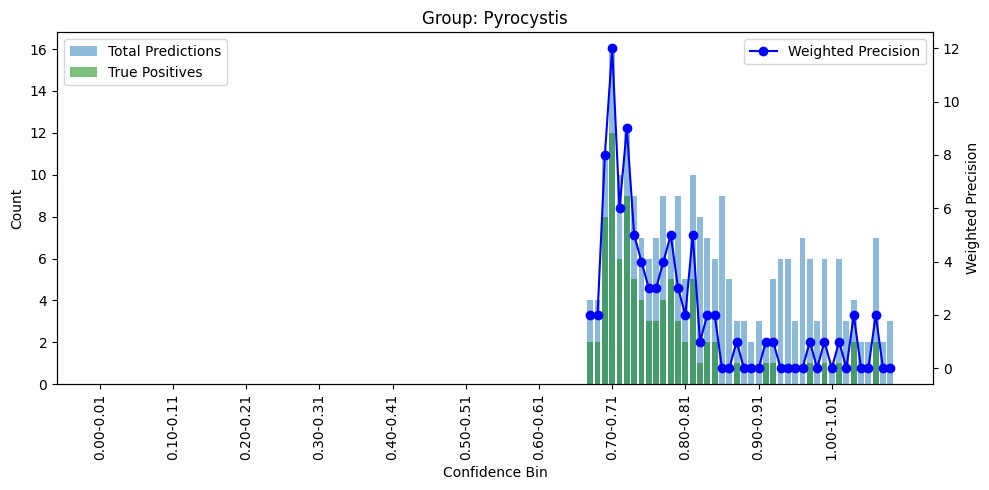

/tmp/ipykernel_833581/2860897024.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']
/tmp/ipykernel_833581/2860897024.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['weighted_precision'] = group_data['precision'] * group_data['total_predictions']


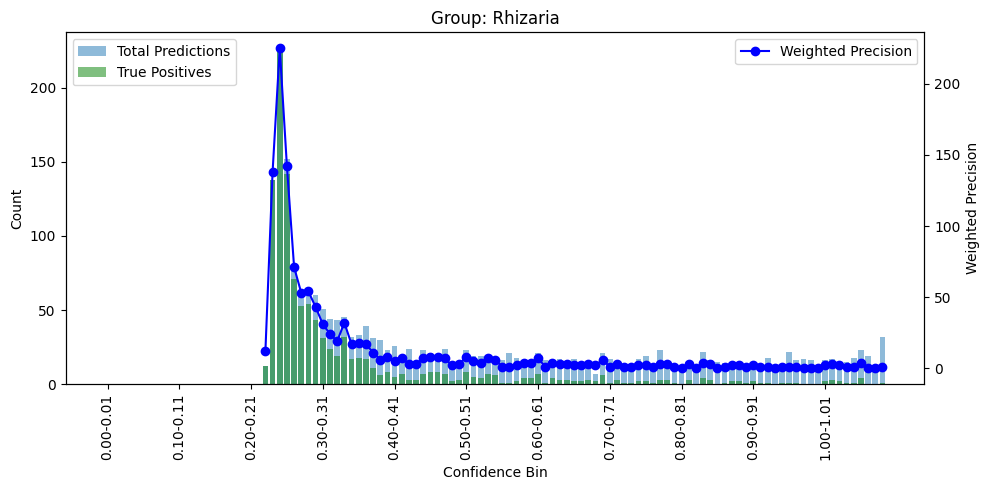

/tmp/ipykernel_833581/2860897024.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']
/tmp/ipykernel_833581/2860897024.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['weighted_precision'] = group_data['precision'] * group_data['total_predictions']


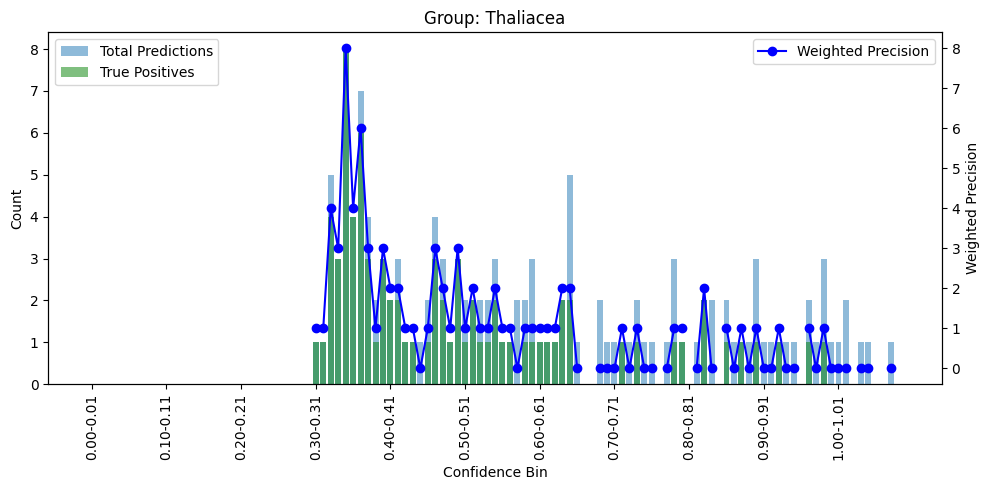

/tmp/ipykernel_833581/2860897024.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']
/tmp/ipykernel_833581/2860897024.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['weighted_precision'] = group_data['precision'] * group_data['total_predictions']


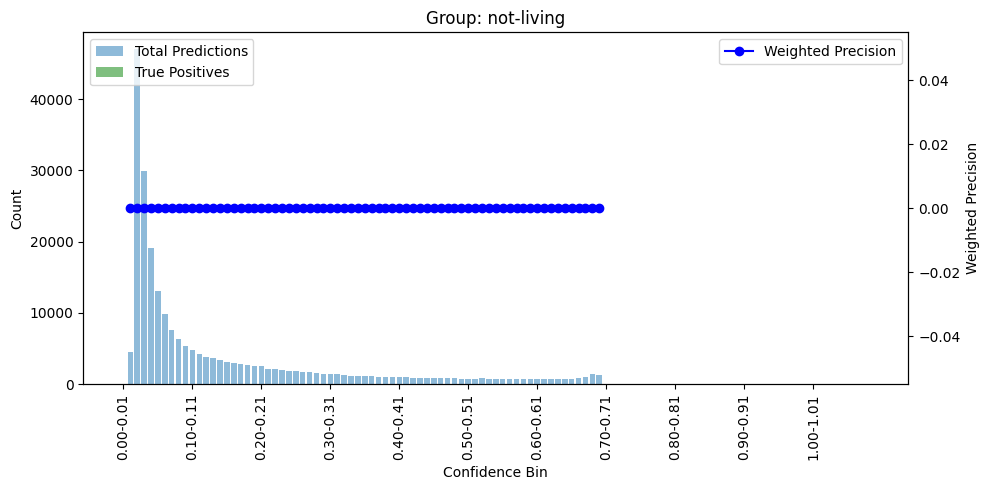

/tmp/ipykernel_833581/2860897024.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']
/tmp/ipykernel_833581/2860897024.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['weighted_precision'] = group_data['precision'] * group_data['total_predictions']


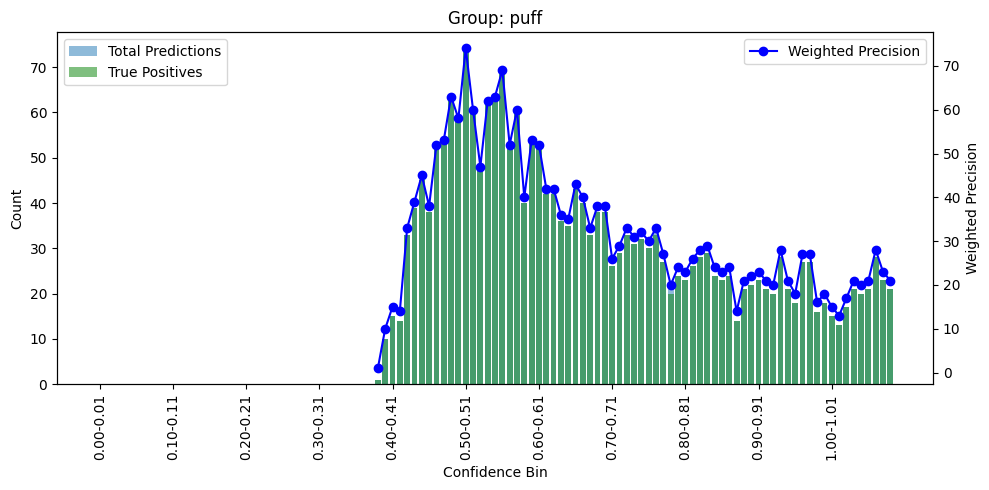

/tmp/ipykernel_833581/2860897024.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']
/tmp/ipykernel_833581/2860897024.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['weighted_precision'] = group_data['precision'] * group_data['total_predictions']


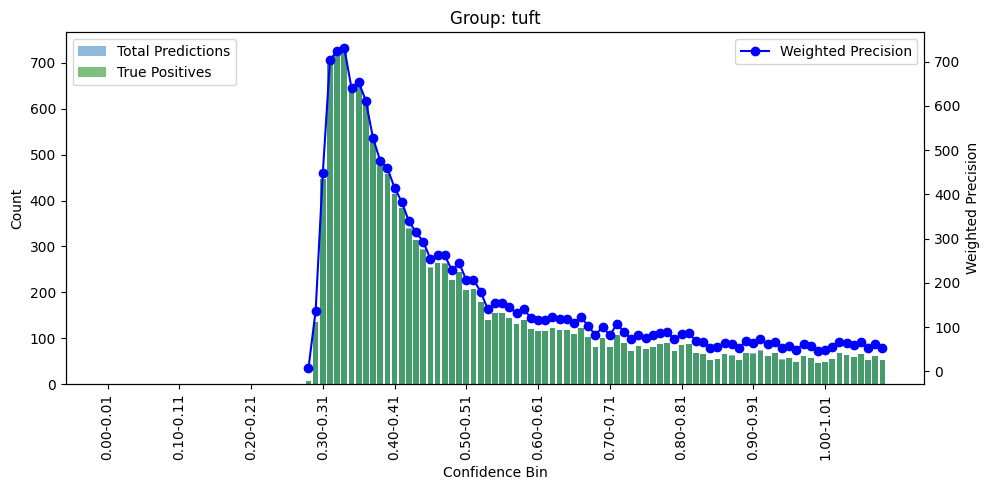

In [13]:
def bin_group_confidence(group_df):
    # Bin by confidence (object_entropy) in steps of 0.1
    bins = np.arange(0, 1.1, 0.01)
    labels = [f"{bins[i]:.2f}-{bins[i+1]:.2f}" for i in range(len(bins)-1)]
    #labels = [f"{round(bins[i],1)}-{round(bins[i+1],1)}" for i in range(len(bins)-1)]
    group_df['confidence_bin'] = pd.cut(group_df['object_entropy'], bins=bins, labels=labels, include_lowest=True)
    return group_df

df_binned_conf = df.groupby('object_annotation_category', group_keys=False).apply(bin_group_confidence)

# Calculate stats per confidence bin
bin_stats_conf = df_binned_conf.groupby(['object_annotation_category', 'confidence_bin']).agg(
    total_predictions=('object_id', 'count'),
    true_positives=('object_annotation_status', lambda x: (x == 'validated').sum()),
    mean_entropy=('object_entropy', 'mean')
).reset_index()

# Plot for each group
for group in bin_stats_conf['object_annotation_category'].unique():
    group_data = bin_stats_conf[bin_stats_conf['object_annotation_category'] == group]
    # Calculate weighted precision for each bin
    group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']
    group_data['weighted_precision'] = group_data['precision'] * group_data['total_predictions']
    
    fig, ax1 = plt.subplots(figsize=(10,5))
    ax1.bar(group_data['confidence_bin'], group_data['total_predictions'], alpha=0.5, label='Total Predictions')
    ax1.bar(group_data['confidence_bin'], group_data['true_positives'], alpha=0.5, label='True Positives', color='green')
    ax1.set_xlabel('Confidence Bin')
    ax1.set_ylabel('Count')
    ax1.legend(loc='upper left')
    ax2 = ax1.twinx()
    ax2.plot(group_data['confidence_bin'], group_data['weighted_precision'], color='blue', marker='o', label='Weighted Precision')
    ax2.set_ylabel('Weighted Precision')
    ax2.legend(loc='upper right')
    plt.title(f'Group: {group}')

        # Show every 10th bin label
    step = 10
    ticks = np.arange(0, len(group_data['confidence_bin']), step)
    ax1.set_xticks(ticks)
    ax1.set_xticklabels(group_data['confidence_bin'].iloc[ticks], rotation=90)

    plt.tight_layout()
    plt.show()

### Moving Average to smooth Precision ###

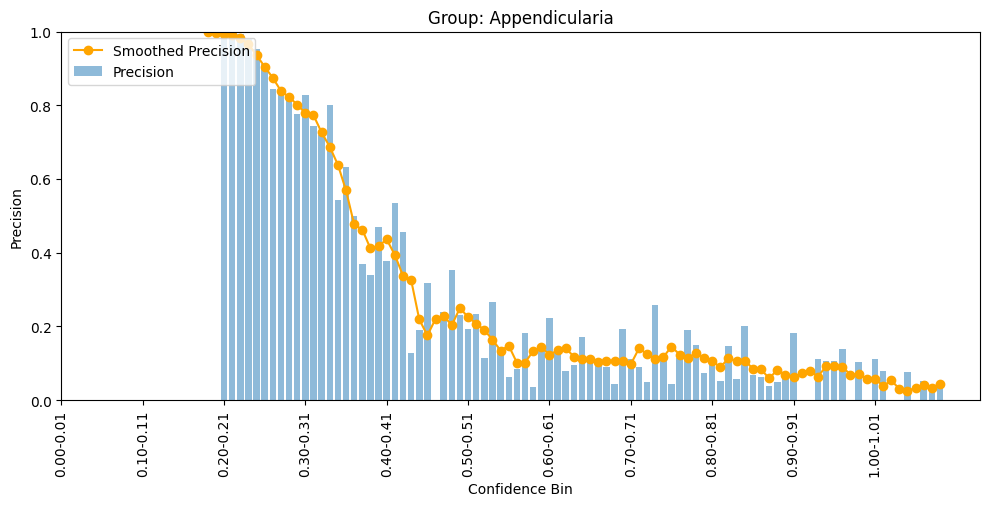

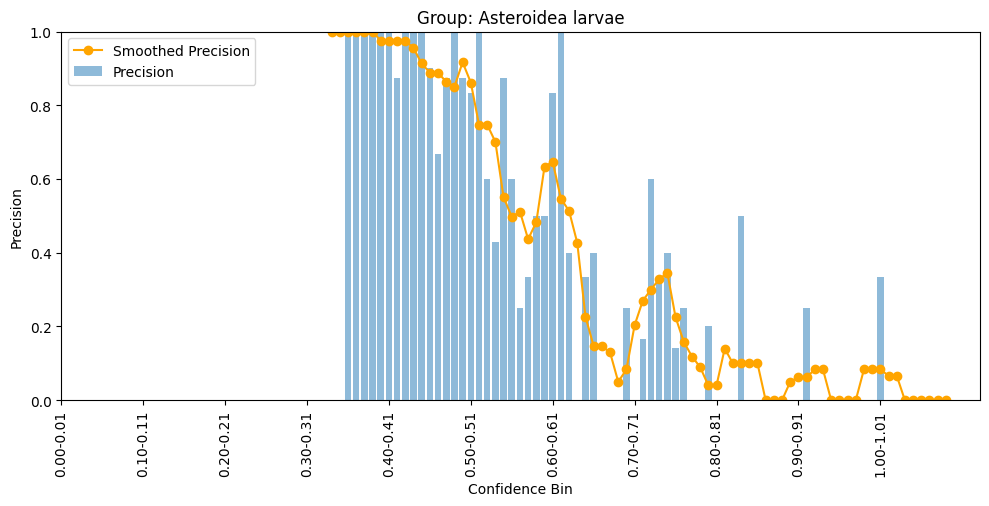

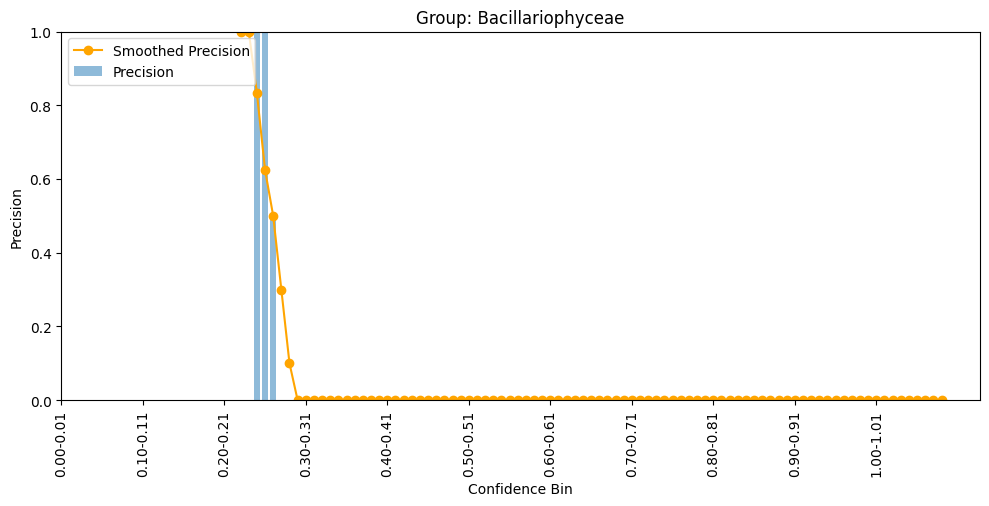

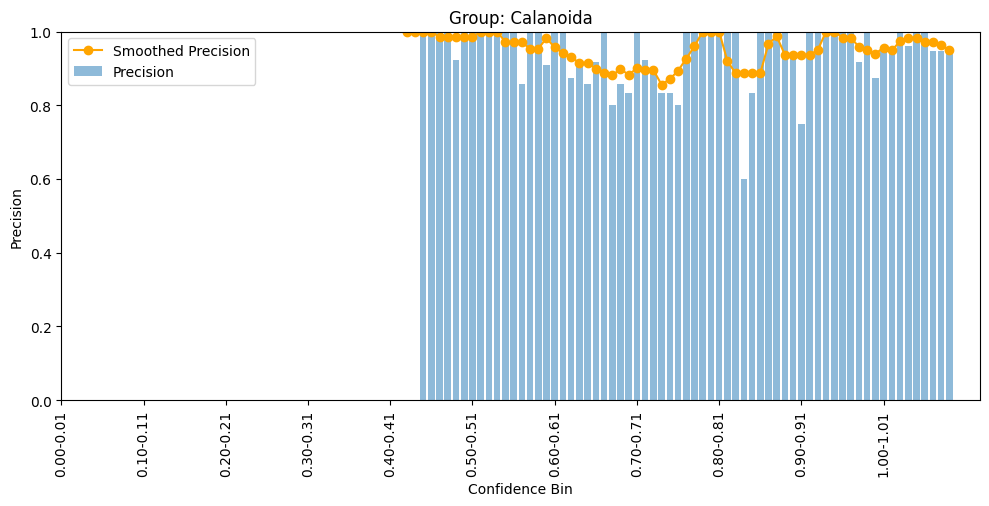

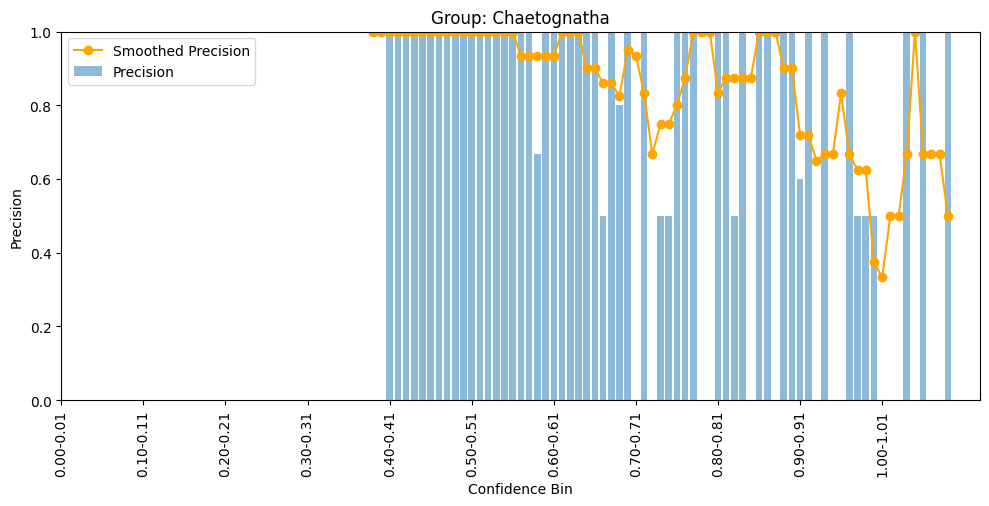

...

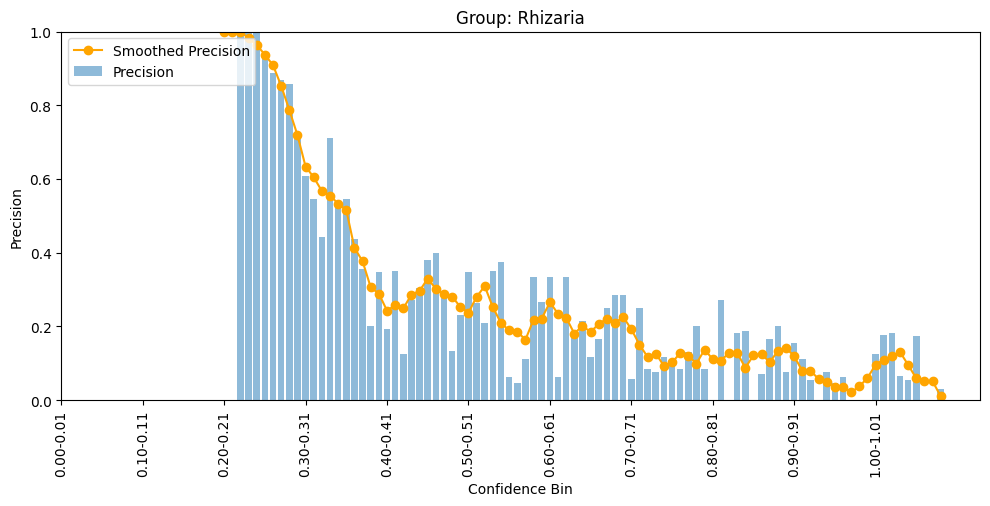

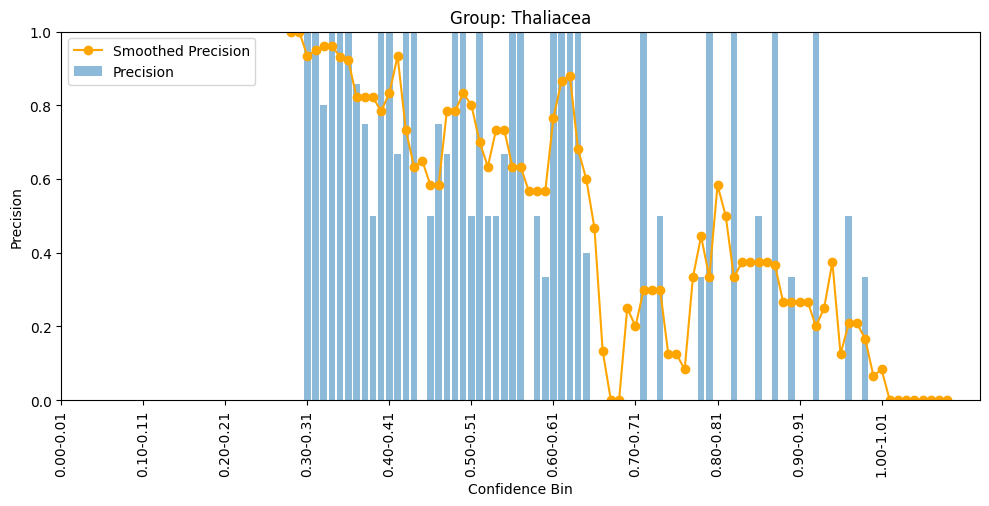

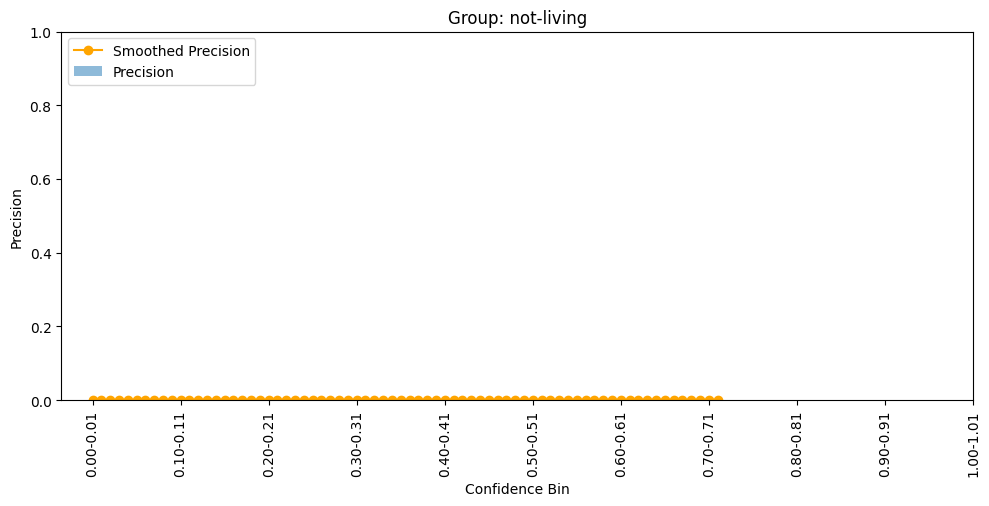

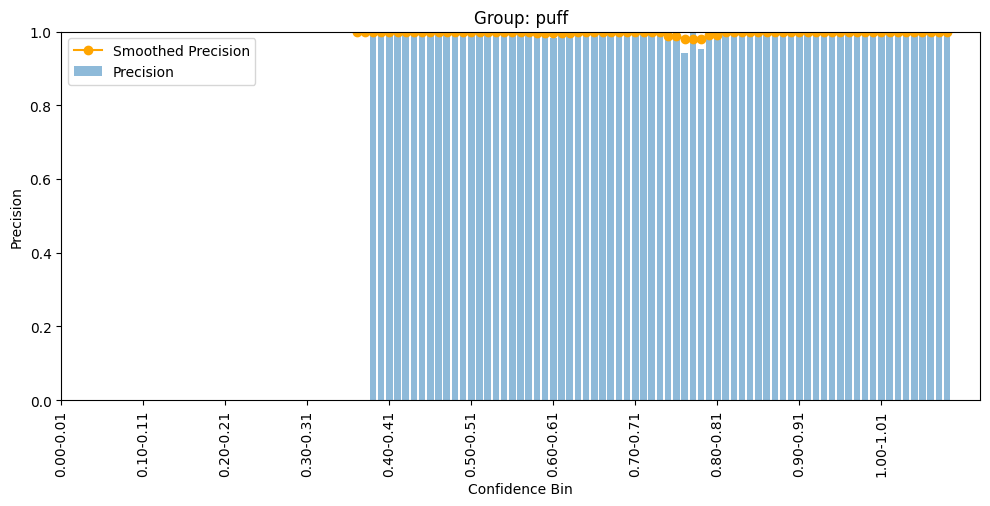

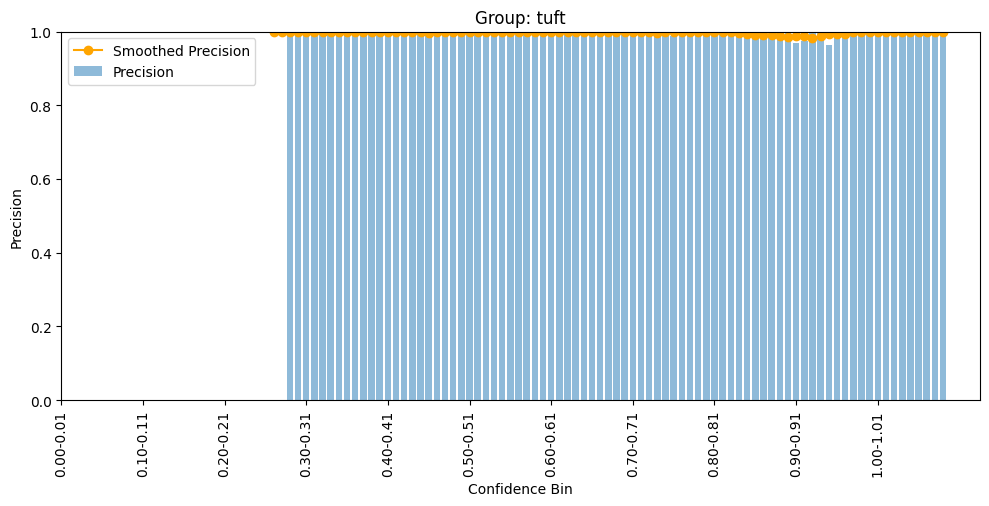

In [14]:
for group in bin_stats_conf['object_annotation_category'].unique():
    group_data = bin_stats_conf[bin_stats_conf['object_annotation_category'] == group].copy()
    group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']
    # Smooth precision with rolling mean
    group_data['smoothed_precision'] = group_data['precision'].rolling(window=5, min_periods=1, center=True).mean()

    fig, ax1 = plt.subplots(figsize=(10,5))
    ax1.bar(group_data['confidence_bin'], group_data['precision'], alpha=0.5, label='Precision')
    ax1.plot(group_data['confidence_bin'], group_data['smoothed_precision'], color='orange', marker='o', label='Smoothed Precision')
    ax1.set_xlabel('Confidence Bin')
    ax1.set_ylabel('Precision')
    ax1.set_ylim(0, 1)
    ax1.legend(loc='upper left')

    # Show every 10th bin label
    step = 10
    ticks = np.arange(0, len(group_data['confidence_bin']), step)
    ax1.set_xticks(ticks)
    ax1.set_xticklabels(group_data['confidence_bin'].iloc[ticks], rotation=90)

    plt.tight_layout()
    plt.title(f'Group: {group}')
    plt.show()

### moving average precision ###

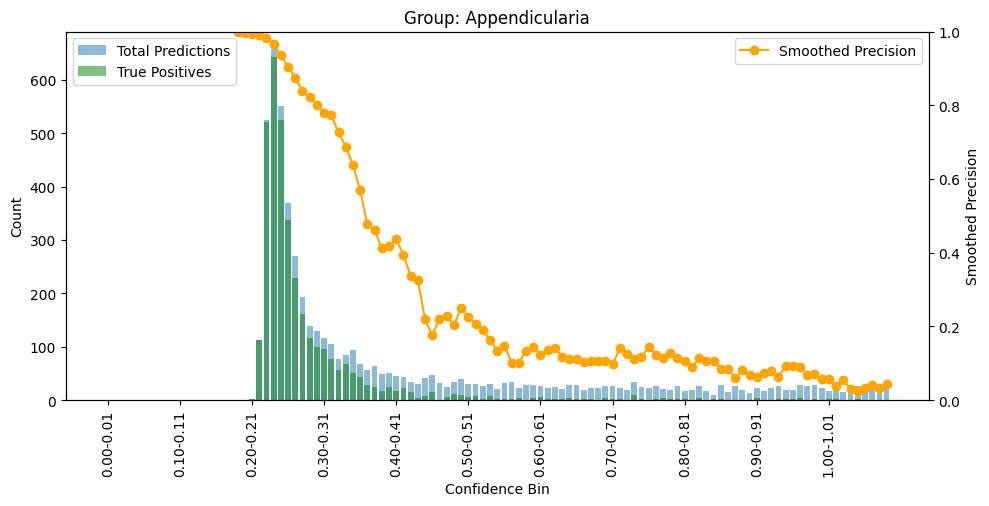

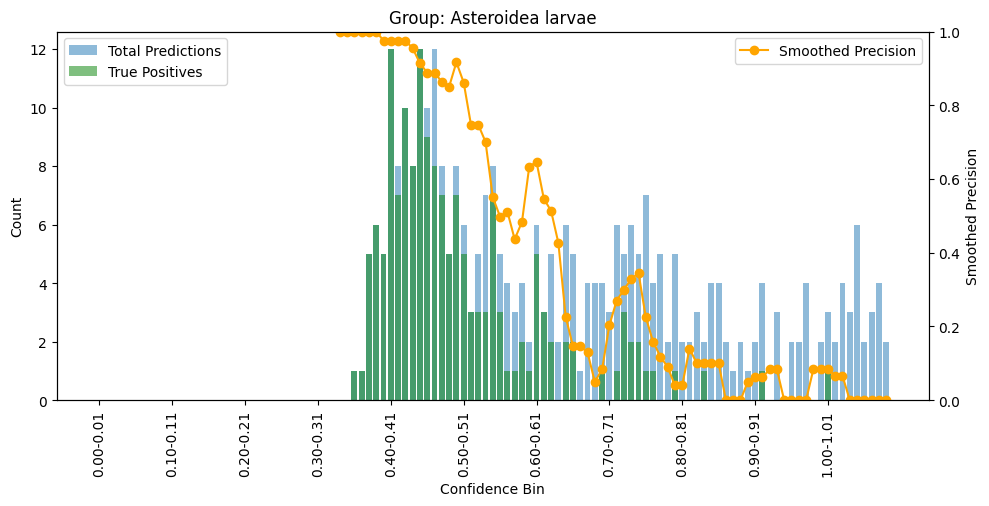

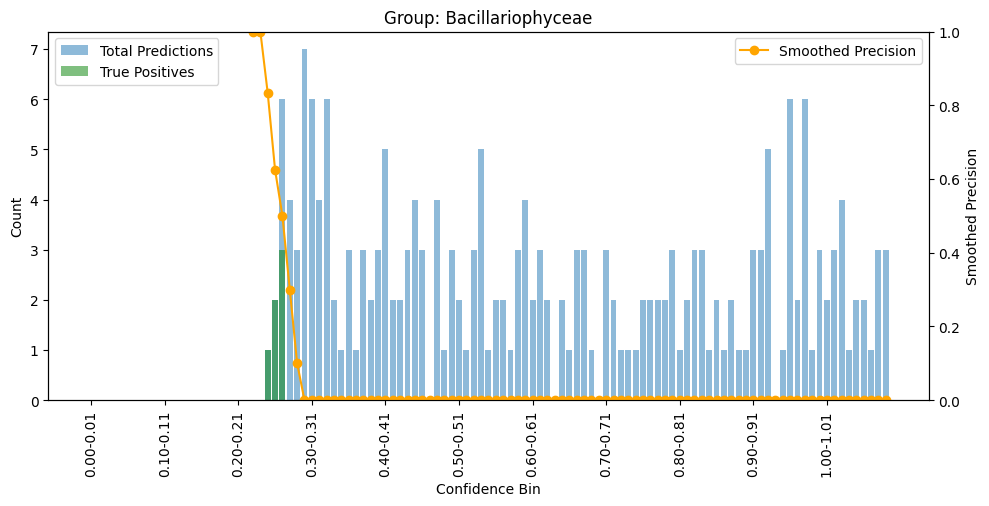

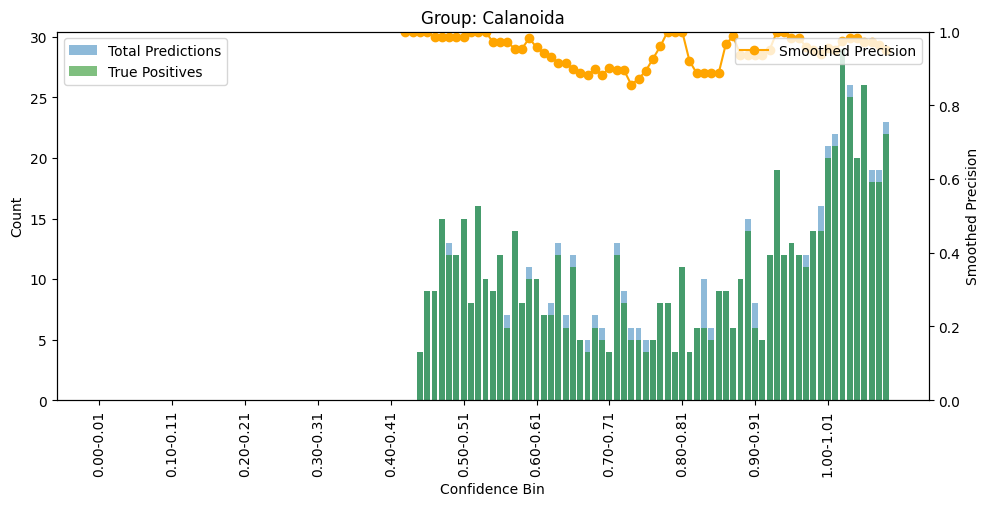

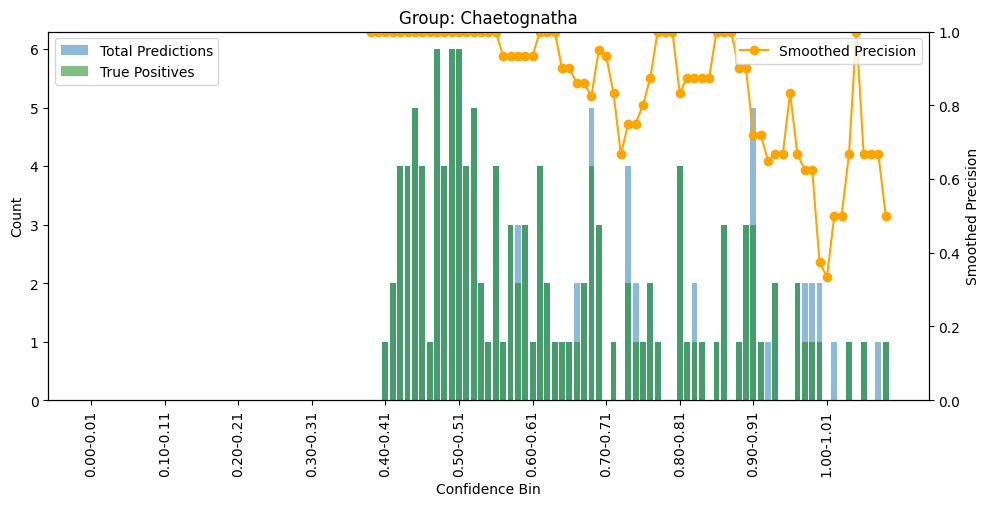

...

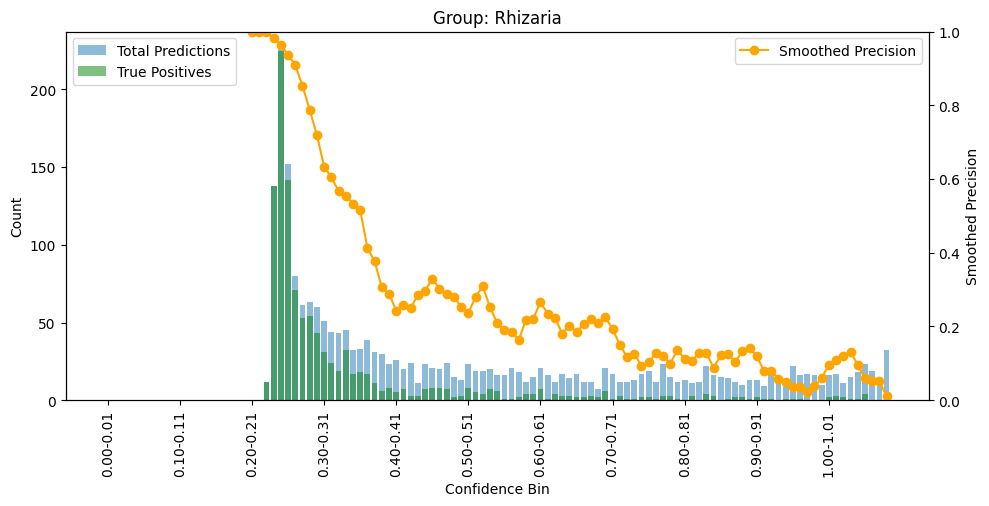

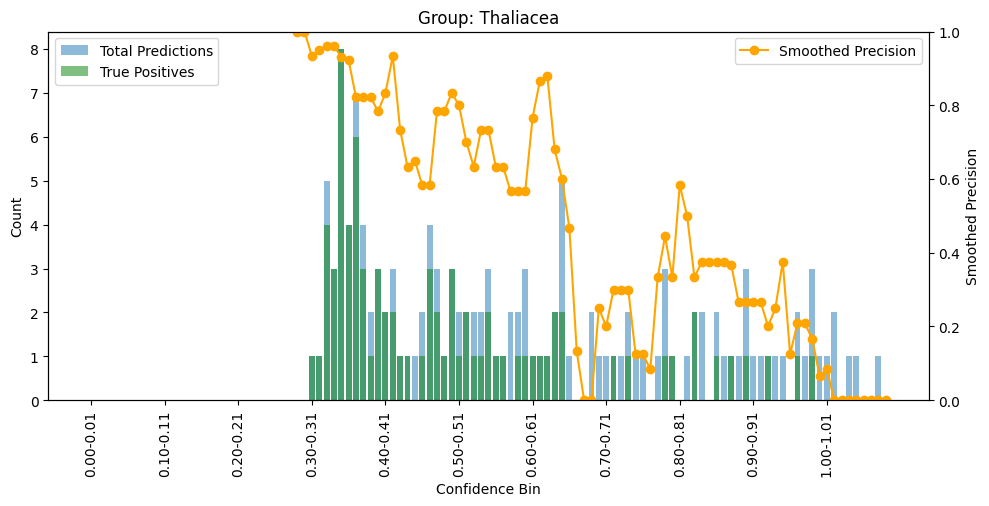

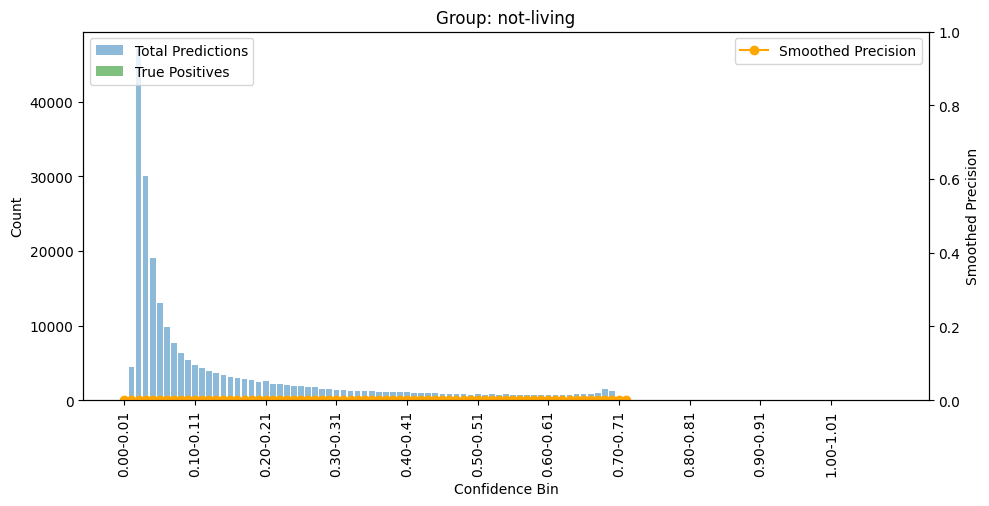

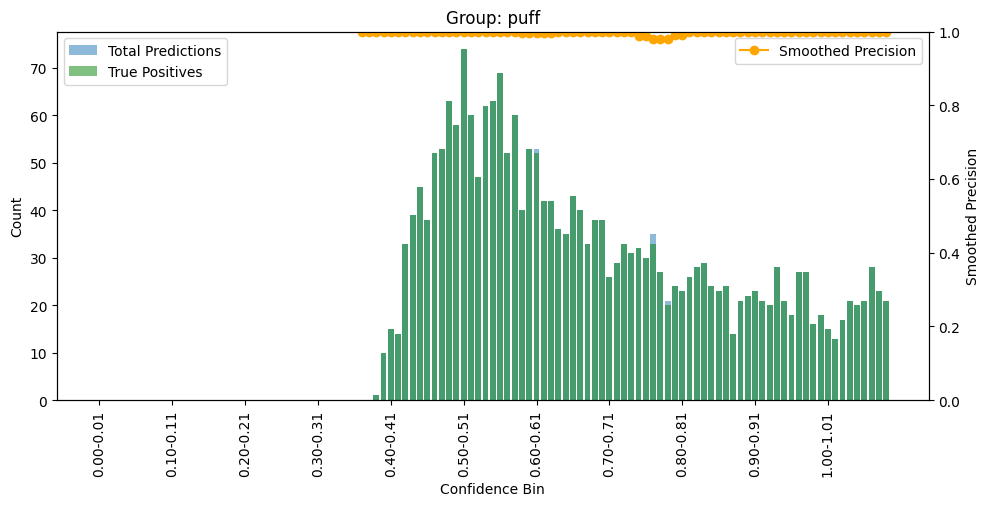

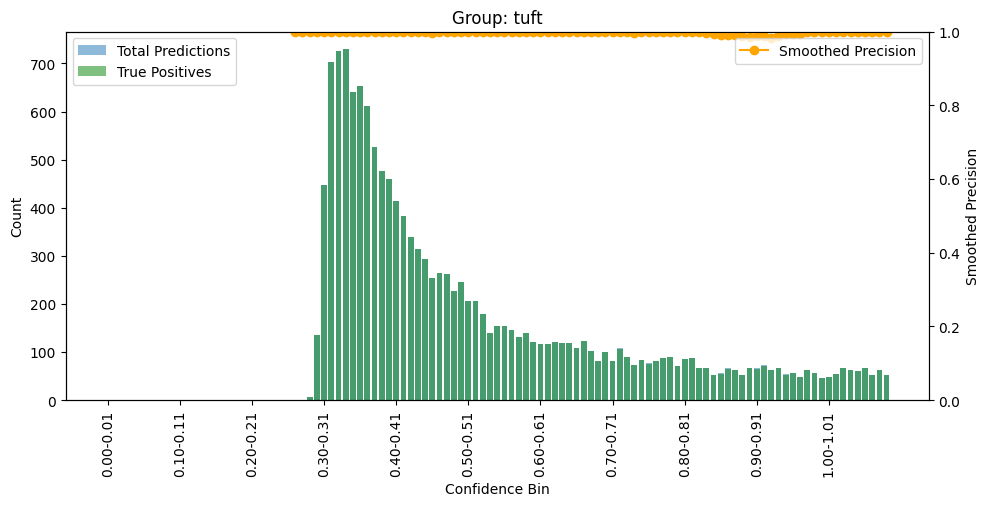

In [15]:
for group in bin_stats_conf['object_annotation_category'].unique():
    group_data = bin_stats_conf[bin_stats_conf['object_annotation_category'] == group].copy()
    group_data['precision'] = group_data['true_positives'] / group_data['total_predictions']
    group_data['smoothed_precision'] = group_data['precision'].rolling(window=5, min_periods=1, center=True).mean()

    fig, ax1 = plt.subplots(figsize=(10,5))
    ax1.bar(group_data['confidence_bin'], group_data['total_predictions'], alpha=0.5, label='Total Predictions')
    ax1.bar(group_data['confidence_bin'], group_data['true_positives'], alpha=0.5, label='True Positives', color='green')
    ax1.set_xlabel('Confidence Bin')
    ax1.set_ylabel('Count')
    ax1.legend(loc='upper left')

    ax2 = ax1.twinx()
    ax2.plot(group_data['confidence_bin'], group_data['smoothed_precision'], color='orange', marker='o', label='Smoothed Precision')
    ax2.set_ylabel('Smoothed Precision')
    ax2.set_ylim(0, 1)
    ax2.legend(loc='upper right')

    step = 10
    ticks = np.arange(0, len(group_data['confidence_bin']), step)
    ax1.set_xticks(ticks)
    ax1.set_xticklabels(group_data['confidence_bin'].iloc[ticks], rotation=90)

    plt.tight_layout()
    plt.title(f'Group: {group}')

In [2]:
thresholds = np.arange(0, 1.01, 0.1)
classes = df_five_profiles['object_annotation_category'].unique()

plt.figure(figsize=(10,6))

for idx, cls in enumerate(classes):
    precisions = []
    for thresh in thresholds:
        filtered = df_five_profiles[(df_five_profiles['object_annotation_category'] == cls) & (df_five_profiles['object_entropy'] >= thresh)]
        total_predictions = len(filtered)
        true_positives = (filtered['object_annotation_status'] == 'validated').sum()
        if total_predictions > 0:
            precisions.append(true_positives / total_predictions)
        else:
            precisions.append(np.nan)
    plt.plot(thresholds, precisions, marker='o', label=cls, color=cmap(idx % cmap.N))

plt.xlabel('Confidence Threshold')
plt.ylabel('Average Precision (above threshold)')
plt.title('Average Precision per Class for Different Thresholds')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

NameError: name 'df_five_profiles' is not defined

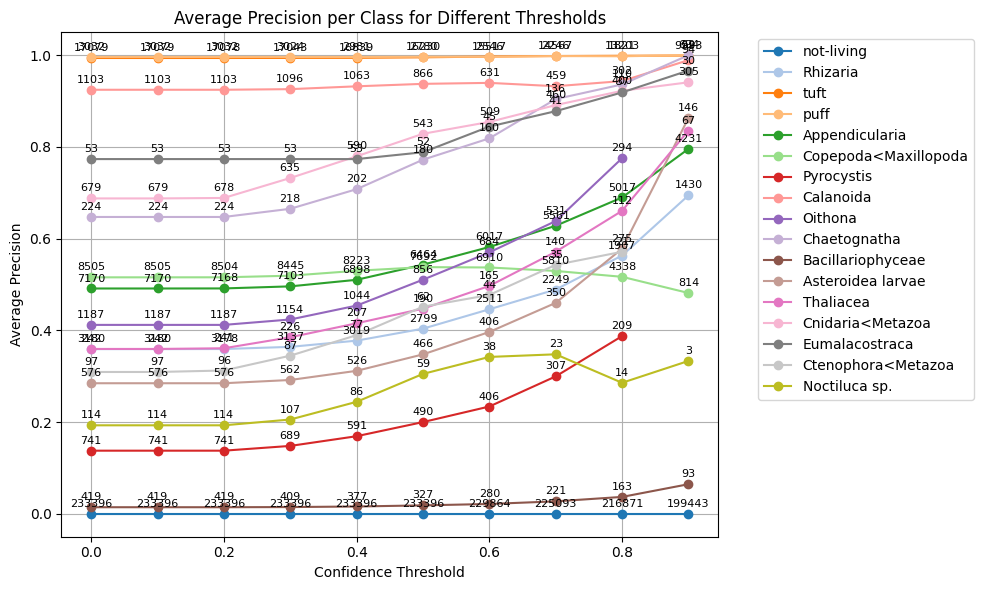

In [ ]:
thresholds = np.arange(0, 1.01, 0.1)
classes = df['object_annotation_category'].unique()
cmap = plt.get_cmap('tab20')  # or 'tab10', 'Set1'

plt.figure(figsize=(10,6))

for idx, cls in enumerate(classes):
    precisions = []
    counts = []
    for thresh in thresholds:
        filtered = df[(df['object_annotation_category'] == cls) & (df['object_prob_1'] >= thresh)]
        total_predictions = len(filtered)
        true_positives = (filtered['object_annotation_status'] == 'validated').sum()
        counts.append(total_predictions)
        if total_predictions > 0:
            precisions.append(true_positives / total_predictions)
        else:
            precisions.append(np.nan)
    plt.plot(thresholds, precisions, marker='o', label=cls, color=cmap(idx % cmap.N))
    # Annotate each point with the count
    for x, y, count in zip(thresholds, precisions, counts):
        if not np.isnan(y):
            plt.annotate(str(count), (x, y), textcoords="offset points", xytext=(0,5), ha='center', fontsize=8)

plt.xlabel('Confidence Threshold')
plt.ylabel('Average Precision')
plt.title('Average Precision per Class for Different Thresholds')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

In [1]:
thresholds = np.arange(0, 1.01, 0.1)
profiles = df_five_profiles['sample_id'].unique()
classes = df_five_profiles['object_annotation_category'].unique()
cmap = plt.get_cmap('tab20')

for profile in profiles:
    df_profile = df_five_profiles[df_five_profiles['sample_id'] == profile]
    plt.figure(figsize=(10,6))
    for idx, cls in enumerate(classes):
        precisions = []
        counts = []
        for thresh in thresholds:
            filtered = df_profile[(df_profile['object_annotation_category'] == cls) & (df_profile['object_entropy'] >= thresh)]
            total_predictions = len(filtered)
            true_positives = (filtered['object_annotation_status'] == 'validated').sum()
            counts.append(total_predictions)
            if total_predictions > 0:
                precisions.append(true_positives / total_predictions)
            else:
                precisions.append(np.nan)
        plt.plot(thresholds, precisions, marker='o', label=cls, color=cmap(idx % cmap.N))
        for x, y, count in zip(thresholds, precisions, counts):
            if not np.isnan(y):
                plt.annotate(str(count), (x, y), textcoords="offset points", xytext=(0,5), ha='center', fontsize=8)
    plt.xlabel('Confidence Threshold')
    plt.ylabel('Average Precision (above threshold)')
    plt.title(f'Average Precision per Class for Different Thresholds\nProfile: {profile}')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

NameError: name 'np' is not defined

/tmp/ipykernel_2285477/3519787390.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  depth_stats = df.groupby('depth_bin').agg(


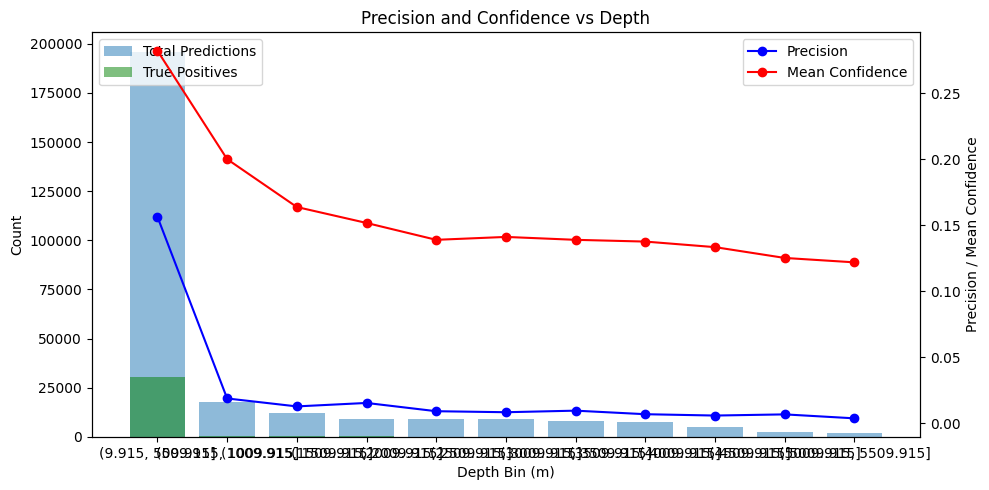

In [ ]:
depth_bins = np.arange(df['object_depth_min'].min(), df['object_depth_min'].max()+500, 500)
df['depth_bin'] = pd.cut(df['object_depth_min'], bins=depth_bins)

# Calculate stats per depth bin
depth_stats = df.groupby('depth_bin').agg(
    total_predictions=('object_id', 'count'),
    true_positives=('object_annotation_status', lambda x: (x == 'validated').sum()),
    mean_confidence=('object_entropy', 'mean')
).reset_index()
depth_stats['precision'] = depth_stats['true_positives'] / depth_stats['total_predictions']

fig, ax1 = plt.subplots(figsize=(10,5))
ax1.bar(depth_stats['depth_bin'].astype(str), depth_stats['total_predictions'], alpha=0.5, label='Total Predictions')
ax1.bar(depth_stats['depth_bin'].astype(str), depth_stats['true_positives'], alpha=0.5, label='True Positives', color='green')
ax1.set_xlabel('Depth Bin (m)')
ax1.set_ylabel('Count')
ax1.legend(loc='upper left')

ax2 = ax1.twinx()
ax2.plot(depth_stats['depth_bin'].astype(str), depth_stats['precision'], color='blue', marker='o', label='Precision')
ax2.plot(depth_stats['depth_bin'].astype(str), depth_stats['mean_confidence'], color='red', marker='o', label='Mean Confidence')
ax2.set_ylabel('Precision / Mean Confidence')
ax2.legend(loc='upper right')

plt.title('Precision and Confidence vs Depth')
plt.tight_layout()
plt.show()

/tmp/ipykernel_2285477/564794183.py:1: DtypeWarning: Columns (11,12,13,14) have mixed types. Specify dtype option on import or set low_memory=False.
  non_living_df = pd.read_csv('/home/fanny/Downloads/non_living_predicted.csv')


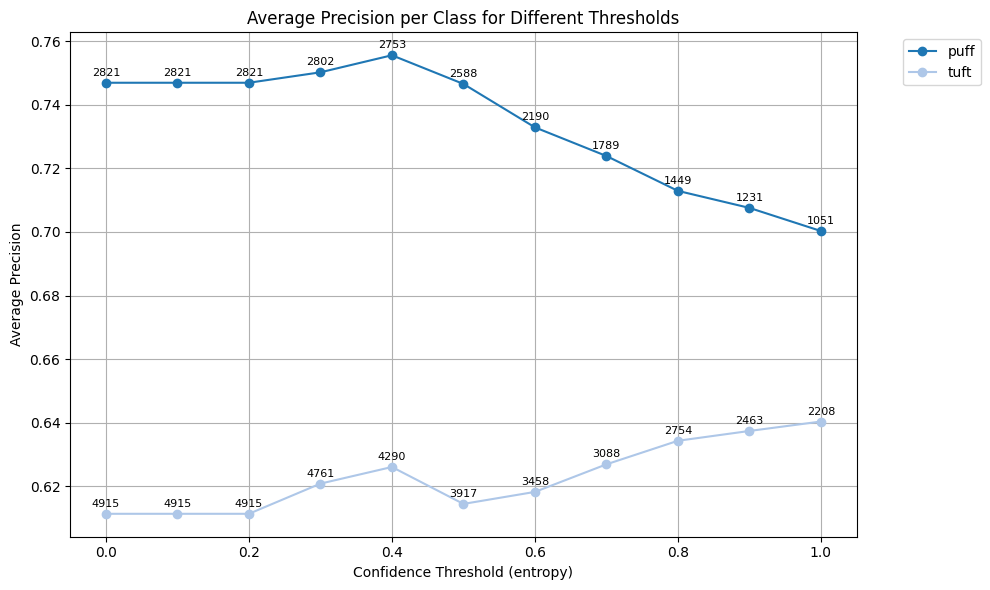

In [ ]:
non_living_df = pd.read_csv('/home/fanny/Downloads/non_living_predicted.csv')
non_living_CTD50_df = non_living_df[non_living_df['sample_id'] == 'M181-175-1_CTD-050_00Â°00S-019Â°00W_20220509-0543']

thresholds = np.arange(0, 1.01, 0.1)
#classes = df_trichodesmium['object_annotation_category'].unique()
classes_to_plot = ['puff', 'tuft']
cmap = plt.get_cmap('tab20')  # or 'tab10', 'Set1'

plt.figure(figsize=(10,6))

for idx, cls in enumerate(classes_to_plot):
    precisions = []
    counts = []
    for thresh in thresholds:
        filtered = non_living_CTD50_df[(non_living_CTD50_df['object_annotation_category'] == cls) & (non_living_CTD50_df['entropy'] >= thresh)]
        total_predictions = len(filtered)
        true_positives = (filtered['object_annotation_status'] == 'validated').sum()
        counts.append(total_predictions)
        if total_predictions > 0:
            precisions.append(true_positives / total_predictions)
        else:
            precisions.append(np.nan)
    plt.plot(thresholds, precisions, marker='o', label=cls, color=cmap(idx % cmap.N))
    # Annotate each point with the count
    for x, y, count in zip(thresholds, precisions, counts):
        if not np.isnan(y):
            plt.annotate(str(count), (x, y), textcoords="offset points", xytext=(0,5), ha='center', fontsize=8)

plt.xlabel('Confidence Threshold (entropy)')
plt.ylabel('Average Precision')
plt.title('Average Precision per Class for Different Thresholds')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

/tmp/ipykernel_2285477/1302183969.py:4: DtypeWarning: Columns (11,12,13,14) have mixed types. Specify dtype option on import or set low_memory=False.
  non_living_df = pd.read_csv('/home/fanny/Downloads/non_living_predicted.csv')


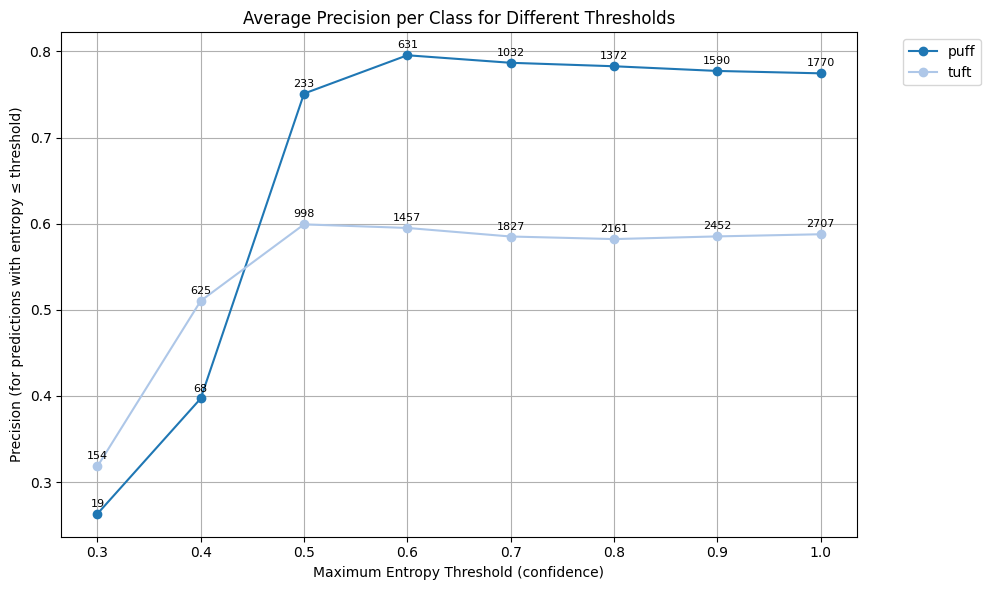

count    233396.000000
mean          1.209293
std           0.592307
min           0.216759
25%           0.661141
50%           1.152178
75%           1.728364
max           2.563065
Name: entropy, dtype: float64


In [ ]:
df_puff = pd.read_csv('/home/fanny/Profiles/ET_non-living_export__TSV_17720_20250808_0926/ecotaxa_puff.tsv', sep='\t')
df_tuft = pd.read_csv('/home/fanny/Profiles/ET_non-living_export__TSV_17720_20250808_0926/ecotaxa_tuft.tsv', sep='\t')
df_trichodesmium = pd.concat([df_puff, df_tuft], ignore_index=True)
non_living_df = pd.read_csv('/home/fanny/Downloads/non_living_predicted.csv')
non_living_CTD50_df = non_living_df[non_living_df['sample_id'] == 'M181-175-1_CTD-050_00Â°00S-019Â°00W_20220509-0543']


thresholds = np.arange(0, 1.01, 0.1)
#classes = df_trichodesmium['object_annotation_category'].unique()
classes_to_plot = ['puff', 'tuft']
cmap = plt.get_cmap('tab20')  # or 'tab10', 'Set1'

plt.figure(figsize=(10,6))

for idx, cls in enumerate(classes_to_plot):
    precisions = []
    counts = []
    for thresh in thresholds:
        filtered = non_living_CTD50_df[(non_living_CTD50_df['object_annotation_category'] == cls) & (non_living_CTD50_df['entropy'] <= thresh)]
        total_predictions = len(filtered)
        true_positives = (filtered['object_annotation_status'] == 'validated').sum()
        counts.append(total_predictions)
        if total_predictions > 0:
            precisions.append(true_positives / total_predictions)
        else:
            precisions.append(np.nan)
    plt.plot(thresholds, precisions, marker='o', label=cls, color=cmap(idx % cmap.N))
    # Annotate each point with the count
    for x, y, count in zip(thresholds, precisions, counts):
        if not np.isnan(y):
            plt.annotate(str(count), (x, y), textcoords="offset points", xytext=(0,5), ha='center', fontsize=8)

#plt.xlabel('Confidence Threshold (entropy)')
#plt.ylabel('Average Precision (above threshold)')
plt.xlabel('Maximum Entropy Threshold (confidence)')
plt.ylabel('Precision (for predictions with entropy ≤ threshold)')
plt.title('Average Precision per Class for Different Thresholds')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()


print(non_living_df['entropy'].describe())

/tmp/ipykernel_2285477/326350359.py:1: DtypeWarning: Columns (11,12,13,14) have mixed types. Specify dtype option on import or set low_memory=False.
  non_living_df = pd.read_csv('/home/fanny/Downloads/non_living_predicted.csv')
/tmp/ipykernel_2285477/326350359.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  non_living_CTD50_df['confidence'] = 1 - non_living_CTD50_df['entropy']


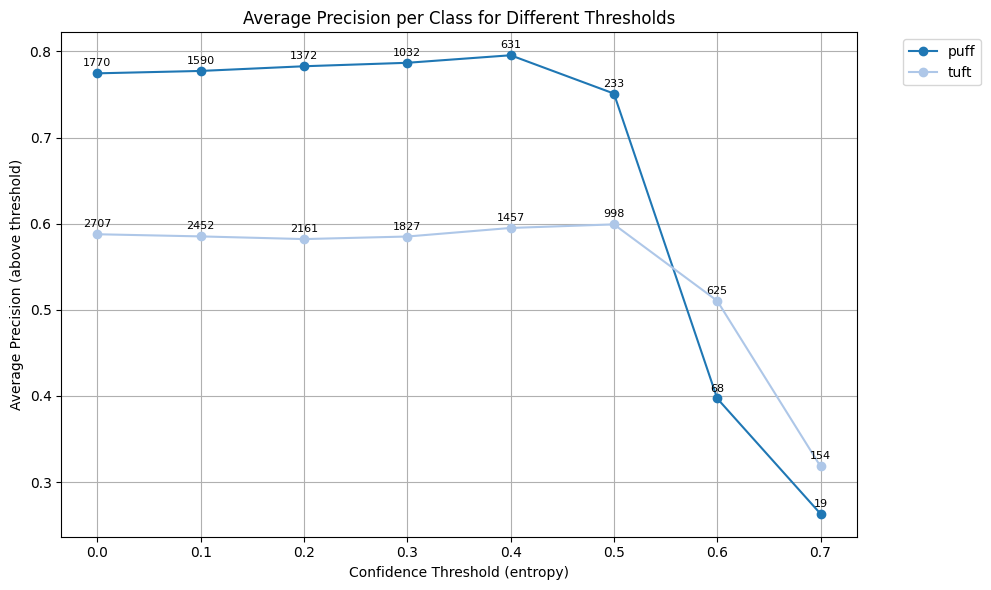

count    50644.000000
mean        -0.151019
std          0.582034
min         -1.531097
25%         -0.633610
50%         -0.029893
75%          0.371330
max          0.779393
Name: confidence, dtype: float64


In [ ]:
non_living_df = pd.read_csv('/home/fanny/Downloads/non_living_predicted.csv')
non_living_CTD50_df = non_living_df[non_living_df['sample_id'] == 'M181-175-1_CTD-050_00Â°00S-019Â°00W_20220509-0543']
non_living_CTD50_df['confidence'] = 1 - non_living_CTD50_df['entropy']


thresholds = np.arange(0, 1.01, 0.1)
#classes = df_trichodesmium['object_annotation_category'].unique()
classes_to_plot = ['puff', 'tuft']
cmap = plt.get_cmap('tab20')  # or 'tab10', 'Set1'

plt.figure(figsize=(10,6))

for idx, cls in enumerate(classes_to_plot):
    precisions = []
    counts = []
    for thresh in thresholds:
        filtered = non_living_CTD50_df[(non_living_CTD50_df['object_annotation_category'] == cls) & (non_living_CTD50_df['confidence'] >= thresh)]
        total_predictions = len(filtered)
        true_positives = (filtered['object_annotation_status'] == 'validated').sum()
        counts.append(total_predictions)
        if total_predictions > 0:
            precisions.append(true_positives / total_predictions)
        else:
            precisions.append(np.nan)
    plt.plot(thresholds, precisions, marker='o', label=cls, color=cmap(idx % cmap.N))
    # Annotate each point with the count
    for x, y, count in zip(thresholds, precisions, counts):
        if not np.isnan(y):
            plt.annotate(str(count), (x, y), textcoords="offset points", xytext=(0,5), ha='center', fontsize=8)

plt.xlabel('Confidence Threshold (entropy)')
plt.ylabel('Average Precision (above threshold)')
plt.title('Average Precision per Class for Different Thresholds')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

print(non_living_CTD50_df['confidence'].describe())

/tmp/ipykernel_2285477/2551011711.py:4: DtypeWarning: Columns (11,12,13,14) have mixed types. Specify dtype option on import or set low_memory=False.
  non_living_df = pd.read_csv('/home/fanny/Downloads/non_living_predicted.csv')


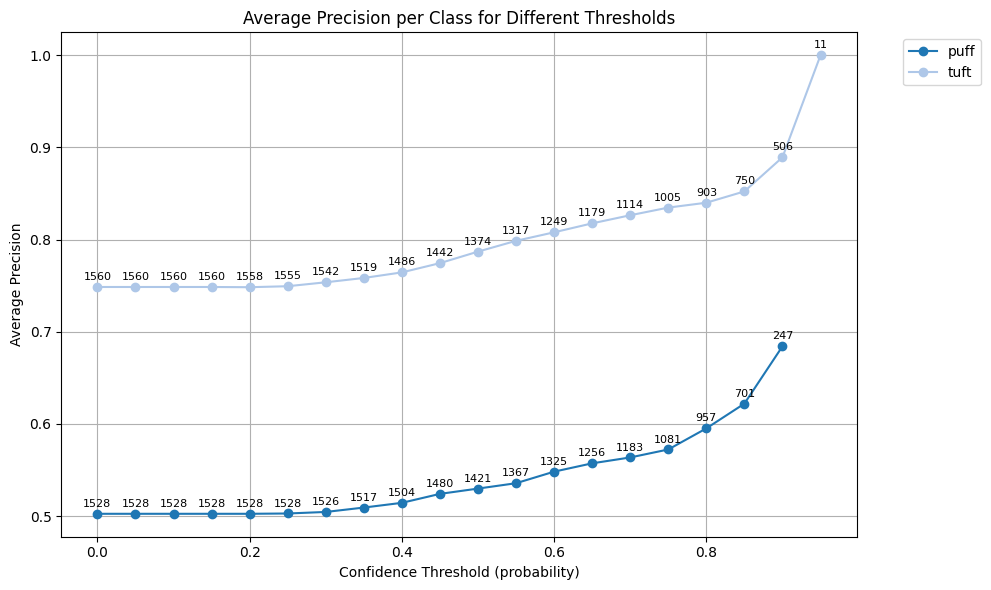

In [ ]:
df_puff = pd.read_csv('/home/fanny/Profiles/ET_non-living_export__TSV_17720_20250808_0926/ecotaxa_puff.tsv', sep='\t')
df_tuft = pd.read_csv('/home/fanny/Profiles/ET_non-living_export__TSV_17720_20250808_0926/ecotaxa_tuft.tsv', sep='\t')
df_trichodesmium = pd.concat([df_puff, df_tuft], ignore_index=True)
non_living_df = pd.read_csv('/home/fanny/Downloads/non_living_predicted.csv')
non_living_CTD50_df = non_living_df[non_living_df['sample_id'] == 'M181-175-1_CTD-050_00Â°00S-019Â°00W_20220509-0543']


thresholds = np.arange(0, 1.01, 0.05)
#classes = df_trichodesmium['object_annotation_category'].unique()
classes_to_plot = ['puff', 'tuft']
cmap = plt.get_cmap('tab20')  # or 'tab10', 'Set1'

plt.figure(figsize=(10,6))

for idx, cls in enumerate(classes_to_plot):
    precisions = []
    counts = []
    for thresh in thresholds:
        filtered = non_living_CTD50_df[(non_living_CTD50_df['top1'] == cls) & (non_living_CTD50_df['prob1'] >= thresh)]
        total_predictions = len(filtered)
        true_positives = (filtered['object_annotation_status'] == 'validated').sum()
        counts.append(true_positives)
        if total_predictions > 0:
            precisions.append(true_positives / total_predictions)
        else:
            precisions.append(np.nan)
    plt.plot(thresholds, precisions, marker='o', label=cls, color=cmap(idx % cmap.N))
    # Annotate each point with the count
    for x, y, count in zip(thresholds, precisions, counts):
        if not np.isnan(y):
            plt.annotate(str(count), (x, y), textcoords="offset points", xytext=(0,5), ha='center', fontsize=8)

plt.xlabel('Confidence Threshold (probability)')
plt.ylabel('Average Precision')
plt.title('Average Precision per Class for Different Thresholds')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()





/tmp/ipykernel_2285477/2904629836.py:4: DtypeWarning: Columns (11,12,13,14) have mixed types. Specify dtype option on import or set low_memory=False.
  non_living_df = pd.read_csv('/home/fanny/Downloads/non_living_predicted.csv')


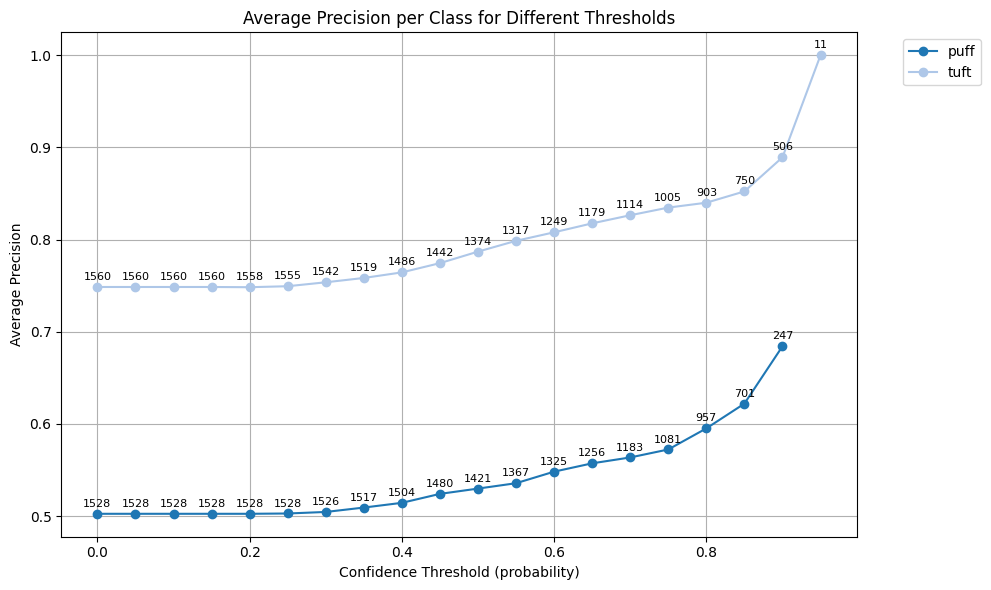

In [ ]:
df_puff = pd.read_csv('/home/fanny/Profiles/ET_non-living_export__TSV_17720_20250808_0926/ecotaxa_puff.tsv', sep='\t')
df_tuft = pd.read_csv('/home/fanny/Profiles/ET_non-living_export__TSV_17720_20250808_0926/ecotaxa_tuft.tsv', sep='\t')
df_trichodesmium = pd.concat([df_puff, df_tuft], ignore_index=True)
non_living_df = pd.read_csv('/home/fanny/Plots/non_living_predicted.csv')
non_living_CTD50_df = non_living_df[non_living_df['sample_id'] == 'M181-175-1_CTD-050_00Â°00S-019Â°00W_20220509-0543']
non_living_CTD37_df = non_living_df[non_living_df['sample_id'] == 'M181-112-1_CTD-037_00Â°00S-008Â°00W_20220504-1758']
non_living_CTD60_df = non_living_df[non_living_df['sample_id'] == 'M181-227-1_CTD-060_00Â°00S-027Â°00W_20220512-1748']
non_living_CTD75_df = non_living_df[non_living_df['sample_id'] == 'M181-285-1_CTD-075_00Â°00S-039Â°00W_20220517-2024']
non_living_CTD81_df = non_living_df[non_living_df['sample_id'] == 'M181-297-1_CTD-081_00Â°00S-041Â°50W_20220519-0218']

thresholds = np.arange(0, 1.01, 0.05)
#classes = df_trichodesmium['object_annotation_category'].unique()
classes_to_plot = ['puff', 'tuft']
cmap = plt.get_cmap('tab20')  # or 'tab10', 'Set1'

plt.figure(figsize=(10,6))

for idx, cls in enumerate(classes_to_plot):
    precisions = []
    counts = []
    # for i, thresh in enumerate(thresholds):
    #     filtered = non_living_CTD50_df[(non_living_CTD50_df['top1'] == cls) & (non_living_CTD50_df['prob1'] >= thresh)]
    #     total_predictions = len(filtered)
    #     true_positives = (filtered['object_annotation_status'] == 'validated').sum()
    #     counts.append(true_positives)
    #     if total_predictions > 0:
    #         precisions.append(true_positives / total_predictions)
    #     else:
    #         precisions.append(np.nan)

    #     pred_positives = precisions[i]*total_predictions

    # Add this to your existing code:
    for i, thresh in enumerate(thresholds):
        filtered = non_living_CTD50_df[(non_living_CTD50_df['top1'] == cls) & (non_living_CTD50_df['prob1'] >= thresh)]
        total_predictions = len(filtered)
        true_positives = (filtered['object_annotation_status'] == 'validated').sum()
        counts.append(true_positives)

        # Calculate precision
        if total_predictions > 0:
            precision = true_positives / total_predictions
        else:
            precision = np.nan
    
        precisions.append(precision)

    plt.plot(thresholds, precisions, marker='o', label=cls, color=cmap(idx % cmap.N))

    # Annotate each point with the count
    for x, y, count in zip(thresholds, precisions, counts):
        if not np.isnan(y):
            plt.annotate(str(count), (x, y), textcoords="offset points", xytext=(0,5), ha='center', fontsize=8)

plt.xlabel('Confidence Threshold (probability)')
plt.ylabel('Average Precision')
plt.title('Average Precision per Class for Different Thresholds')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()





/tmp/ipykernel_833581/2672183757.py:2: DtypeWarning: Columns (11,12,13,14) have mixed types. Specify dtype option on import or set low_memory=False.
  non_living_df = pd.read_csv('/home/fanny/Profiles/non_living_predicted.csv')


Analyzing 2 classes: ['puff', 'tuft']


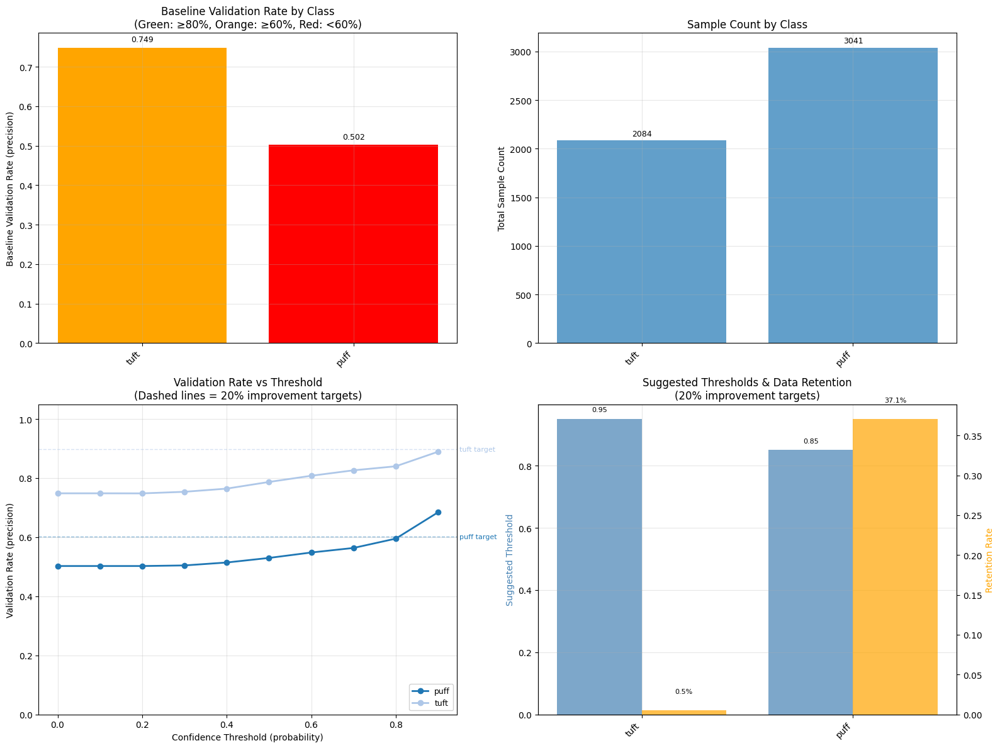


THRESHOLD SELECTION SUMMARY - NON-LIVING DATA (PUFF & TUFT)
Class           Baseline  Target    Threshold  Achieved  Retained  Retention 
----------------------------------------------------------------------------------------------------
tuft            0.749     0.898     0.95       1.000     11        0.5%     
puff            0.502     0.603     0.85       0.622     1127      37.1%    

THRESHOLD RECOMMENDATIONS:

MEDIUM QUALITY CLASSES (baseline 60-80%):
Recommendation: Use higher thresholds (0.7-0.9) to improve quality
  tuft: threshold 0.95 → 100.0% validation rate

LOW QUALITY CLASSES (baseline < 60%):
Recommendation: Use very high thresholds (0.8+) or consider class-specific model retraining
  puff: threshold 0.85 → 62.2% validation rate


In [ ]:
# Load the non-living data
non_living_df = pd.read_csv('/home/fanny/Profiles/non_living_predicted.csv')
non_living_CTD50_df = non_living_df[non_living_df['sample_id'] == 'M181-175-1_CTD-050_00Â°00S-019Â°00W_20220509-0543']

def calculate_baseline_rates_nonliving(df, confidence_col='prob1'):
    """Calculate baseline validation rate for each class (at threshold 0)"""
    baseline_rates = {}
    
    for cls in df['top1'].unique():  # Changed from 'object_annotation_category' to 'top1'
        class_data = df[df['top1'] == cls]
        total = len(class_data)
        validated = (class_data['object_annotation_status'] == 'validated').sum()
        baseline_rate = validated / total if total > 0 else 0
        baseline_rates[cls] = baseline_rate
        
    return baseline_rates

def find_improvement_threshold_nonliving(df, class_name, improvement_factor=1.2, confidence_col='prob1'):
    """Find threshold where validation rate improves by improvement_factor over baseline"""
    baseline_rates = calculate_baseline_rates_nonliving(df, confidence_col)
    target_rate = min(0.95, baseline_rates[class_name] * improvement_factor)  # Cap at 95%
    
    thresholds = np.arange(0, 1.01, 0.05)
    
    for thresh in sorted(thresholds):
        filtered = df[(df['top1'] == class_name) & 
                     (df[confidence_col] >= thresh)]
        
        if len(filtered) == 0:
            continue
            
        validation_rate = (filtered['object_annotation_status'] == 'validated').sum() / len(filtered)
        
        if validation_rate >= target_rate:
            return thresh, validation_rate, len(filtered), target_rate
    
    return 1.0, 0.0, 0, target_rate

def plot_interactive_threshold_analysis_nonliving(df, confidence_col='prob1', exclude_classes=[], classes_to_analyze=['puff', 'tuft']):
    """Create comprehensive analysis plots for threshold selection - Non-living data version"""
    
    # Filter for only the classes we want to analyze
    df_working = df[df['top1'].isin(classes_to_analyze)].copy()
    
    all_classes = df_working['top1'].unique()
    classes = [cls for cls in all_classes if cls not in exclude_classes]
    
    print(f"Analyzing {len(classes)} classes: {classes}")
    
    baseline_rates = calculate_baseline_rates_nonliving(df_working, confidence_col)
    
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    
    # Plot 1: Baseline rates comparison
    sorted_classes = sorted(classes, key=lambda x: baseline_rates[x], reverse=True)
    baseline_values = [baseline_rates[cls] for cls in sorted_classes]
    
    bars = axes[0,0].bar(range(len(sorted_classes)), baseline_values, 
                         color=['green' if r >= 0.8 else 'orange' if r >= 0.6 else 'red' for r in baseline_values])
    axes[0,0].set_xticks(range(len(sorted_classes)))
    axes[0,0].set_xticklabels(sorted_classes, rotation=45, ha='right')
    axes[0,0].set_ylabel('Baseline Validation Rate (precision)')
    axes[0,0].set_title('Baseline Validation Rate by Class\n(Green: ≥80%, Orange: ≥60%, Red: <60%)')
    axes[0,0].grid(True, alpha=0.3)
    
    # Add value labels on bars
    for i, (cls, rate) in enumerate(zip(sorted_classes, baseline_values)):
        axes[0,0].text(i, rate + 0.01, f'{rate:.3f}', ha='center', va='bottom', fontsize=9)
    
    # Plot 2: Sample counts
    counts = [len(df_working[df_working['top1'] == cls]) for cls in sorted_classes]
    axes[0,1].bar(range(len(sorted_classes)), counts, alpha=0.7)
    axes[0,1].set_xticks(range(len(sorted_classes)))
    axes[0,1].set_xticklabels(sorted_classes, rotation=45, ha='right')
    axes[0,1].set_ylabel('Total Sample Count')
    axes[0,1].set_title('Sample Count by Class')
    axes[0,1].grid(True, alpha=0.3)
    
    # Add count labels
    for i, count in enumerate(counts):
        axes[0,1].text(i, count + max(counts)*0.01, str(count), ha='center', va='bottom', fontsize=9)
    
    # Plot 3: Precision curves with improvement targets
    thresholds = np.arange(0, 1.01, 0.1)
    cmap = plt.get_cmap('tab20')
    
    for idx, cls in enumerate(classes):
        precisions = []
        counts_at_thresh = []
        for thresh in thresholds:
            filtered = df_working[(df_working['top1'] == cls) & (df_working[confidence_col] >= thresh)]
            total_predictions = len(filtered)
            true_positives = (filtered['object_annotation_status'] == 'validated').sum()
            counts_at_thresh.append(total_predictions)
            if total_predictions > 0:
                precisions.append(true_positives / total_predictions)
            else:
                precisions.append(np.nan)
        
        color = cmap(idx % cmap.N)
        axes[1,0].plot(thresholds, precisions, marker='o', label=cls, color=color, linewidth=2)
        
        # Add horizontal line at 20% improvement target
        improvement_target = min(0.95, baseline_rates[cls] * 1.2)
        axes[1,0].axhline(y=improvement_target, color=color, 
                         linestyle='--', alpha=0.5, linewidth=1)
        
        # Add text annotation for target
        axes[1,0].text(0.95, improvement_target, f'{cls} target', 
                      color=color, fontsize=8, va='center')
    
    axes[1,0].set_xlabel('Confidence Threshold (probability)')
    axes[1,0].set_ylabel('Validation Rate (precision)')
    axes[1,0].set_title('Validation Rate vs Threshold\n(Dashed lines = 20% improvement targets)')
    axes[1,0].legend(loc='lower right', fontsize=9, framealpha=0.9)
    axes[1,0].grid(True, alpha=0.3)
    axes[1,0].set_ylim(0, 1.05)
    
    # Plot 4: Suggested thresholds and their effects
    suggested_data = []
    for cls in sorted_classes:
        thresh, rate, count, target = find_improvement_threshold_nonliving(df_working, cls, 1.2, confidence_col)
        total_samples = len(df_working[df_working['top1'] == cls])
        retention = count / total_samples if total_samples > 0 else 0
        suggested_data.append({
            'class': cls,
            'threshold': thresh,
            'achieved_rate': rate,
            'retention': retention,
            'retained_count': count,
            'total_count': total_samples
        })
    
    # Bar plot of suggested thresholds
    thresholds_vals = [d['threshold'] for d in suggested_data]
    retention_vals = [d['retention'] for d in suggested_data]
    
    ax4_twin = axes[1,1].twinx()
    
    bars1 = axes[1,1].bar([i-0.2 for i in range(len(sorted_classes))], thresholds_vals, 
                         width=0.4, label='Suggested Threshold', alpha=0.7, color='steelblue')
    bars2 = ax4_twin.bar([i+0.2 for i in range(len(sorted_classes))], retention_vals, 
                        width=0.4, label='Data Retention Rate', alpha=0.7, color='orange')
    
    axes[1,1].set_xticks(range(len(sorted_classes)))
    axes[1,1].set_xticklabels(sorted_classes, rotation=45, ha='right')
    axes[1,1].set_ylabel('Suggested Threshold', color='steelblue')
    ax4_twin.set_ylabel('Retention Rate', color='orange')
    axes[1,1].set_title('Suggested Thresholds & Data Retention\n(20% improvement targets)')
    
    # Add value labels
    for i, (thresh, ret) in enumerate(zip(thresholds_vals, retention_vals)):
        axes[1,1].text(i-0.2, thresh + 0.02, f'{thresh:.2f}', ha='center', va='bottom', fontsize=8)
        ax4_twin.text(i+0.2, ret + 0.02, f'{ret:.1%}', ha='center', va='bottom', fontsize=8)
    
    axes[1,1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Print detailed summary table
    print("\n" + "="*100)
    print("THRESHOLD SELECTION SUMMARY - NON-LIVING DATA (PUFF & TUFT)")
    print("="*100)
    print(f"{'Class':<15} {'Baseline':<9} {'Target':<9} {'Threshold':<10} {'Achieved':<9} {'Retained':<9} {'Retention':<10}")
    print("-" * 100)
    
    for data in suggested_data:
        baseline = baseline_rates[data['class']]
        target_rate = min(0.95, baseline * 1.2)
        print(f"{data['class']:<15} {baseline:<9.3f} {target_rate:<9.3f} {data['threshold']:<10.2f} "
              f"{data['achieved_rate']:<9.3f} {data['retained_count']:<9d} {data['retention']:<9.1%}")
    
    print("\n" + "="*100)
    print("THRESHOLD RECOMMENDATIONS:")
    print("="*100)
    
    # Group classes by quality tiers
    high_quality = [d for d in suggested_data if baseline_rates[d['class']] >= 0.8]
    medium_quality = [d for d in suggested_data if 0.6 <= baseline_rates[d['class']] < 0.8]
    low_quality = [d for d in suggested_data if baseline_rates[d['class']] < 0.6]
    
    if high_quality:
        print("\nHIGH QUALITY CLASSES (baseline ≥ 80%):")
        print("Recommendation: Use moderate thresholds (0.5-0.8) to maintain high validation rates")
        for d in high_quality:
            print(f"  {d['class']}: threshold {d['threshold']:.2f} → {d['achieved_rate']:.1%} validation rate")
    
    if medium_quality:
        print("\nMEDIUM QUALITY CLASSES (baseline 60-80%):")
        print("Recommendation: Use higher thresholds (0.7-0.9) to improve quality")
        for d in medium_quality:
            print(f"  {d['class']}: threshold {d['threshold']:.2f} → {d['achieved_rate']:.1%} validation rate")
    
    if low_quality:
        print("\nLOW QUALITY CLASSES (baseline < 60%):")
        print("Recommendation: Use very high thresholds (0.8+) or consider class-specific model retraining")
        for d in low_quality:
            print(f"  {d['class']}: threshold {d['threshold']:.2f} → {d['achieved_rate']:.1%} validation rate")
    
    return suggested_data

# Apply the analysis to your non-living data
suggested_thresholds_nonliving = plot_interactive_threshold_analysis_nonliving(
    non_living_CTD50_df, 
    'prob1', 
    exclude_classes=[], 
    classes_to_analyze=['puff', 'tuft']
)

/tmp/ipykernel_833581/3350395458.py:2: DtypeWarning: Columns (11,12,13,14) have mixed types. Specify dtype option on import or set low_memory=False.
  non_living_df = pd.read_csv('/home/fanny/Downloads/non_living_predicted.csv')


Total trichodesmium samples (puff + tuft): 5125
Unique classes in top1: ['trichodesmium']
Analyzing 1 classes: ['trichodesmium']


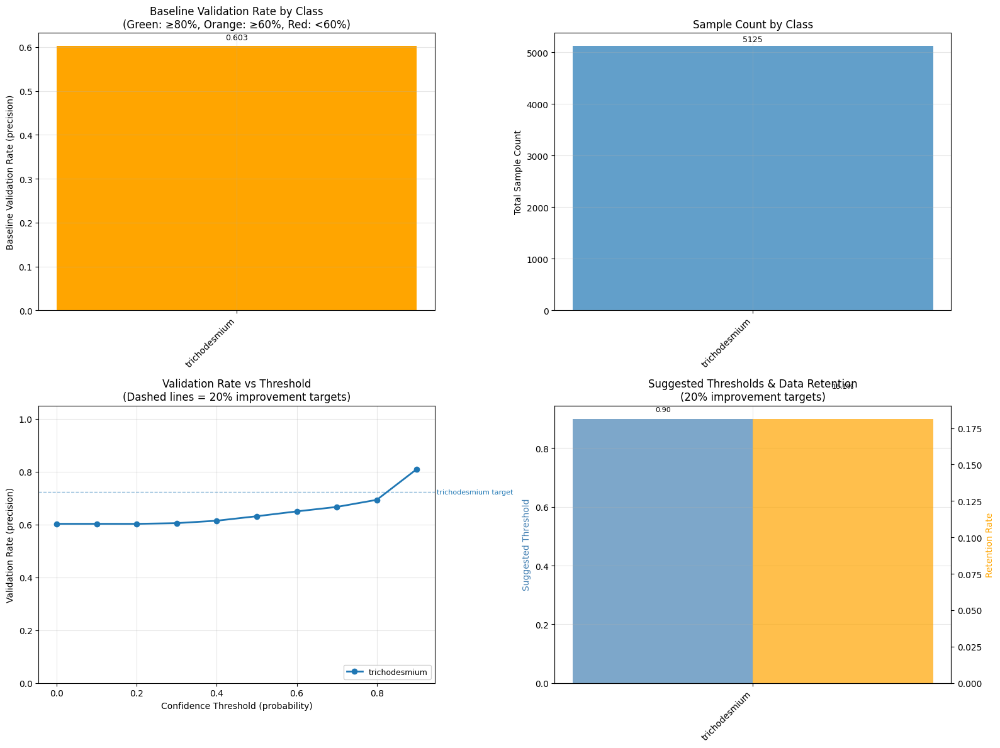


THRESHOLD SELECTION SUMMARY - NON-LIVING DATA (PUFF & TUFT)
Class           Baseline  Target    Threshold  Achieved  Retained  Retention 
----------------------------------------------------------------------------------------------------
trichodesmium   0.603     0.723     0.90       0.810     930       18.1%    

THRESHOLD RECOMMENDATIONS:

MEDIUM QUALITY CLASSES (baseline 60-80%):
Recommendation: Use higher thresholds (0.7-0.9) to improve quality
  trichodesmium: threshold 0.90 → 81.0% validation rate


In [18]:
# Load the non-living data
non_living_df = pd.read_csv('/home/fanny/Downloads/non_living_predicted.csv')
non_living_CTD50_df = non_living_df[non_living_df['sample_id'] == 'M181-175-1_CTD-050_00Â°00S-019Â°00W_20220509-0543'].copy()

# Create a combined trichodesmium analysis
# Method 1: Modify the top1 column to combine puff and tuft
tricho_mask = (non_living_CTD50_df['top1'] == 'puff') | (non_living_CTD50_df['top1'] == 'tuft')
non_living_CTD50_df.loc[tricho_mask, 'top1_combined'] = 'trichodesmium'

# Create a version with the combined column for analysis
df_for_analysis = non_living_CTD50_df[tricho_mask].copy()
df_for_analysis['top1'] = 'trichodesmium'  # Replace top1 with combined class

print(f"Total trichodesmium samples (puff + tuft): {len(df_for_analysis)}")
print(f"Unique classes in top1: {df_for_analysis['top1'].unique()}")

# Now run the analysis on the combined data
suggested_thresholds_tricho = plot_interactive_threshold_analysis_nonliving(
    df_for_analysis, 
    'prob1', 
    exclude_classes=[], 
    classes_to_analyze=['trichodesmium']  # Use lowercase to match what we created
)

In [21]:
# Load the full non-living dataset
non_living_df = pd.read_csv('/home/fanny/Profiles/non_living_predicted.csv')

# Get the suggested thresholds from your analysis
# If you don't have them stored, run the analysis first to get them
if 'suggested_thresholds_nonliving' not in locals():
    # Run the threshold analysis on CTD50 to get recommendations
    non_living_CTD50_df = non_living_df[non_living_df['sample_id'] == 'M181-175-1_CTD-050_00Â°00S-019Â°00W_20220509-0543']
    suggested_thresholds_nonliving = plot_interactive_threshold_analysis_nonliving(
        non_living_CTD50_df, 
        'prob1', 
        exclude_classes=[], 
        classes_to_analyze=['puff', 'tuft']
    )

# Extract thresholds for each class
class_thresholds = {}
for item in suggested_thresholds_nonliving:
    class_thresholds[item['class']] = item['threshold']

print("Recommended thresholds:")
for cls, thresh in class_thresholds.items():
    print(f"  {cls}: {thresh:.2f}")

# Apply thresholds to filter the full dataset
def apply_confidence_thresholds(df, thresholds_dict, confidence_col='prob1', class_col='top1'):
    """
    Apply confidence thresholds to filter dataset by class
    """
    filtered_rows = []
    
    for cls, threshold in thresholds_dict.items():
        # Get all rows for this class
        class_data = df[df[class_col] == cls].copy()
        
        # Filter by confidence threshold
        filtered_class_data = class_data[class_data[confidence_col] >= threshold].copy()
        
        # Add threshold info to the data
        filtered_class_data['applied_threshold'] = threshold
        filtered_class_data['threshold_method'] = '20pct_improvement'
        
        filtered_rows.append(filtered_class_data)
        
        print(f"Class '{cls}': {len(class_data)} → {len(filtered_class_data)} samples "
              f"(threshold: {threshold:.2f}, retention: {len(filtered_class_data)/len(class_data)*100:.1f}%)")
    
    # Combine all filtered classes
    if filtered_rows:
        filtered_df = pd.concat(filtered_rows, ignore_index=True)
        return filtered_df
    else:
        return pd.DataFrame()

# Apply thresholds to the full dataset
filtered_dataset = apply_confidence_thresholds(
    non_living_df, 
    class_thresholds, 
    confidence_col='prob1', 
    class_col='top1'
)

print(f"\nOriginal dataset: {len(non_living_df)} samples")
print(f"Filtered dataset: {len(filtered_dataset)} samples")
print(f"Overall retention: {len(filtered_dataset)/len(non_living_df)*100:.1f}%")

# Show breakdown by sample_id
print("\nBreakdown by sample (profile):")
profile_summary = filtered_dataset.groupby(['sample_id', 'top1']).agg({
    'object_id': 'count',
    'applied_threshold': 'first',
    'prob1': ['min', 'mean', 'max']
}).round(3)

profile_summary.columns = ['Count', 'Threshold_Applied', 'Min_Confidence', 'Mean_Confidence', 'Max_Confidence']
print(profile_summary)

# Save the filtered dataset
output_path = '/home/fanny/Profiles/non_living_predicted_filtered.csv'
filtered_dataset.to_csv(output_path, index=False)
print(f"\nFiltered dataset saved to: {output_path}")

# Create summary statistics
summary_stats = []
for profile in filtered_dataset['sample_id'].unique():
    profile_data = filtered_dataset[filtered_dataset['sample_id'] == profile]
    
    for cls in ['puff', 'tuft']:
        cls_data = profile_data[profile_data['top1'] == cls]
        if len(cls_data) > 0:
            summary_stats.append({
                'Profile': profile.split('_')[1],  # Extract CTD number
                'Class': cls,
                'Count': len(cls_data),
                'Min_Confidence': cls_data['prob1'].min(),
                'Mean_Confidence': cls_data['prob1'].mean(),
                'Max_Confidence': cls_data['prob1'].max(),
                'Threshold_Used': cls_data['applied_threshold'].iloc[0]
            })

summary_df = pd.DataFrame(summary_stats)
print("\nSummary by Profile and Class:")
print(summary_df.round(3))

/tmp/ipykernel_833581/2867417661.py:2: DtypeWarning: Columns (11,12,13,14) have mixed types. Specify dtype option on import or set low_memory=False.
  non_living_df = pd.read_csv('/home/fanny/Profiles/non_living_predicted.csv')


Recommended thresholds:
  tuft: 0.95
  puff: 0.85
Class 'tuft': 9270 → 27 samples (threshold: 0.95, retention: 0.3%)
Class 'puff': 9196 → 2669 samples (threshold: 0.85, retention: 29.0%)

Original dataset: 233396 samples
Filtered dataset: 2696 samples
Overall retention: 1.2%

Breakdown by sample (profile):
                                                        Count  \
sample_id                                         top1          
M181-112-1_CTD-037_00Â°00S-008Â°00W_20220504-1758 puff    120   
M181-175-1_CTD-050_00Â°00S-019Â°00W_20220509-0543 puff   1127   
                                                  tuft     11   
M181-227-1_CTD-060_00Â°00S-027Â°00W_20220512-1748 puff    700   
                                                  tuft     12   
M181-285-1_CTD-075_00Â°00S-039Â°00W_20220517-2024 puff    134   
                                                  tuft      1   
M181-297-1_CTD-081_00Â°00S-041Â°50W_20220519-0218 puff    588   
                                          

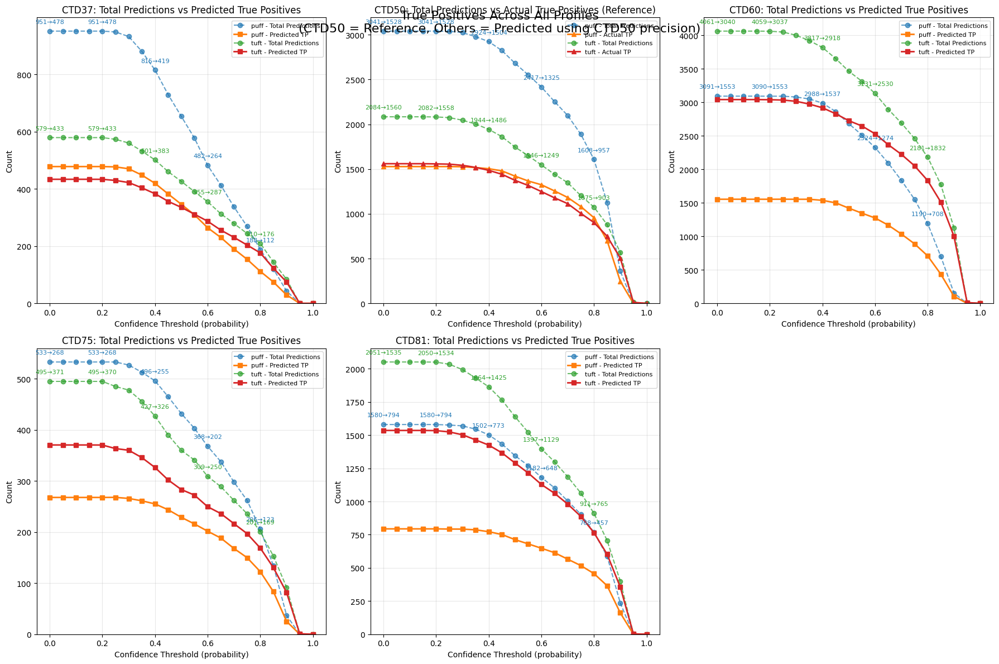

In [ ]:
# Now create multiplot for each profile
cmap = plt.get_cmap('tab10')
fig, axes = plt.subplots(2, 3, figsize=(18, 12))  # 2 rows, 3 columns
axes = axes.flatten()  # Make it easier to iterate

for plot_idx, (dataset_name, dataset_df) in enumerate(datasets.items()):
    ax = axes[plot_idx]
    
    for idx, cls in enumerate(classes_to_plot):
        total_predictions = []
        predicted_positives = []
        actual_tp = []  # For CTD50, we have actual validation data
        
        for i, thresh in enumerate(thresholds):
            # Filter data at this threshold
            filtered = dataset_df[(dataset_df['top1'] == cls) & 
                                (dataset_df['prob1'] >= thresh)]
            total_pred = len(filtered)
            total_predictions.append(total_pred)
            
            # Calculate predicted positives using precision curve from CTD50
            if not np.isnan(precision_curves[cls][i]) and total_pred > 0:
                pred_pos = precision_curves[cls][i] * total_pred
            else:
                pred_pos = 0
            predicted_positives.append(pred_pos)
            
            # For CTD50, also calculate actual true positives
            if dataset_name == 'CTD50':
                true_pos = (filtered['object_annotation_status'] == 'validated').sum()
                actual_tp.append(true_pos)
            else:
                actual_tp.append(np.nan)
        
        # Plot total predictions
        ax.plot(thresholds, total_predictions, 
               marker='o', linestyle='--', alpha=0.7, 
               label=f'{cls} - Total Predictions', 
               color=cmap(idx*2))
        
        # For CTD50, only plot actual TP (not predicted, since they're the same)
        if dataset_name == 'CTD50':
            ax.plot(thresholds, actual_tp, 
                   marker='^', linestyle='-', linewidth=2,
                   label=f'{cls} - Actual TP', 
                   color=cmap(idx*2+1))
        else:
            # For other datasets, plot predicted positives
            ax.plot(thresholds, predicted_positives, 
                   marker='s', linestyle='-', linewidth=2,
                   label=f'{cls} - Predicted TP', 
                   color=cmap(idx*2+1))
        
        # Annotate key points
        for j, (x, total, pred_or_actual) in enumerate(zip(thresholds[::4], 
                                                           total_predictions[::4], 
                                                           actual_tp[::4] if dataset_name == 'CTD50' else predicted_positives[::4])):
            if total > 0:
                ax.annotate(f'{total:.0f}→{pred_or_actual:.0f}', 
                          (x, total), textcoords="offset points", 
                          xytext=(0, 10), ha='center', fontsize=8,
                          color=cmap(idx*2))
    
    ax.set_xlabel('Confidence Threshold (probability)')
    ax.set_ylabel('Count')
    if dataset_name == 'CTD50':
        ax.set_title(f'{dataset_name}: Total Predictions vs Actual True Positives (Reference)')
    else:
        ax.set_title(f'{dataset_name}: Total Predictions vs Predicted True Positives')
    ax.legend(fontsize=8)
    ax.grid(True, alpha=0.3)
    ax.set_ylim(bottom=0)

# Hide the empty subplot
if len(datasets) < 6:
    axes[5].set_visible(False)

plt.tight_layout()
plt.suptitle('True Positives Across All Profiles\n(CTD50 = Reference, Others = Predicted using CTD50 precision)', 
             fontsize=16, y=0.98)
plt.show()

In [ ]:
# 1. First, build your precision lookup table from validated CTD50 data
def build_precision_curves():
    thresholds = np.arange(0, 1.01, 0.05)
    classes_to_plot = ['puff', 'tuft']
    precision_curves = {}
    
    for cls in classes_to_plot:
        precisions = []
        for thresh in thresholds:
            filtered = non_living_CTD50_df[(non_living_CTD50_df['top1'] == cls) & 
                                         (non_living_CTD50_df['prob1'] >= thresh)]
            total_predictions = len(filtered)
            true_positives = (filtered['object_annotation_status'] == 'validated').sum()
            
            if total_predictions > 0:
                precision = true_positives / total_predictions
            else:
                precision = np.nan
            
            precisions.append(precision)
        
        precision_curves[cls] = precisions
    
    return precision_curves, thresholds

# 2. Apply precision curves to estimate TPs in unvalidated datasets
def estimate_true_positives(dataset_df, precision_curves, thresholds, class_name):
    """
    Estimate true positives in an unvalidated dataset using precision curves
    """
    estimated_results = []
    
    for i, thresh in enumerate(thresholds):
        # Count predictions at this threshold
        filtered = dataset_df[(dataset_df['top1'] == class_name) & 
                            (dataset_df['prob1'] >= thresh)]
        total_predictions = len(filtered)
        
        # Get precision from validated data
        precision = precision_curves[class_name][i]
        
        # Estimate true positives
        if not np.isnan(precision) and total_predictions > 0:
            estimated_tp = precision * total_predictions
            estimated_fp = total_predictions - estimated_tp
        else:
            estimated_tp = 0
            estimated_fp = 0
        
        estimated_results.append({
            'threshold': thresh,
            'total_predictions': total_predictions,
            'estimated_tp': estimated_tp,
            'estimated_fp': estimated_fp,
            'precision_used': precision
        })
    
    return pd.DataFrame(estimated_results)

# 3. Example usage for all your datasets
precision_curves, thresholds = build_precision_curves()

# Apply to unvalidated datasets
datasets = {
    'CTD37': non_living_CTD37_df,
    'CTD60': non_living_CTD60_df, 
    'CTD75': non_living_CTD75_df,
    'CTD81': non_living_CTD81_df
}

# Estimate for each dataset and class
for dataset_name, dataset_df in datasets.items():
    print(f"\n=== Dataset: {dataset_name} ===")
    
    for cls in ['puff', 'tuft']:
        print(f"\nClass: {cls}")
        estimates = estimate_true_positives(dataset_df, precision_curves, thresholds, cls)
        
        # Show key thresholds
        key_thresholds = [0.5, 0.7, 0.9]
        for thresh in key_thresholds:
            row = estimates[estimates['threshold'] == thresh]
            if not row.empty:
                total = row['total_predictions'].iloc[0]
                est_tp = row['estimated_tp'].iloc[0]
                precision = row['precision_used'].iloc[0]
                print(f"  Threshold {thresh:.1f}: {total:4.0f} predictions → {est_tp:4.0f} estimated TP (precision: {precision:.3f})")


=== Dataset: CTD37 ===

Class: puff
  Threshold 0.5:  653 predictions →  346 estimated TP (precision: 0.530)
  Threshold 0.9:   43 predictions →   29 estimated TP (precision: 0.684)

Class: tuft
  Threshold 0.5:  426 predictions →  335 estimated TP (precision: 0.787)
  Threshold 0.9:   84 predictions →   75 estimated TP (precision: 0.889)

=== Dataset: CTD60 ===

Class: puff
  Threshold 0.5: 2681 predictions → 1420 estimated TP (precision: 0.530)
  Threshold 0.9:  154 predictions →  105 estimated TP (precision: 0.684)

Class: tuft
  Threshold 0.5: 3463 predictions → 2725 estimated TP (precision: 0.787)
  Threshold 0.9: 1126 predictions → 1001 estimated TP (precision: 0.889)

=== Dataset: CTD75 ===

Class: puff
  Threshold 0.5:  432 predictions →  229 estimated TP (precision: 0.530)
  Threshold 0.9:   37 predictions →   25 estimated TP (precision: 0.684)

Class: tuft
  Threshold 0.5:  360 predictions →  283 estimated TP (precision: 0.787)
  Threshold 0.9:   92 predictions →   82 estima

/tmp/ipykernel_2285477/457510498.py:1: DtypeWarning: Columns (11,12,13,14) have mixed types. Specify dtype option on import or set low_memory=False.
  non_living_df = pd.read_csv('/home/fanny/Downloads/non_living_predicted.csv')


Precision curves calculated from CTD50


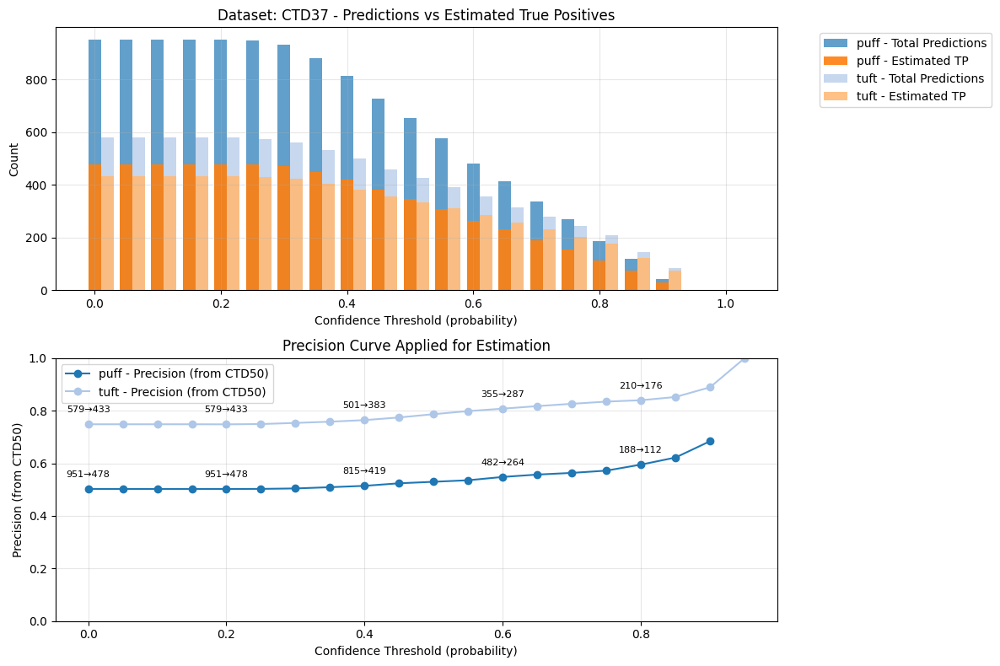

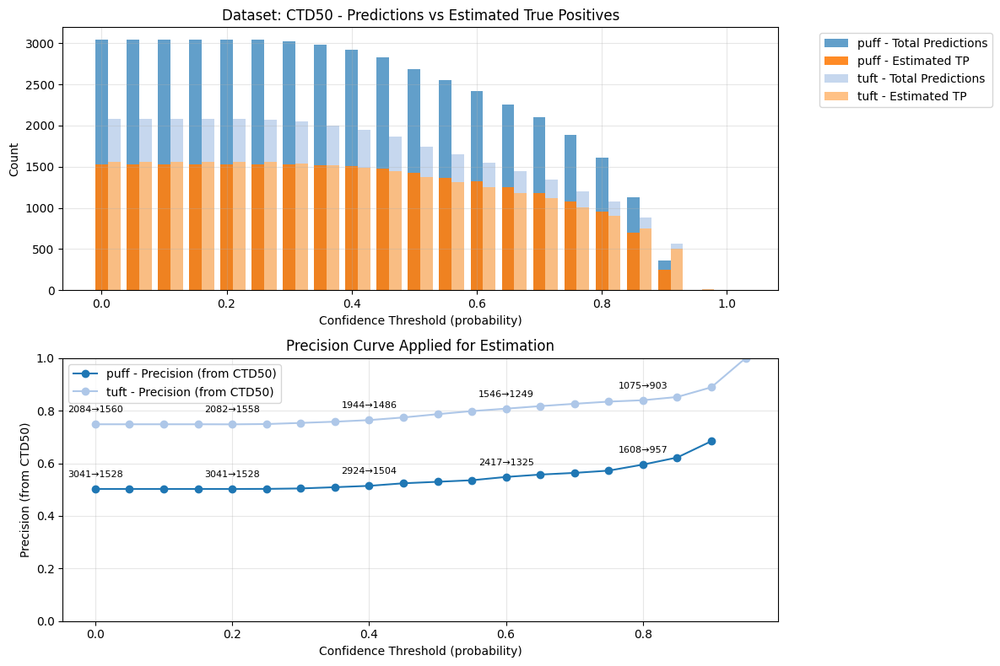

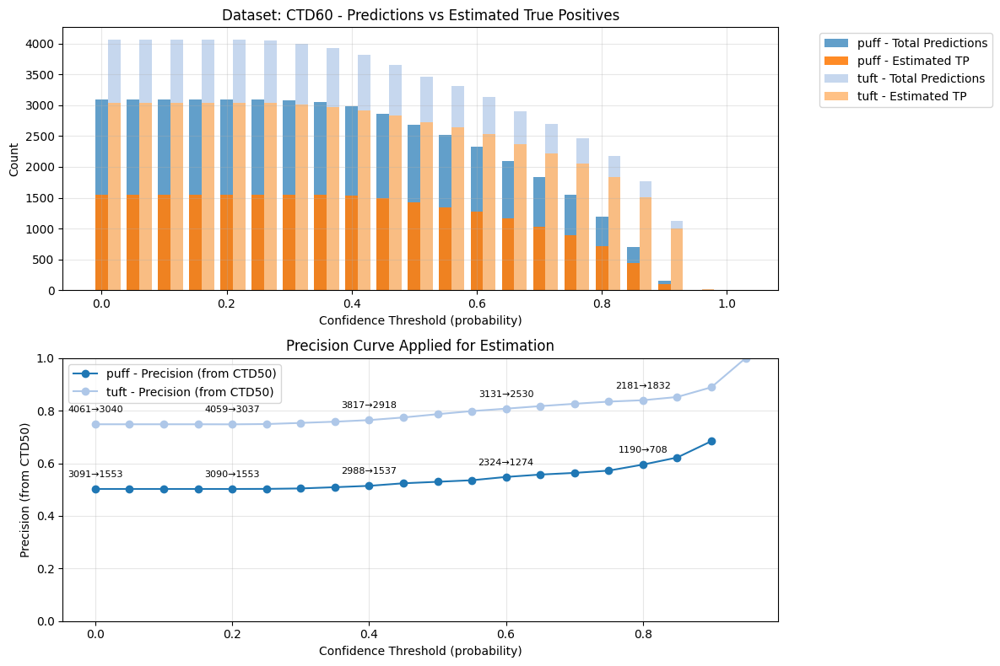

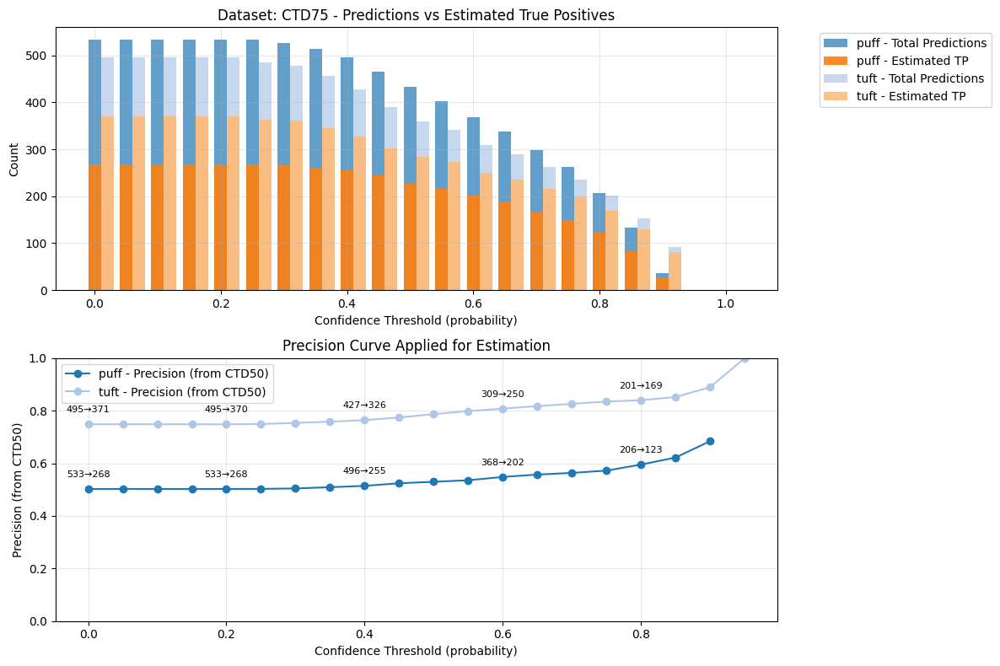

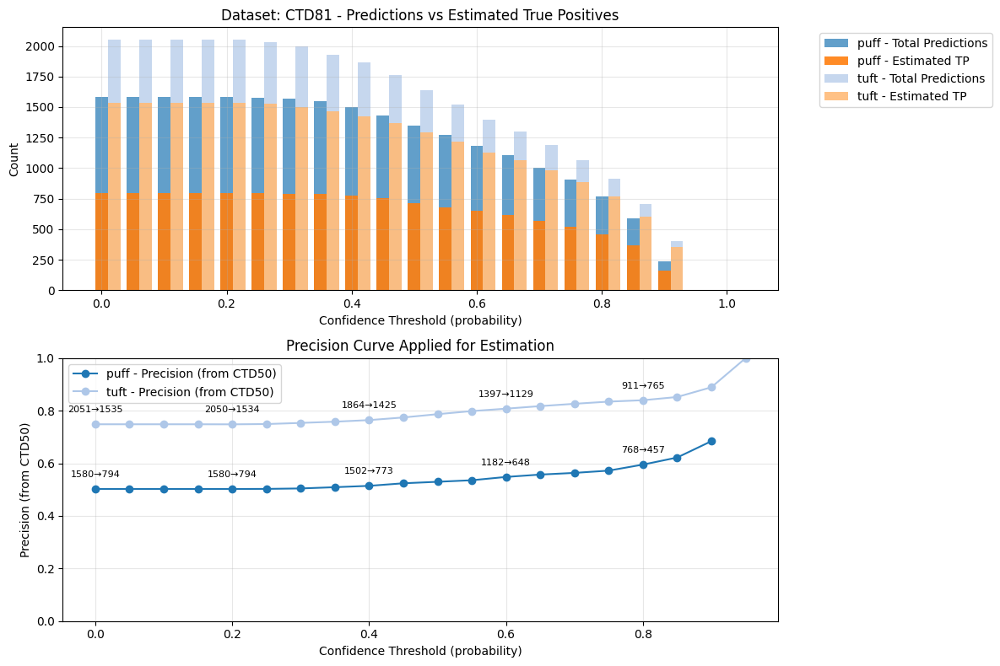


Summary of Estimated True Positives:
              Estimated_TP                           Total_Predictions        \
Threshold              0.5          0.7          0.9               0.5   0.7   
Dataset Class                                                                  
CTD37   puff    345.978001   187.787045    29.421053               653   337   
        tuft    335.237113   228.114424    74.699473               426   279   
CTD50   puff   1421.000000  1169.629104   247.000000              2682  2099   
        tuft   1374.000000  1102.144244   506.000000              1746  1348   
CTD60   puff   1420.470172  1022.519965   105.368421              2681  1835   
        tuft   2725.178694  2199.382802  1001.328647              3463  2690   
CTD75   puff    228.885906   166.055013    25.315789               432   298   
        tuft    283.298969   214.214979    81.813708               360   262   
CTD81   puff    712.619314   559.460515   161.473684              1345  1004   
  

In [ ]:
non_living_df = pd.read_csv('/home/fanny/Downloads/non_living_predicted.csv')
non_living_CTD50_df = non_living_df[non_living_df['sample_id'] == 'M181-175-1_CTD-050_00Â°00S-019Â°00W_20220509-0543']
non_living_CTD37_df = non_living_df[non_living_df['sample_id'] == 'M181-112-1_CTD-037_00Â°00S-008Â°00W_20220504-1758']
non_living_CTD60_df = non_living_df[non_living_df['sample_id'] == 'M181-227-1_CTD-060_00Â°00S-027Â°00W_20220512-1748']
non_living_CTD75_df = non_living_df[non_living_df['sample_id'] == 'M181-285-1_CTD-075_00Â°00S-039Â°00W_20220517-2024']
non_living_CTD81_df = non_living_df[non_living_df['sample_id'] == 'M181-297-1_CTD-081_00Â°00S-041Â°50W_20220519-0218']

# First, calculate the precision curve from the validated CTD50 dataset
thresholds = np.arange(0, 1.01, 0.05)
classes_to_plot = ['puff', 'tuft']
cmap = plt.get_cmap('tab20')

# Store precision curves from CTD50 (validated data)
precision_curves = {}

for cls in classes_to_plot:
    precisions = []
    for thresh in thresholds:
        filtered = non_living_CTD50_df[(non_living_CTD50_df['top1'] == cls) & 
                                       (non_living_CTD50_df['prob1'] >= thresh)]
        total_predictions = len(filtered)
        true_positives = (filtered['object_annotation_status'] == 'validated').sum()
        
        if total_predictions > 0:
            precision = true_positives / total_predictions
        else:
            precision = np.nan
        
        precisions.append(precision)
    
    precision_curves[cls] = precisions
    
print("Precision curves calculated from CTD50")

# Now apply these precision curves to estimate true positives in other datasets
datasets = {
    'CTD37': non_living_CTD37_df,
    'CTD50': non_living_CTD50_df,  # Include for comparison
    'CTD60': non_living_CTD60_df,
    'CTD75': non_living_CTD75_df,
    'CTD81': non_living_CTD81_df
}

# Plot estimated true positives for each dataset
for dataset_name, dataset_df in datasets.items():
    plt.figure(figsize=(12, 8))
    
    for idx, cls in enumerate(classes_to_plot):
        actual_counts = []
        estimated_tp = []
        
        for i, thresh in enumerate(thresholds):
            # Get predictions above threshold
            filtered = dataset_df[(dataset_df['top1'] == cls) & 
                                (dataset_df['prob1'] >= thresh)]
            total_predictions = len(filtered)
            actual_counts.append(total_predictions)
            
            # Apply precision from CTD50 to estimate true positives
            if not np.isnan(precision_curves[cls][i]) and total_predictions > 0:
                estimated_true_positives = precision_curves[cls][i] * total_predictions
            else:
                estimated_true_positives = 0
            
            estimated_tp.append(estimated_true_positives)
        
        # Plot total predictions and estimated true positives
        plt.subplot(2, 1, 1)
        plt.bar(thresholds + idx*0.02, actual_counts, width=0.02, alpha=0.7, 
               label=f'{cls} - Total Predictions', color=cmap(idx))
        plt.bar(thresholds + idx*0.02, estimated_tp, width=0.02, alpha=0.9,
               label=f'{cls} - Estimated TP', color=cmap(idx+2))
        
        # Plot precision curve used for estimation
        plt.subplot(2, 1, 2)
        plt.plot(thresholds, precision_curves[cls], marker='o', 
                label=f'{cls} - Precision (from CTD50)', color=cmap(idx))
        
        # Annotate with counts
        for x, y, count, est_tp in zip(thresholds[::4], precision_curves[cls][::4], 
                                      actual_counts[::4], estimated_tp[::4]):
            if not np.isnan(y):
                plt.annotate(f'{count:.0f}→{est_tp:.0f}', 
                           (x, y), textcoords="offset points", 
                           xytext=(0,10), ha='center', fontsize=8)
    
    plt.subplot(2, 1, 1)
    plt.xlabel('Confidence Threshold (probability)')
    plt.ylabel('Count')
    plt.title(f'Dataset: {dataset_name} - Predictions vs Estimated True Positives')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, alpha=0.3)
    
    plt.subplot(2, 1, 2)
    plt.xlabel('Confidence Threshold (probability)')
    plt.ylabel('Precision (from CTD50)')
    plt.title('Precision Curve Applied for Estimation')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.ylim(0, 1)
    
    plt.tight_layout()
    plt.show()

# Summary table of estimated true positives at different thresholds
summary_data = []
for dataset_name, dataset_df in datasets.items():
    for cls in classes_to_plot:
        for i, thresh in enumerate([0.5, 0.7, 0.9]):  # Key thresholds
            thresh_idx = int(thresh / 0.05)  # Convert to index
            if thresh_idx < len(thresholds):
                filtered = dataset_df[(dataset_df['top1'] == cls) & 
                                    (dataset_df['prob1'] >= thresh)]
                total_pred = len(filtered)
                
                if not np.isnan(precision_curves[cls][thresh_idx]):
                    est_tp = precision_curves[cls][thresh_idx] * total_pred
                    precision_used = precision_curves[cls][thresh_idx]
                else:
                    est_tp = 0
                    precision_used = 0
                
                summary_data.append({
                    'Dataset': dataset_name,
                    'Class': cls,
                    'Threshold': thresh,
                    'Total_Predictions': total_pred,
                    'Estimated_TP': est_tp,
                    'Precision_Applied': precision_used
                })

summary_df = pd.DataFrame(summary_data)
print("\nSummary of Estimated True Positives:")
print(summary_df.pivot_table(values=['Total_Predictions', 'Estimated_TP'], 
                           index=['Dataset', 'Class'], 
                           columns='Threshold', 
                           aggfunc='first'))

In [ ]:
print(precisions)

[np.float64(0.7485604606525912), np.float64(0.7485604606525912), np.float64(0.7485604606525912), np.float64(0.7485604606525912), np.float64(0.7483189241114313), np.float64(0.7493975903614458), np.float64(0.7536656891495601), np.float64(0.7583624563155267), np.float64(0.76440329218107), np.float64(0.7744360902255639), np.float64(0.7869415807560137), np.float64(0.7986658580958157), np.float64(0.8078913324708926), np.float64(0.8176144244105409), np.float64(0.8264094955489614), np.float64(0.834717607973422), np.float64(0.84), np.float64(0.8522727272727273), np.float64(0.8892794376098418), np.float64(1.0), nan]


In [ ]:
print(non_living_df['sample_id'].unique())

['M181-112-1_CTD-037_00Â°00S-008Â°00W_20220504-1758'
 'M181-175-1_CTD-050_00Â°00S-019Â°00W_20220509-0543'
 'M181-227-1_CTD-060_00Â°00S-027Â°00W_20220512-1748'
 'M181-285-1_CTD-075_00Â°00S-039Â°00W_20220517-2024'
 'M181-297-1_CTD-081_00Â°00S-041Â°50W_20220519-0218']


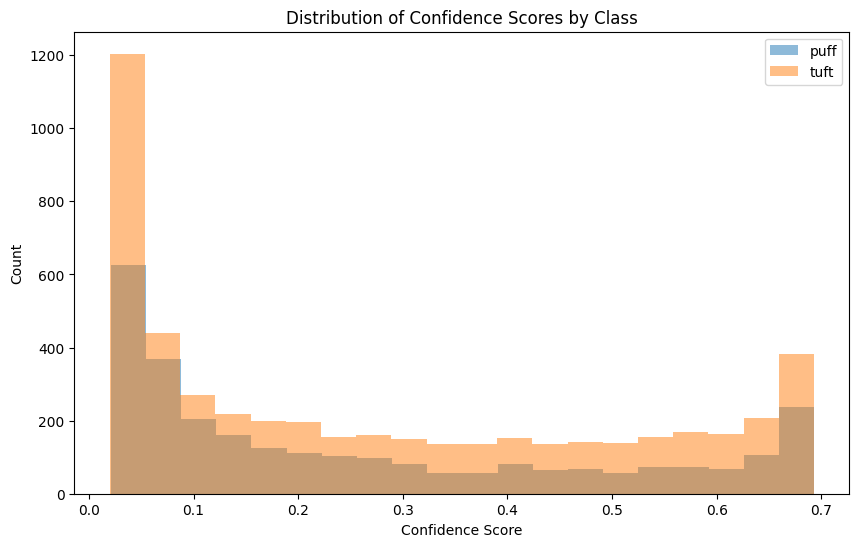

High confidence but not validated:
Empty DataFrame
Columns: [object_annotation_category, object_entropy, object_annotation_status]
Index: []


In [ ]:
# Check the distribution of confidence scores
plt.figure(figsize=(10,6))
for cls in classes:
    cls_data = df_trichodesmium[df_trichodesmium['object_annotation_category'] == cls]
    plt.hist(cls_data['object_entropy'], alpha=0.5, label=cls, bins=20)
plt.xlabel('Confidence Score')
plt.ylabel('Count')
plt.legend()
plt.title('Distribution of Confidence Scores by Class')
plt.show()

# Look at some high-confidence "invalid" examples
high_conf_invalid = df_trichodesmium[(df_trichodesmium['object_entropy'] > 0.8) & 
                                   (df_trichodesmium['object_annotation_status'] != 'validated')]
print("High confidence but not validated:")
print(high_conf_invalid[['object_annotation_category', 'object_entropy', 'object_annotation_status']].head(10))

/tmp/ipykernel_4057564/319936565.py:63: DtypeWarning: Columns (9,10,11,12) have mixed types. Specify dtype option on import or set low_memory=False.
  M181_PISCO2_deconv_fully_ViT_predicted_df = pd.read_csv('/home/fanny/Profiles/export__TSV_17785_20250814_1057_M181_PISCO2_deconv_fully_ViT_predicted/ecotaxa_export__TSV_17785_20250814_1057.tsv', sep='\t')


Building precision curves from validated data...
  not-living: baseline precision = 0.000
  Rhizaria: baseline precision = 0.359
  tuft: baseline precision = 0.994
  puff: baseline precision = 0.996
  Appendicularia: baseline precision = 0.491
  Copepoda: baseline precision = 0.546
  Pyrocystis: baseline precision = 0.138
  Chaetognatha: baseline precision = 0.647
  Bacillariophyceae: baseline precision = 0.014
  Asteroidea larvae: baseline precision = 0.285
  Thaliacea: baseline precision = 0.360
  Cnidaria: baseline precision = 0.688
  Eumalacostraca: baseline precision = 0.774
  Ctenophora: baseline precision = 0.309
  Noctiluca sp.: baseline precision = 0.193

Estimating performance for unvalidated dataset...


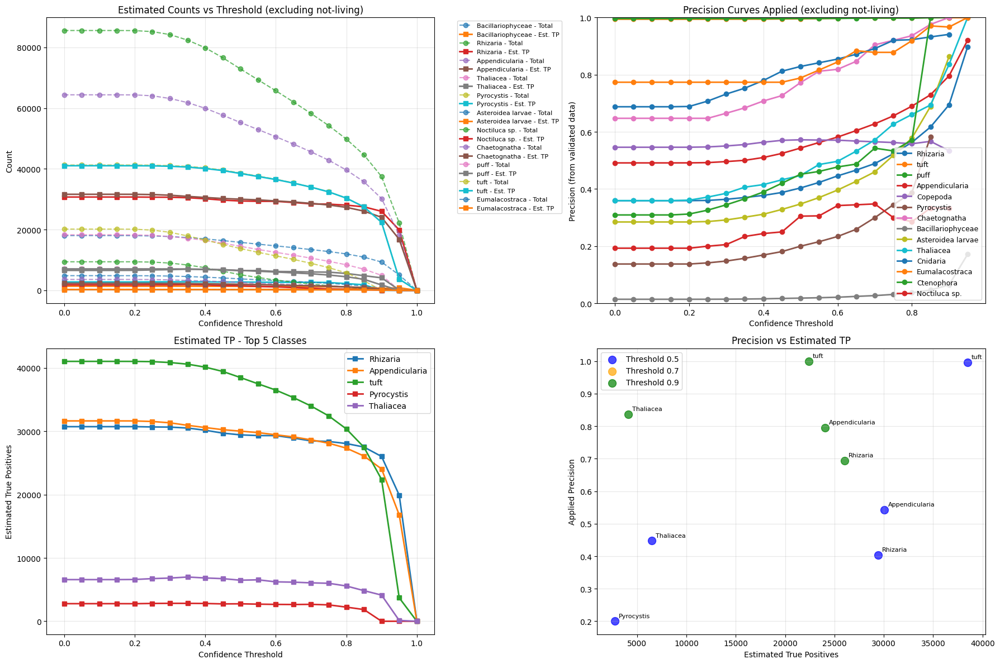


ESTIMATED PERFORMANCE SUMMARY (Top Classes)
Class                Threshold  Total_Pred   Est_TP     Precision 
------------------------------------------------------------------------------------------
Rhizaria             0.5        72918        29438      0.404     
Rhizaria             0.9        37478        26025      0.694     
Appendicularia       0.5        55267        30027      0.543     
Appendicularia       0.9        30229        24056      0.796     
tuft                 0.5        38664        38490      0.996     
tuft                 0.9        22409        22396      0.999     
Pyrocystis           0.5        13778        2756       0.200     
Pyrocystis           0.9        0            0          nan       
Thaliacea            0.5        14492        6483       0.447     
Thaliacea            0.9        4943         4131       0.836     
